In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['solar_activity'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  1

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 1981)
(11, 1981)


[I 2025-05-23 17:49:55,791] A new study created in memory with name: no-name-0756b1bc-e418-4e9b-bf90-3913b21479ca
[I 2025-05-23 17:56:41,973] Trial 0 finished with value: 10.755836582183838 and parameters: {'lr': 0.9573495892703717, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.43544415165820194}. Best is trial 0 with value: 10.755836582183838.


Cross Validation Accuracies:
[9.405901908874512, 4.183688163757324, 7.019636631011963, 9.467844009399414, 23.702112197875977]
Mean Cross Validation Accuracy:
10.755836582183838
Standard Deviation of Cross Validation Accuracy:
6.756324825172015


[I 2025-05-23 18:04:12,198] Trial 1 finished with value: 49.0496826171875 and parameters: {'lr': 0.5098495065876989, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4494140556015461}. Best is trial 0 with value: 10.755836582183838.


Cross Validation Accuracies:
[45.67074966430664, 45.47455978393555, 55.57827377319336, 47.278934478759766, 51.24589538574219]
Mean Cross Validation Accuracy:
49.0496826171875
Standard Deviation of Cross Validation Accuracy:
3.8673012075526128


[I 2025-05-23 18:12:07,590] Trial 2 finished with value: 0.21340277493000032 and parameters: {'lr': 0.0030404292096723557, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.35519208918349676}. Best is trial 2 with value: 0.21340277493000032.


Cross Validation Accuracies:
[0.21859294176101685, 0.20804212987422943, 0.22691398859024048, 0.21609796583652496, 0.1973668485879898]
Mean Cross Validation Accuracy:
0.21340277493000032
Standard Deviation of Cross Validation Accuracy:
0.010026387478941804


[I 2025-05-23 18:17:03,231] Trial 3 finished with value: 0.060094569623470304 and parameters: {'lr': 0.005469282933719443, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.35092600355930814}. Best is trial 3 with value: 0.060094569623470304.


Cross Validation Accuracies:
[0.05022013187408447, 0.049517516046762466, 0.06907061487436295, 0.07668978720903397, 0.05497479811310768]
Mean Cross Validation Accuracy:
0.060094569623470304
Standard Deviation of Cross Validation Accuracy:
0.01087714372992872


[I 2025-05-23 18:22:57,118] Trial 4 finished with value: 0.061000484973192215 and parameters: {'lr': 0.026461972492988203, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17318414158897583}. Best is trial 3 with value: 0.060094569623470304.


Cross Validation Accuracies:
[0.048643168061971664, 0.04878627136349678, 0.07144452631473541, 0.07681352645158768, 0.05931493267416954]
Mean Cross Validation Accuracy:
0.061000484973192215
Standard Deviation of Cross Validation Accuracy:
0.011522687726755994


[I 2025-05-23 18:27:45,450] Trial 5 finished with value: 0.06574981883168221 and parameters: {'lr': 0.5289028528952485, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2686906000765206}. Best is trial 3 with value: 0.060094569623470304.


Cross Validation Accuracies:
[0.04482589289546013, 0.06502974033355713, 0.07498709857463837, 0.08803032338619232, 0.05587603896856308]
Mean Cross Validation Accuracy:
0.06574981883168221
Standard Deviation of Cross Validation Accuracy:
0.014950377511397363


[I 2025-05-23 18:32:15,062] Trial 6 finished with value: 0.06114281192421913 and parameters: {'lr': 0.001068555160341507, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.20907383919784503}. Best is trial 3 with value: 0.060094569623470304.


Cross Validation Accuracies:
[0.05033308267593384, 0.04693245515227318, 0.07312631607055664, 0.07793417572975159, 0.057388029992580414]
Mean Cross Validation Accuracy:
0.06114281192421913
Standard Deviation of Cross Validation Accuracy:
0.012316145041663151


[I 2025-05-23 18:37:16,489] Trial 7 finished with value: 0.10433247089385986 and parameters: {'lr': 0.10361049255400363, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3191960029861137}. Best is trial 3 with value: 0.060094569623470304.


Cross Validation Accuracies:
[0.08017933368682861, 0.0996018722653389, 0.11388372629880905, 0.11207690834999084, 0.11592051386833191]
Mean Cross Validation Accuracy:
0.10433247089385986
Standard Deviation of Cross Validation Accuracy:
0.013350941027706986


[I 2025-05-23 18:44:57,733] Trial 8 finished with value: 0.2133159250020981 and parameters: {'lr': 0.0030660826302477745, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3529932751384185}. Best is trial 3 with value: 0.060094569623470304.


Cross Validation Accuracies:
[0.21204692125320435, 0.21330736577510834, 0.227561816573143, 0.21633614599704742, 0.1973273754119873]
Mean Cross Validation Accuracy:
0.2133159250020981
Standard Deviation of Cross Validation Accuracy:
0.009688253952935029


[I 2025-05-23 18:49:03,468] Trial 9 finished with value: 5.409250640869141 and parameters: {'lr': 0.8448405724819056, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.43525502630225577}. Best is trial 3 with value: 0.060094569623470304.


Cross Validation Accuracies:
[6.839613437652588, 5.772210597991943, 5.240365982055664, 4.41574764251709, 4.778315544128418]
Mean Cross Validation Accuracy:
5.409250640869141
Standard Deviation of Cross Validation Accuracy:
0.8475053973766817


[I 2025-05-23 18:54:18,460] Trial 10 finished with value: 0.0603239044547081 and parameters: {'lr': 0.018455192794838367, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.11989446608694176}. Best is trial 3 with value: 0.060094569623470304.


Cross Validation Accuracies:
[0.049580201506614685, 0.049242135137319565, 0.06971538066864014, 0.07788656651973724, 0.05519523844122887]
Mean Cross Validation Accuracy:
0.0603239044547081
Standard Deviation of Cross Validation Accuracy:
0.011499416538292426


[I 2025-05-23 18:58:54,149] Trial 11 finished with value: 0.060298968106508255 and parameters: {'lr': 0.015806655050198962, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.1068871052799748}. Best is trial 3 with value: 0.060094569623470304.


Cross Validation Accuracies:
[0.050229016691446304, 0.049920905381441116, 0.06886681914329529, 0.07762733101844788, 0.05485076829791069]
Mean Cross Validation Accuracy:
0.060298968106508255
Standard Deviation of Cross Validation Accuracy:
0.011067711788603784


[I 2025-05-23 19:03:08,539] Trial 12 finished with value: 0.06323762983083725 and parameters: {'lr': 0.008804483153960657, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.24690782634912173}. Best is trial 3 with value: 0.060094569623470304.


Cross Validation Accuracies:
[0.062467411160469055, 0.05008292198181152, 0.06978680193424225, 0.07843907922506332, 0.0554119348526001]
Mean Cross Validation Accuracy:
0.06323762983083725
Standard Deviation of Cross Validation Accuracy:
0.010088179183688636


[I 2025-05-23 19:06:49,628] Trial 13 finished with value: 0.059555859118700025 and parameters: {'lr': 0.08160319819146632, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.10557613060693222}. Best is trial 13 with value: 0.059555859118700025.


Cross Validation Accuracies:
[0.04815713316202164, 0.04711168631911278, 0.06830832362174988, 0.07929915934801102, 0.05490299314260483]
Mean Cross Validation Accuracy:
0.059555859118700025
Standard Deviation of Cross Validation Accuracy:
0.012432546727962089


[I 2025-05-23 19:11:41,380] Trial 14 finished with value: 0.06344389840960503 and parameters: {'lr': 0.13931022821358938, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3853372357238992}. Best is trial 13 with value: 0.059555859118700025.


Cross Validation Accuracies:
[0.0678032711148262, 0.04608020931482315, 0.06282772123813629, 0.07986148446798325, 0.06064680591225624]
Mean Cross Validation Accuracy:
0.06344389840960503
Standard Deviation of Cross Validation Accuracy:
0.010938394416850156


[I 2025-05-23 19:15:43,419] Trial 15 finished with value: 0.0605059415102005 and parameters: {'lr': 0.0897470883614519, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.49164598741775967}. Best is trial 13 with value: 0.059555859118700025.


Cross Validation Accuracies:
[0.05380219221115112, 0.049230340868234634, 0.06773215532302856, 0.07682530581951141, 0.05493971332907677]
Mean Cross Validation Accuracy:
0.0605059415102005
Standard Deviation of Cross Validation Accuracy:
0.010213737202362905


[I 2025-05-23 19:19:26,149] Trial 16 finished with value: 0.10434373170137405 and parameters: {'lr': 0.00628189351489371, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.17214651521677288}. Best is trial 13 with value: 0.059555859118700025.


Cross Validation Accuracies:
[0.20115269720554352, 0.0715339407324791, 0.06979566067457199, 0.08227644115686417, 0.0969599187374115]
Mean Cross Validation Accuracy:
0.10434373170137405
Standard Deviation of Cross Validation Accuracy:
0.049362968717340354


[I 2025-05-23 19:22:54,095] Trial 17 finished with value: 0.5119146257638931 and parameters: {'lr': 0.058965640021039795, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.31027679472821934}. Best is trial 13 with value: 0.059555859118700025.


Cross Validation Accuracies:
[0.7797269225120544, 0.507553219795227, 0.18961702287197113, 0.5982564091682434, 0.4844195544719696]
Mean Cross Validation Accuracy:
0.5119146257638931
Standard Deviation of Cross Validation Accuracy:
0.191744139669623


[I 2025-05-23 19:27:34,245] Trial 18 finished with value: 0.06651157587766647 and parameters: {'lr': 0.18257730843700776, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2613671073839815}. Best is trial 13 with value: 0.059555859118700025.


Cross Validation Accuracies:
[0.06970524042844772, 0.060150209814310074, 0.06110036000609398, 0.08239363133907318, 0.05920843780040741]
Mean Cross Validation Accuracy:
0.06651157587766647
Standard Deviation of Cross Validation Accuracy:
0.008780925237335839


[I 2025-05-23 19:31:38,649] Trial 19 finished with value: 0.05994321703910828 and parameters: {'lr': 0.04491061968672044, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.19455507637059527}. Best is trial 13 with value: 0.059555859118700025.


Cross Validation Accuracies:
[0.049735378473997116, 0.048810623586177826, 0.0681067481637001, 0.07822006195783615, 0.054843273013830185]
Mean Cross Validation Accuracy:
0.05994321703910828
Standard Deviation of Cross Validation Accuracy:
0.011444040674744029


[I 2025-05-23 19:35:13,688] Trial 20 finished with value: 0.06040259748697281 and parameters: {'lr': 0.04502146594346457, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1471165605108808}. Best is trial 13 with value: 0.059555859118700025.


Cross Validation Accuracies:
[0.05052957683801651, 0.047976281493902206, 0.06873256713151932, 0.07667046785354614, 0.05810409411787987]
Mean Cross Validation Accuracy:
0.06040259748697281
Standard Deviation of Cross Validation Accuracy:
0.010873867611616324


[I 2025-05-23 19:38:56,928] Trial 21 finished with value: 0.059600142389535905 and parameters: {'lr': 0.21952352476646167, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.21452236858353296}. Best is trial 13 with value: 0.059555859118700025.


Cross Validation Accuracies:
[0.05220247432589531, 0.058576975017786026, 0.06727030873298645, 0.07290161401033401, 0.04704933986067772]
Mean Cross Validation Accuracy:
0.059600142389535905
Standard Deviation of Cross Validation Accuracy:
0.009476872979880164


[I 2025-05-23 19:42:31,738] Trial 22 finished with value: 0.06371730640530586 and parameters: {'lr': 0.2451967011356772, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.21317727663185151}. Best is trial 13 with value: 0.059555859118700025.


Cross Validation Accuracies:
[0.053864773362874985, 0.058270420879125595, 0.07567297667264938, 0.0767807886004448, 0.053997572511434555]
Mean Cross Validation Accuracy:
0.06371730640530586
Standard Deviation of Cross Validation Accuracy:
0.010342212672918003


[I 2025-05-23 19:46:03,947] Trial 23 finished with value: 0.0609608568251133 and parameters: {'lr': 0.3094672108745072, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.20907191964252647}. Best is trial 13 with value: 0.059555859118700025.


Cross Validation Accuracies:
[0.0468505397439003, 0.055543288588523865, 0.062347497791051865, 0.08546466380357742, 0.05459829419851303]
Mean Cross Validation Accuracy:
0.0609608568251133
Standard Deviation of Cross Validation Accuracy:
0.013200701697365414


[I 2025-05-23 19:49:29,076] Trial 24 finished with value: 0.05997152030467987 and parameters: {'lr': 0.06199806781121345, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.1485763899675051}. Best is trial 13 with value: 0.059555859118700025.


Cross Validation Accuracies:
[0.050638630986213684, 0.0495934933423996, 0.068133145570755, 0.0773838460445404, 0.05410848557949066]
Mean Cross Validation Accuracy:
0.05997152030467987
Standard Deviation of Cross Validation Accuracy:
0.010945160186166092


[I 2025-05-23 19:52:53,769] Trial 25 finished with value: 0.05998623445630073 and parameters: {'lr': 0.03806348127683384, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.18152184044800165}. Best is trial 13 with value: 0.059555859118700025.


Cross Validation Accuracies:
[0.04980650916695595, 0.04915213957428932, 0.06947967410087585, 0.07652287930250168, 0.054969970136880875]
Mean Cross Validation Accuracy:
0.05998623445630073
Standard Deviation of Cross Validation Accuracy:
0.01104312768789541


[I 2025-05-23 19:56:19,644] Trial 26 finished with value: 0.05918324366211891 and parameters: {'lr': 0.09977298337829867, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.23523849763128088}. Best is trial 26 with value: 0.05918324366211891.


Cross Validation Accuracies:
[0.0497632659971714, 0.04788767173886299, 0.0678764283657074, 0.07597406953573227, 0.0544147826731205]
Mean Cross Validation Accuracy:
0.05918324366211891
Standard Deviation of Cross Validation Accuracy:
0.01092307134732595


[I 2025-05-23 19:59:43,272] Trial 27 finished with value: 0.06016274839639664 and parameters: {'lr': 0.31048365515730036, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2359014976780282}. Best is trial 26 with value: 0.05918324366211891.


Cross Validation Accuracies:
[0.04885498061776161, 0.05847744643688202, 0.06812434643507004, 0.07420581579208374, 0.051151152700185776]
Mean Cross Validation Accuracy:
0.06016274839639664
Standard Deviation of Cross Validation Accuracy:
0.00972120874203887


[I 2025-05-23 20:03:29,505] Trial 28 finished with value: 0.058614198863506314 and parameters: {'lr': 0.10431721725707403, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.28704026522342224}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[0.049564287066459656, 0.04786733165383339, 0.06681820005178452, 0.07423116266727448, 0.05459001287817955]
Mean Cross Validation Accuracy:
0.058614198863506314
Standard Deviation of Cross Validation Accuracy:
0.01024485553970033


[I 2025-05-23 20:09:02,800] Trial 29 finished with value: 0.23906840980052949 and parameters: {'lr': 0.09402343761773471, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.2818773457636677}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[0.2652111351490021, 0.22877711057662964, 0.20334315299987793, 0.23595385253429413, 0.26205679774284363]
Mean Cross Validation Accuracy:
0.23906840980052949
Standard Deviation of Cross Validation Accuracy:
0.022820225016353394


[I 2025-05-23 20:12:40,779] Trial 30 finished with value: 0.060899730771780014 and parameters: {'lr': 0.024060923959576035, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.28389042423509175}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[0.05442750081419945, 0.04762445390224457, 0.07000640779733658, 0.07686350494623184, 0.055576786398887634]
Mean Cross Validation Accuracy:
0.060899730771780014
Standard Deviation of Cross Validation Accuracy:
0.01080953399295481


[I 2025-05-23 20:16:24,866] Trial 31 finished with value: 0.06126380786299705 and parameters: {'lr': 0.1441045496768662, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.23419322133739343}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[0.052320562303066254, 0.05385509878396988, 0.06940412521362305, 0.0771002545952797, 0.0536389984190464]
Mean Cross Validation Accuracy:
0.06126380786299705
Standard Deviation of Cross Validation Accuracy:
0.01010015982143618


[I 2025-05-23 20:19:49,301] Trial 32 finished with value: 0.0609434962272644 and parameters: {'lr': 0.2083176315747365, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1400700331682087}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[0.051942452788352966, 0.05080128088593483, 0.06787197291851044, 0.07626359909772873, 0.05783817544579506]
Mean Cross Validation Accuracy:
0.0609434962272644
Standard Deviation of Cross Validation Accuracy:
0.009759463852052999


[I 2025-05-23 20:26:22,649] Trial 33 finished with value: 0.06510201320052147 and parameters: {'lr': 0.07078819139532523, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3190982149307494}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[0.05257477983832359, 0.0652785450220108, 0.06953340768814087, 0.08287717401981354, 0.05524615943431854]
Mean Cross Validation Accuracy:
0.06510201320052147
Standard Deviation of Cross Validation Accuracy:
0.010859964934679465


[I 2025-05-23 20:30:22,237] Trial 34 finished with value: 0.21944202184677125 and parameters: {'lr': 0.4273040946613344, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3783916681917897}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[0.20675800740718842, 0.21885663270950317, 0.20838771760463715, 0.2272598147392273, 0.23594793677330017]
Mean Cross Validation Accuracy:
0.21944202184677125
Standard Deviation of Cross Validation Accuracy:
0.011108444160136809


[I 2025-05-23 20:33:55,851] Trial 35 finished with value: 0.05938609689474106 and parameters: {'lr': 0.15843874691710688, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.29374898048889303}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[0.04936244711279869, 0.0498274601995945, 0.0639895647764206, 0.0781790241599083, 0.055571988224983215]
Mean Cross Validation Accuracy:
0.05938609689474106
Standard Deviation of Cross Validation Accuracy:
0.010777333131132941


[I 2025-05-23 20:38:56,318] Trial 36 finished with value: 0.06275171115994453 and parameters: {'lr': 0.1290365422342164, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2949903327535059}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[0.05634007602930069, 0.04937811195850372, 0.073110431432724, 0.08035680651664734, 0.05457312986254692]
Mean Cross Validation Accuracy:
0.06275171115994453
Standard Deviation of Cross Validation Accuracy:
0.011866708734065376


[I 2025-05-23 20:43:11,005] Trial 37 finished with value: 6.409142875671387 and parameters: {'lr': 0.6039366329772519, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3347002769627464}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[4.001712322235107, 7.256845474243164, 7.394256591796875, 9.438727378845215, 3.9541726112365723]
Mean Cross Validation Accuracy:
6.409142875671387
Standard Deviation of Cross Validation Accuracy:
2.1302596959090496


[I 2025-05-23 20:47:00,467] Trial 38 finished with value: 0.05936868488788605 and parameters: {'lr': 0.07230098011215842, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3967435304767138}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[0.048348866403102875, 0.04727276414632797, 0.06807755678892136, 0.07821252197027206, 0.05493171513080597]
Mean Cross Validation Accuracy:
0.05936868488788605
Standard Deviation of Cross Validation Accuracy:
0.011986400998006163


[I 2025-05-23 20:51:43,509] Trial 39 finished with value: 0.06457367315888404 and parameters: {'lr': 0.03574486996364733, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4150845366238362}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[0.054052840918302536, 0.052487075328826904, 0.06855886429548264, 0.08384537696838379, 0.06392420828342438]
Mean Cross Validation Accuracy:
0.06457367315888404
Standard Deviation of Cross Validation Accuracy:
0.011353201124623558


[I 2025-05-23 20:56:26,002] Trial 40 finished with value: 0.05967007502913475 and parameters: {'lr': 0.12308549740922853, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.37917050323007484}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[0.05152413994073868, 0.04592544212937355, 0.06982944905757904, 0.07561206817626953, 0.05545927584171295]
Mean Cross Validation Accuracy:
0.05967007502913475
Standard Deviation of Cross Validation Accuracy:
0.011228197076676853


[I 2025-05-23 20:59:47,713] Trial 41 finished with value: 0.058783005177974704 and parameters: {'lr': 0.08477182832209008, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.34030074944445204}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[0.04985198751091957, 0.048326000571250916, 0.0659891664981842, 0.07562696933746338, 0.054120901972055435]
Mean Cross Validation Accuracy:
0.058783005177974704
Standard Deviation of Cross Validation Accuracy:
0.010454617332030463


[I 2025-05-23 21:03:05,644] Trial 42 finished with value: 0.05971036031842232 and parameters: {'lr': 0.05104540226509198, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.34022569554660814}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[0.050016388297080994, 0.04945709556341171, 0.06791956722736359, 0.07607267796993256, 0.05508607253432274]
Mean Cross Validation Accuracy:
0.05971036031842232
Standard Deviation of Cross Validation Accuracy:
0.010541376439533845


[I 2025-05-23 21:06:10,987] Trial 43 finished with value: 0.05953770577907562 and parameters: {'lr': 0.34620619809192266, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.39977693492783717}. Best is trial 28 with value: 0.058614198863506314.


Cross Validation Accuracies:
[0.06148340553045273, 0.043341439217329025, 0.06936126202344894, 0.07119177281856537, 0.052310649305582047]
Mean Cross Validation Accuracy:
0.05953770577907562
Standard Deviation of Cross Validation Accuracy:
0.010494328746327825


[I 2025-05-23 21:09:16,707] Trial 44 finished with value: 0.05760296955704689 and parameters: {'lr': 0.1703914789451058, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.355873759640314}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.04987074062228203, 0.04200785234570503, 0.06334560364484787, 0.07920335978269577, 0.05358729138970375]
Mean Cross Validation Accuracy:
0.05760296955704689
Standard Deviation of Cross Validation Accuracy:
0.012795901065930948


[I 2025-05-23 21:12:26,466] Trial 45 finished with value: 0.05858551636338234 and parameters: {'lr': 0.10439319354442508, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4463806402778989}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.04950957000255585, 0.04614029824733734, 0.06732403486967087, 0.07533972710371017, 0.054613951593637466]
Mean Cross Validation Accuracy:
0.05858551636338234
Standard Deviation of Cross Validation Accuracy:
0.011046219862349986


[I 2025-05-23 21:16:02,203] Trial 46 finished with value: 0.06401976570487022 and parameters: {'lr': 0.027840651108961795, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.46282388619871484}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.05945390835404396, 0.05007516220211983, 0.07142247259616852, 0.07780969887971878, 0.061337586492300034]
Mean Cross Validation Accuracy:
0.06401976570487022
Standard Deviation of Cross Validation Accuracy:
0.009669078878679401


[I 2025-05-23 21:19:25,814] Trial 47 finished with value: 0.10124023407697677 and parameters: {'lr': 0.10248022435021602, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3632997104349103}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.08252406865358353, 0.09102774411439896, 0.11013460159301758, 0.11504221707582474, 0.10747253894805908]
Mean Cross Validation Accuracy:
0.10124023407697677
Standard Deviation of Cross Validation Accuracy:
0.01235342812023108


[I 2025-05-23 21:24:51,344] Trial 48 finished with value: 0.07045247331261635 and parameters: {'lr': 0.6832644663295355, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.43129896265080225}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.06503848731517792, 0.05567131191492081, 0.06234091892838478, 0.1033056303858757, 0.06590601801872253]
Mean Cross Validation Accuracy:
0.07045247331261635
Standard Deviation of Cross Validation Accuracy:
0.016814228954032694


[I 2025-05-23 21:28:23,845] Trial 49 finished with value: 0.47340370416641236 and parameters: {'lr': 0.0010474134242133967, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.26241901411503854}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.47421005368232727, 0.46275603771209717, 0.4819556474685669, 0.4648999273777008, 0.48319685459136963]
Mean Cross Validation Accuracy:
0.47340370416641236
Standard Deviation of Cross Validation Accuracy:
0.008430643505990527


[I 2025-05-23 21:31:56,601] Trial 50 finished with value: 0.058584606647491454 and parameters: {'lr': 0.1036258015449926, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.47985615471405285}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.04855633154511452, 0.048229895532131195, 0.06698841601610184, 0.0767066478729248, 0.05244174227118492]
Mean Cross Validation Accuracy:
0.058584606647491454
Standard Deviation of Cross Validation Accuracy:
0.01135388494425995


[I 2025-05-23 21:35:24,570] Trial 51 finished with value: 0.059396131336688994 and parameters: {'lr': 0.10382389010875007, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.49748686651529306}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.04972825199365616, 0.04711487516760826, 0.06889363378286362, 0.07662779837846756, 0.05461609736084938]
Mean Cross Validation Accuracy:
0.059396131336688994
Standard Deviation of Cross Validation Accuracy:
0.011439219996538368


[I 2025-05-23 21:38:51,772] Trial 52 finished with value: 0.062440945953130725 and parameters: {'lr': 0.17380986205346413, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4648645578279422}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.056939736008644104, 0.04895477369427681, 0.06821104139089584, 0.07908672094345093, 0.059012457728385925]
Mean Cross Validation Accuracy:
0.062440945953130725
Standard Deviation of Cross Validation Accuracy:
0.010337025790287075


[I 2025-05-23 21:42:08,931] Trial 53 finished with value: 0.060318033397197726 and parameters: {'lr': 0.07544335566432465, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.47949083647006596}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.049473583698272705, 0.046624962240457535, 0.06858264654874802, 0.07711752504110336, 0.059791449457407]
Mean Cross Validation Accuracy:
0.060318033397197726
Standard Deviation of Cross Validation Accuracy:
0.011453439026424718


[I 2025-05-23 21:45:25,981] Trial 54 finished with value: 0.06175445318222046 and parameters: {'lr': 0.014800070579578238, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4285653282749766}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.05572028458118439, 0.051306065171957016, 0.06920349597930908, 0.07679097354412079, 0.05575144663453102]
Mean Cross Validation Accuracy:
0.06175445318222046
Standard Deviation of Cross Validation Accuracy:
0.009624980763794283


[I 2025-05-23 21:48:26,767] Trial 55 finished with value: 0.4229451477527618 and parameters: {'lr': 0.001763813211884026, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.32441065724387885}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.43810704350471497, 0.43843936920166016, 0.41865822672843933, 0.41889408230781555, 0.4006270170211792]
Mean Cross Validation Accuracy:
0.4229451477527618
Standard Deviation of Cross Validation Accuracy:
0.014162215671007306


[I 2025-05-23 21:51:55,950] Trial 56 finished with value: 1.640662431716919 and parameters: {'lr': 0.2256842250660342, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.35359797787169883}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[1.1045944690704346, 1.1607598066329956, 2.0366992950439453, 2.167536973953247, 1.7337216138839722]
Mean Cross Validation Accuracy:
1.640662431716919
Standard Deviation of Cross Validation Accuracy:
0.4383554224358686


[I 2025-05-23 21:55:16,617] Trial 57 finished with value: 0.059729302674531935 and parameters: {'lr': 0.05690000320327932, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4567021578330923}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.0496402382850647, 0.04955695569515228, 0.06822390109300613, 0.07589234411716461, 0.05533307418227196]
Mean Cross Validation Accuracy:
0.059729302674531935
Standard Deviation of Cross Validation Accuracy:
0.010564040886396403


[I 2025-05-23 21:59:11,900] Trial 58 finished with value: 0.05855807811021805 and parameters: {'lr': 0.11797753491625665, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.48469955046006574}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.04577632248401642, 0.04466155916452408, 0.0673053041100502, 0.07943758368492126, 0.05560962110757828]
Mean Cross Validation Accuracy:
0.05855807811021805
Standard Deviation of Cross Validation Accuracy:
0.013248755640652343


[I 2025-05-23 22:03:05,104] Trial 59 finished with value: 0.06281436905264855 and parameters: {'lr': 0.2797109762824073, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4820037200569796}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.050246573984622955, 0.054835882037878036, 0.07232256978750229, 0.07668591290712357, 0.059980906546115875]
Mean Cross Validation Accuracy:
0.06281436905264855
Standard Deviation of Cross Validation Accuracy:
0.01012383176286107


[I 2025-05-23 22:07:45,026] Trial 60 finished with value: 0.06696989983320237 and parameters: {'lr': 0.42480647689056256, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4504681381199343}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.06525125354528427, 0.06651413440704346, 0.054273203015327454, 0.09548801928758621, 0.053322888910770416]
Mean Cross Validation Accuracy:
0.06696989983320237
Standard Deviation of Cross Validation Accuracy:
0.015257074566267115


[I 2025-05-23 22:11:06,843] Trial 61 finished with value: 0.05984795019030571 and parameters: {'lr': 0.13215783113394208, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4772046119389638}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.05211849510669708, 0.04908917844295502, 0.06648553162813187, 0.07712402194738388, 0.0544225238263607]
Mean Cross Validation Accuracy:
0.05984795019030571
Standard Deviation of Cross Validation Accuracy:
0.010463756871517921


[I 2025-05-23 22:14:40,508] Trial 62 finished with value: 0.05915280804038048 and parameters: {'lr': 0.11015320125361054, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4129990415418483}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.05059962347149849, 0.04847632721066475, 0.06635301560163498, 0.07469851523637772, 0.055636558681726456]
Mean Cross Validation Accuracy:
0.05915280804038048
Standard Deviation of Cross Validation Accuracy:
0.009929956896962947


[I 2025-05-23 22:18:17,145] Trial 63 finished with value: 0.05922911539673805 and parameters: {'lr': 0.0843144324342665, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.41271861191852344}. Best is trial 44 with value: 0.05760296955704689.


Cross Validation Accuracies:
[0.049483176320791245, 0.04997597634792328, 0.06678331643342972, 0.07593177258968353, 0.05397133529186249]
Mean Cross Validation Accuracy:
0.05922911539673805
Standard Deviation of Cross Validation Accuracy:
0.010433531261924697


[I 2025-05-23 22:21:23,666] Trial 64 finished with value: 0.056431380659341814 and parameters: {'lr': 0.18576917071132834, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4424784866955254}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.0461956225335598, 0.044912226498126984, 0.06630896031856537, 0.07310391962528229, 0.05163617432117462]
Mean Cross Validation Accuracy:
0.056431380659341814
Standard Deviation of Cross Validation Accuracy:
0.011278260471544845


[I 2025-05-23 22:24:51,106] Trial 65 finished with value: 0.06753379628062248 and parameters: {'lr': 0.18869951378045385, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4696411398868085}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.0514351949095726, 0.05574227496981621, 0.08465921878814697, 0.08793050795793533, 0.057901784777641296]
Mean Cross Validation Accuracy:
0.06753379628062248
Standard Deviation of Cross Validation Accuracy:
0.015493782816532483


[I 2025-05-23 22:28:17,366] Trial 66 finished with value: 0.05785358995199204 and parameters: {'lr': 0.16284532985678488, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.43858647874942347}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.045570675283670425, 0.04659298434853554, 0.06759686768054962, 0.07394979894161224, 0.055557623505592346]
Mean Cross Validation Accuracy:
0.05785358995199204
Standard Deviation of Cross Validation Accuracy:
0.011286825044822799


[I 2025-05-23 22:32:19,601] Trial 67 finished with value: 3.8859447479248046 and parameters: {'lr': 0.25447821540099413, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.4394622365625083}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[4.182436466217041, 4.204908847808838, 5.562619209289551, 2.756976366043091, 2.722782850265503]
Mean Cross Validation Accuracy:
3.8859447479248046
Standard Deviation of Cross Validation Accuracy:
1.0609804798278315


[I 2025-05-23 22:36:08,965] Trial 68 finished with value: 0.05861515551805496 and parameters: {'lr': 0.16344330128169351, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.43909304924168135}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.04977959021925926, 0.04794406518340111, 0.0660528689622879, 0.07611788809299469, 0.05318136513233185]
Mean Cross Validation Accuracy:
0.05861515551805496
Standard Deviation of Cross Validation Accuracy:
0.010799358220783144


[I 2025-05-23 22:39:55,215] Trial 69 finished with value: 0.08079569414258003 and parameters: {'lr': 0.9506408521245204, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4893736751375697}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.10022184252738953, 0.06206211820244789, 0.0752091109752655, 0.09288502484560013, 0.07360037416219711]
Mean Cross Validation Accuracy:
0.08079569414258003
Standard Deviation of Cross Validation Accuracy:
0.013838038636495697


[I 2025-05-23 22:43:54,428] Trial 70 finished with value: 0.060943400114774705 and parameters: {'lr': 0.37647856009152925, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4231574830196356}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.057536277920007706, 0.05485028401017189, 0.06159716472029686, 0.07875347137451172, 0.051979802548885345]
Mean Cross Validation Accuracy:
0.060943400114774705
Standard Deviation of Cross Validation Accuracy:
0.009452054520301982


[I 2025-05-23 22:47:02,601] Trial 71 finished with value: 0.060773973166942594 and parameters: {'lr': 0.1701338417796276, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.44504177481291196}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.04701448976993561, 0.05434681475162506, 0.06498432159423828, 0.0756780281662941, 0.061846211552619934]
Mean Cross Validation Accuracy:
0.060773973166942594
Standard Deviation of Cross Validation Accuracy:
0.009712253426540553


[I 2025-05-23 22:50:41,966] Trial 72 finished with value: 0.06070131883025169 and parameters: {'lr': 0.16002178783649057, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.44757710878607665}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.05365580692887306, 0.05185885727405548, 0.06418382376432419, 0.08085025101900101, 0.05295785516500473]
Mean Cross Validation Accuracy:
0.06070131883025169
Standard Deviation of Cross Validation Accuracy:
0.011008150642346183


[I 2025-05-23 22:54:11,408] Trial 73 finished with value: 0.06036704927682877 and parameters: {'lr': 0.21513666869202652, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.39499726523689255}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.05447310581803322, 0.04338382929563522, 0.07320434600114822, 0.07641702890396118, 0.05435693636536598]
Mean Cross Validation Accuracy:
0.06036704927682877
Standard Deviation of Cross Validation Accuracy:
0.012503502076244165


[I 2025-05-23 22:57:14,346] Trial 74 finished with value: 0.059626811742782594 and parameters: {'lr': 0.12323664746411565, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.46933312887550327}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.05210365355014801, 0.047114208340644836, 0.06963632255792618, 0.07679740339517593, 0.052482470870018005]
Mean Cross Validation Accuracy:
0.059626811742782594
Standard Deviation of Cross Validation Accuracy:
0.011482371567307558


[I 2025-05-23 23:00:47,197] Trial 75 finished with value: 0.0617819145321846 and parameters: {'lr': 0.2672701823941747, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.45603282526434624}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.04784643277525902, 0.04769892990589142, 0.0638369470834732, 0.09537089616060257, 0.05415636673569679]
Mean Cross Validation Accuracy:
0.0617819145321846
Standard Deviation of Cross Validation Accuracy:
0.01779393117104588


[I 2025-05-23 23:04:11,243] Trial 76 finished with value: 0.05931767746806145 and parameters: {'lr': 0.14132304362196096, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.49212985682659466}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.04846453666687012, 0.04927091300487518, 0.0665903091430664, 0.07819610089063644, 0.054066527634859085]
Mean Cross Validation Accuracy:
0.05931767746806145
Standard Deviation of Cross Validation Accuracy:
0.011450665992878155


[I 2025-05-23 23:08:01,398] Trial 77 finished with value: 0.06132179573178291 and parameters: {'lr': 0.06236921145223445, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.42113611291985414}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.05144806206226349, 0.05172714218497276, 0.06818413734436035, 0.077692911028862, 0.05755672603845596]
Mean Cross Validation Accuracy:
0.06132179573178291
Standard Deviation of Cross Validation Accuracy:
0.010186548890900156


[I 2025-05-23 23:12:18,438] Trial 78 finished with value: 0.059390222281217576 and parameters: {'lr': 0.04272412652263625, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3648963315751404}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.0491315983235836, 0.04922657832503319, 0.06769177317619324, 0.07649040222167969, 0.05441075935959816]
Mean Cross Validation Accuracy:
0.059390222281217576
Standard Deviation of Cross Validation Accuracy:
0.010905649693787727


[I 2025-05-23 23:16:01,915] Trial 79 finished with value: 0.26748827695846555 and parameters: {'lr': 0.5122245676837762, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.43736229872041343}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.26446059346199036, 0.24731802940368652, 0.2667490243911743, 0.2958298921585083, 0.2630838453769684]
Mean Cross Validation Accuracy:
0.26748827695846555
Standard Deviation of Cross Validation Accuracy:
0.015742924873336138


[I 2025-05-23 23:19:20,109] Trial 80 finished with value: 0.07059057801961899 and parameters: {'lr': 0.19968362358541114, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4992497322685231}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.06715741008520126, 0.055518075823783875, 0.0724860206246376, 0.08473501354455948, 0.07305637001991272]
Mean Cross Validation Accuracy:
0.07059057801961899
Standard Deviation of Cross Validation Accuracy:
0.009473171102499936


[I 2025-05-23 23:22:20,060] Trial 81 finished with value: 0.05795722231268883 and parameters: {'lr': 0.0877394462424634, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3073132205573303}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.04740363359451294, 0.04569953307509422, 0.06671146303415298, 0.07717684656381607, 0.05279463529586792]
Mean Cross Validation Accuracy:
0.05795722231268883
Standard Deviation of Cross Validation Accuracy:
0.012118681214950407


[I 2025-05-23 23:25:59,690] Trial 82 finished with value: 0.0587646484375 and parameters: {'lr': 0.11120405504708333, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.30861296213634476}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.04591117799282074, 0.050948284566402435, 0.06674196571111679, 0.07274239510297775, 0.05747941881418228]
Mean Cross Validation Accuracy:
0.0587646484375
Standard Deviation of Cross Validation Accuracy:
0.009868880935045425


[I 2025-05-23 23:29:53,887] Trial 83 finished with value: 0.05978211760520935 and parameters: {'lr': 0.09020882602678221, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.279401221296362}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.04916326701641083, 0.05109936371445656, 0.06827367097139359, 0.07540832459926605, 0.05496596172451973]
Mean Cross Validation Accuracy:
0.05978211760520935
Standard Deviation of Cross Validation Accuracy:
0.010272588612551094


[I 2025-05-23 23:33:41,614] Trial 84 finished with value: 0.05827345922589302 and parameters: {'lr': 0.14783529646370086, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.40408311121782425}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.045742668211460114, 0.04451669752597809, 0.06697684526443481, 0.07596628367900848, 0.0581648014485836]
Mean Cross Validation Accuracy:
0.05827345922589302
Standard Deviation of Cross Validation Accuracy:
0.012124899901383544


[I 2025-05-23 23:37:54,783] Trial 85 finished with value: 0.06028384044766426 and parameters: {'lr': 0.07053809631403296, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.38686409356943763}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.050186887383461, 0.04724523797631264, 0.06956633925437927, 0.07719328999519348, 0.057227447628974915]
Mean Cross Validation Accuracy:
0.06028384044766426
Standard Deviation of Cross Validation Accuracy:
0.011431442785107207


[I 2025-05-23 23:43:03,208] Trial 86 finished with value: 0.8930844187736511 and parameters: {'lr': 0.13177461857947287, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.24923350957978124}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.6739187240600586, 0.7171173691749573, 1.3365581035614014, 0.6401317119598389, 1.0976961851119995]
Mean Cross Validation Accuracy:
0.8930844187736511
Standard Deviation of Cross Validation Accuracy:
0.27623104828802975


[I 2025-05-23 23:47:21,552] Trial 87 finished with value: 0.058899476379156115 and parameters: {'lr': 0.050635902601165204, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.36631134637337587}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.04861748591065407, 0.04821102321147919, 0.06651826202869415, 0.07593350857496262, 0.05521710216999054]
Mean Cross Validation Accuracy:
0.058899476379156115
Standard Deviation of Cross Validation Accuracy:
0.010786346800930303


[I 2025-05-23 23:51:26,626] Trial 88 finished with value: 0.06409017145633697 and parameters: {'lr': 0.30033740600221953, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.31151674175340865}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.054895248264074326, 0.05440616235136986, 0.08126720786094666, 0.0770433321595192, 0.05283890664577484]
Mean Cross Validation Accuracy:
0.06409017145633697
Standard Deviation of Cross Validation Accuracy:
0.012391549996201765


[I 2025-05-23 23:55:34,915] Trial 89 finished with value: 0.06196726188063621 and parameters: {'lr': 0.11358603224070861, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.330749462437975}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.04928908124566078, 0.05703745782375336, 0.07117599248886108, 0.07941443473100662, 0.05291934311389923]
Mean Cross Validation Accuracy:
0.06196726188063621
Standard Deviation of Cross Validation Accuracy:
0.01145520515876827


[I 2025-05-24 00:00:18,531] Trial 90 finished with value: 0.059606149792671204 and parameters: {'lr': 0.09362313582954548, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.45871272073404606}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.046866677701473236, 0.04719974100589752, 0.07093676924705505, 0.07711612433195114, 0.055911436676979065]
Mean Cross Validation Accuracy:
0.059606149792671204
Standard Deviation of Cross Validation Accuracy:
0.012368073243157224


[I 2025-05-24 00:04:58,045] Trial 91 finished with value: 0.05925172045826912 and parameters: {'lr': 0.1545968132224638, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4093232049083408}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.05027734860777855, 0.048386622220277786, 0.07160378247499466, 0.07448919117450714, 0.05150165781378746]
Mean Cross Validation Accuracy:
0.05925172045826912
Standard Deviation of Cross Validation Accuracy:
0.011343783590308087


[I 2025-05-24 00:10:00,794] Trial 92 finished with value: 0.056776614487171174 and parameters: {'lr': 0.1818947812661188, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4740968631541804}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.04247039929032326, 0.04682273045182228, 0.06393495947122574, 0.07708197087049484, 0.053573012351989746]
Mean Cross Validation Accuracy:
0.056776614487171174
Standard Deviation of Cross Validation Accuracy:
0.012470445605933713


[I 2025-05-24 00:14:14,057] Trial 93 finished with value: 0.05874020606279373 and parameters: {'lr': 0.23538527284760818, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4708780672967853}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.05614982917904854, 0.05107167735695839, 0.060559533536434174, 0.07850012183189392, 0.047419868409633636]
Mean Cross Validation Accuracy:
0.05874020606279373
Standard Deviation of Cross Validation Accuracy:
0.010839101929144255


[I 2025-05-24 00:18:04,757] Trial 94 finished with value: 0.06025265827775002 and parameters: {'lr': 0.18922171080549105, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4815126085153917}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.044232916086912155, 0.05095764249563217, 0.07062709331512451, 0.08039221167564392, 0.05505342781543732]
Mean Cross Validation Accuracy:
0.06025265827775002
Standard Deviation of Cross Validation Accuracy:
0.013291290148531814


[I 2025-05-24 00:22:09,683] Trial 95 finished with value: 0.060033589601516724 and parameters: {'lr': 0.14049664701024014, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.40423589601784654}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.05027574300765991, 0.05051520839333534, 0.06806807219982147, 0.07702760398387909, 0.0542813204228878]
Mean Cross Validation Accuracy:
0.060033589601516724
Standard Deviation of Cross Validation Accuracy:
0.010698160469233095


[I 2025-05-24 00:27:50,767] Trial 96 finished with value: 0.06052896156907082 and parameters: {'lr': 0.3563545843603084, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.42738134306661474}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.04625117406249046, 0.060592588037252426, 0.06156627833843231, 0.08093524724245071, 0.053299520164728165]
Mean Cross Validation Accuracy:
0.06052896156907082
Standard Deviation of Cross Validation Accuracy:
0.011607037593571646


[I 2025-05-24 00:32:46,901] Trial 97 finished with value: 0.06025696471333504 and parameters: {'lr': 0.0778816793429018, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.27385381855273583}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.0503159798681736, 0.0514039546251297, 0.06931177526712418, 0.07661765813827515, 0.053635455667972565]
Mean Cross Validation Accuracy:
0.06025696471333504
Standard Deviation of Cross Validation Accuracy:
0.010683681321167359


[I 2025-05-24 00:38:04,387] Trial 98 finished with value: 2.1081511259078978 and parameters: {'lr': 0.11679245890095404, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.45199982757208984}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[2.098132610321045, 1.928661823272705, 2.598484516143799, 2.2127506732940674, 1.7027260065078735]
Mean Cross Validation Accuracy:
2.1081511259078978
Standard Deviation of Cross Validation Accuracy:
0.29935069959803995


[I 2025-05-24 00:42:57,548] Trial 99 finished with value: 0.06137803420424461 and parameters: {'lr': 0.06330740476913067, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.48445048053884615}. Best is trial 64 with value: 0.056431380659341814.


Cross Validation Accuracies:
[0.05130482092499733, 0.05026749148964882, 0.07046603411436081, 0.07897015661001205, 0.055881667882204056]
Mean Cross Validation Accuracy:
0.06137803420424461
Standard Deviation of Cross Validation Accuracy:
0.01137715554111747
Number of finished trials: 100
Best trial: {'lr': 0.18576917071132834, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4424784866955254}
Best hyperparameters:  {'lr': 0.18576917071132834, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4424784866955254}
Fold 1:
Epoch 1/100
84/84 [==============================] - 10s 40ms/step - loss: 0.1197 - val_loss: 0.0941
Epoch 2/100
84/84 [==============================] - 2s 23ms/step - loss: 0.0751 - val_loss: 0.0711
Epoch 3/100
84/84 [==============================] - 2s 28ms/step - loss: 0.0713 - val_loss: 0.0900
Epoch 4/100
84/84 [==============================] - 4s 46ms/step - 

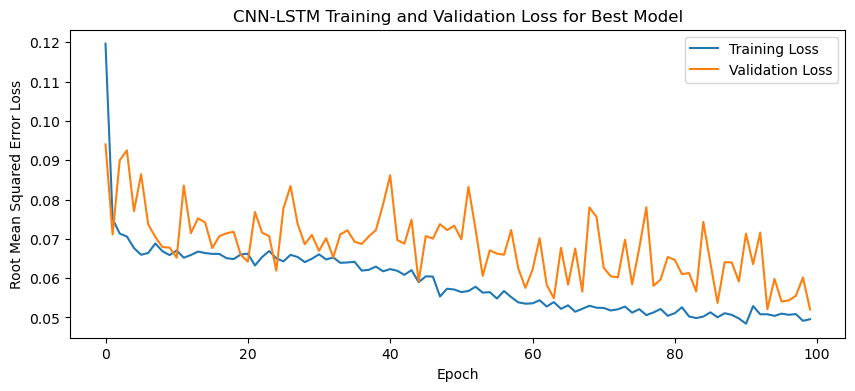

1/1 - 3s - loss: 0.0481 - 3s/epoch - 3s/step
Test Loss: 0.04810133948922157
1/1 [==============================] - 0s 72ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

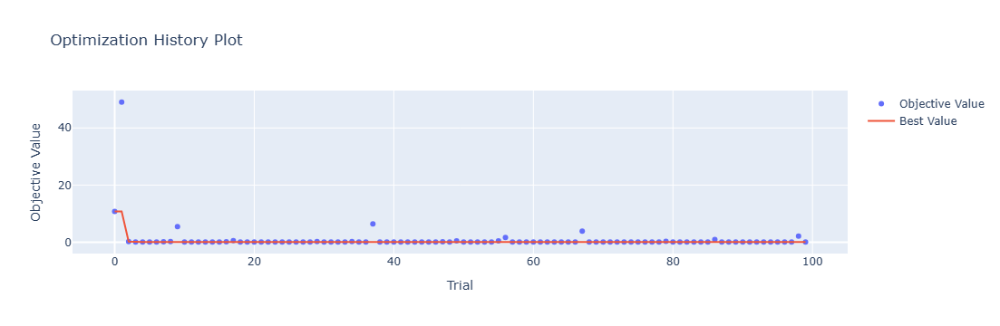

In [4]:
optuna.visualization.plot_optimization_history(study)

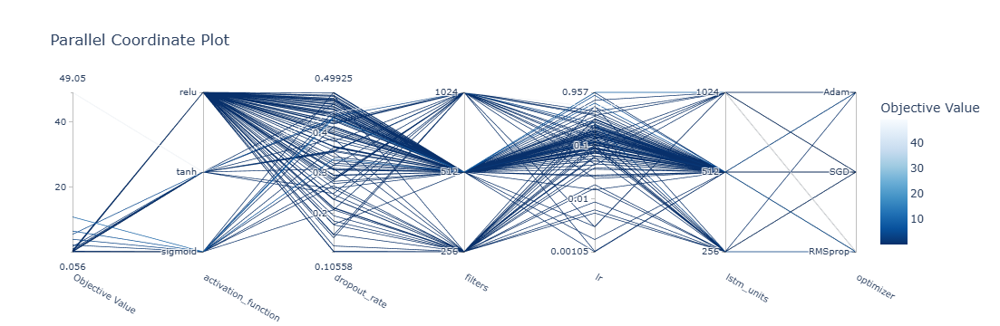

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

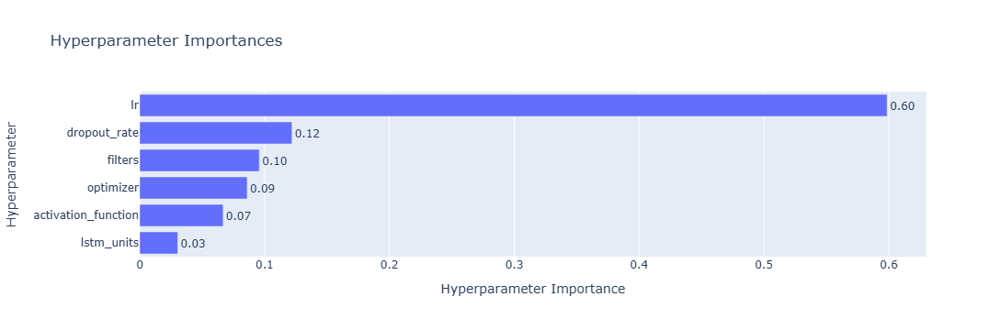

In [6]:
optuna.visualization.plot_param_importances(study)

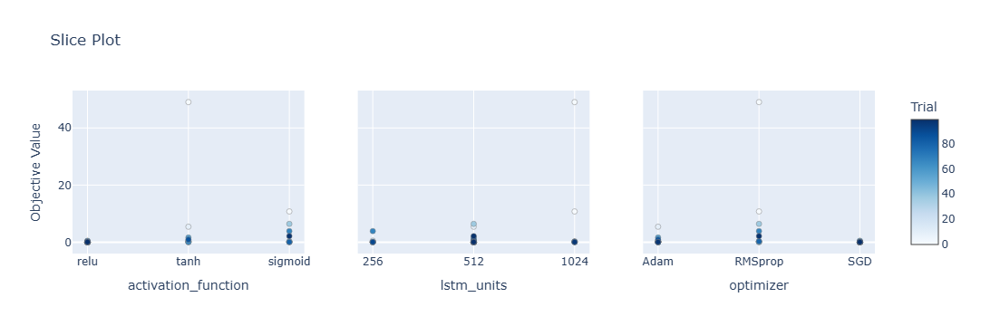

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

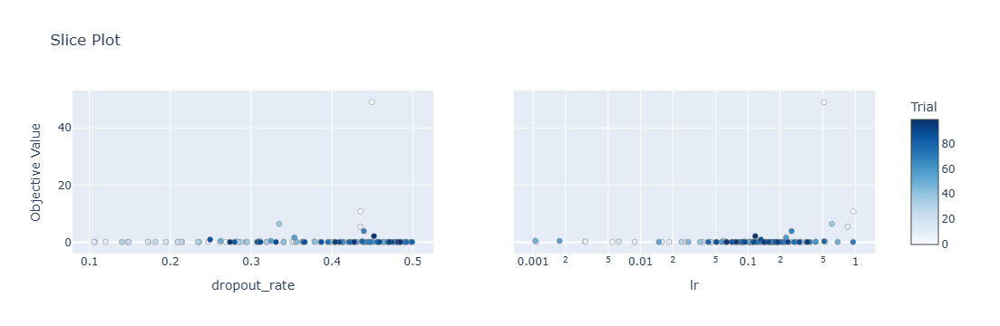

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 38s 273ms/step - loss: 0.1187 - accuracy: 0.6429 - mae: 0.1026 - rmse: 0.1187 - mape: 21.4692 - pearson: 0.7470 - val_loss: 0.0819 - val_accuracy: 0.6000 - val_mae: 0.0668 - val_rmse: 0.0819 - val_mape: 15.1142 - val_pearson: 0.8141
Epoch 2/100
84/84 [==============================] - 15s 184ms/step - loss: 0.0747 - accuracy: 0.7024 - mae: 0.0587 - rmse: 0.0747 - mape: 13.1646 - pearson: 0.7974 - val_loss: 0.0697 - val_accuracy: 0.6000 - val_mae: 0.0543 - val_rmse: 0.0697 - val_mape: 12.7916 - val_pearson: 0.8122
Epoch 3/100
84/84 [==============================] - 15s 183ms/step - loss: 0.0700 - accuracy: 0.6786 - mae: 0.0548 - rmse: 0.0700 - mape: 12.2873 - pearson: 0.8112 - val_loss: 0.0709 - val_accuracy: 0.7000 - val_mae: 0.0550 - val_rmse: 0.0709 - val_mape: 12.6504 - val_pearson: 0.8131
Epoch 4/100
84/84 [==============================] - 16s 186ms/step - loss: 0.0699 - accuracy: 0.7381 - mae: 0.0551 - rmse: 0.0699 - mape: 12.

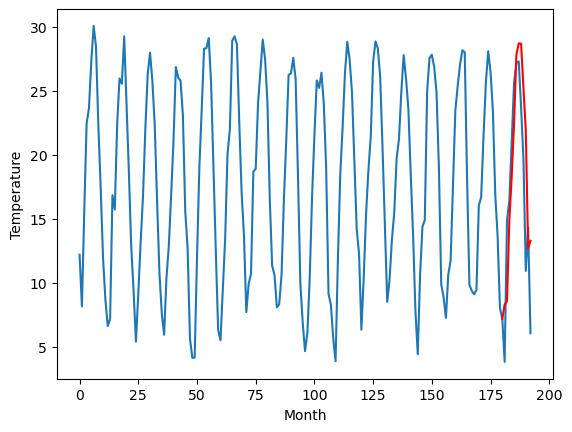

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		8.21		-0.32
8.44		9.96		1.52
13.50		13.49		-0.01
14.90		16.87		1.97
18.92		20.77		1.85
22.40		25.32		2.92
23.62		26.71		3.09
23.96		26.35		2.39
21.83		23.23		1.40
19.20		19.39		0.19
13.69		12.05		-1.64
13.45		11.80		-1.65
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[13.23, 8.21274670481682, 9.960561121702195, 13.492705906629563, 16.86983021616936, 20.77404435992241, 25.323642576932908, 26.7115707051754, 26.35349165916443, 23.234310264587403, 19.389546270370484, 12.050055379867555, 11.798493559360505]


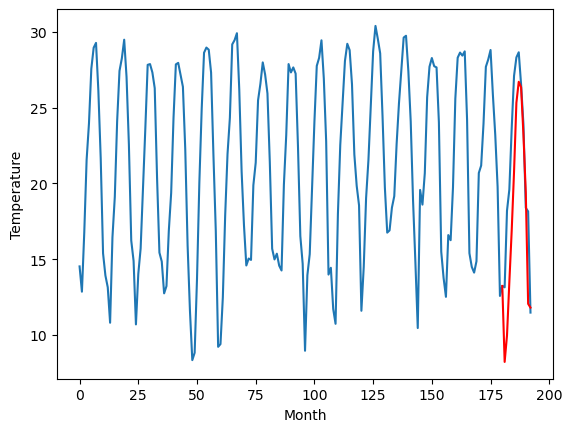

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.31		6.56		-0.75
8.17		7.97		-0.20
14.15		12.22		-1.93
15.79		15.59		-0.20
19.77		19.58		-0.19
23.91		24.28		0.37
25.67		25.60		-0.07
25.95		25.30		-0.65
22.38		22.11		-0.27
18.50		18.36		-0.14
10.14		10.53		0.39
12.32		10.53		-1.79
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.18, 6.557836739122868, 7.966522780954838, 12.21944674640894, 15.594716874659062, 19.583862392008307, 24.276260940134527, 25.597439376413824, 25.29805028229952, 22.11274516373873, 18.358734247982504, 10.53433859139681, 10.534154231844006]


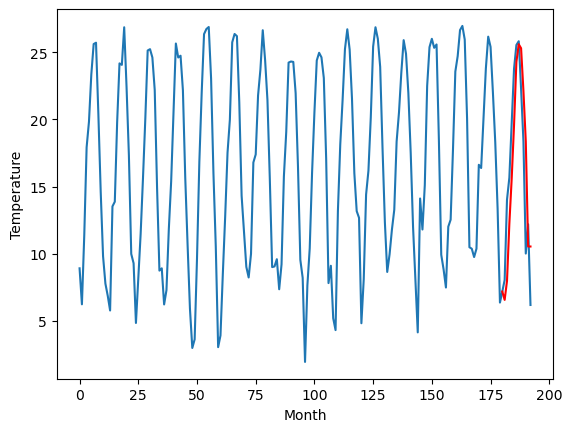

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.38		5.23		-0.15
3.81		6.43		2.62
11.72		11.07		-0.65
13.51		14.44		0.93
17.48		18.46		0.98
20.76		23.23		2.47
21.39		24.48		3.09
21.44		24.19		2.75
18.93		20.98		2.05
16.62		17.29		0.67
8.53		9.20		0.67
11.30		9.31		-1.99
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.46, 5.2265567564964295, 6.431291320323944, 11.07127211332321, 14.438516833782195, 18.458492019176482, 23.231648185253142, 24.47985491991043, 24.19471029281616, 20.98033932685852, 17.294680156707763, 9.204023876190185, 9.310784482359885]


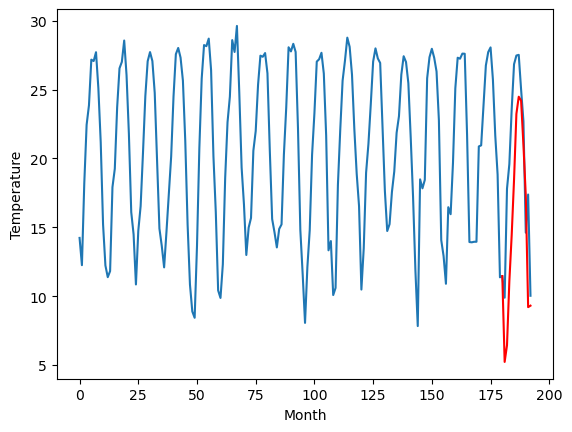

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.33		11.73		0.40
8.24		12.07		3.83
18.14		18.24		0.10
20.07		21.65		1.58
23.93		25.81		1.88
29.13		31.12		1.99
29.56		32.03		2.47
30.32		31.98		1.66
28.31		28.58		0.27
23.96		25.17		1.21
16.39		16.06		-0.33
18.72		16.62		-2.10
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.27, 11.726626626253129, 12.067746690511704, 18.241529992818833, 21.654156020879746, 25.80566244482994, 31.123632720708848, 32.03224604487419, 31.98104487642646, 28.58080016359687, 25.174152958244086, 16.056257831901313, 16.620315420478583]


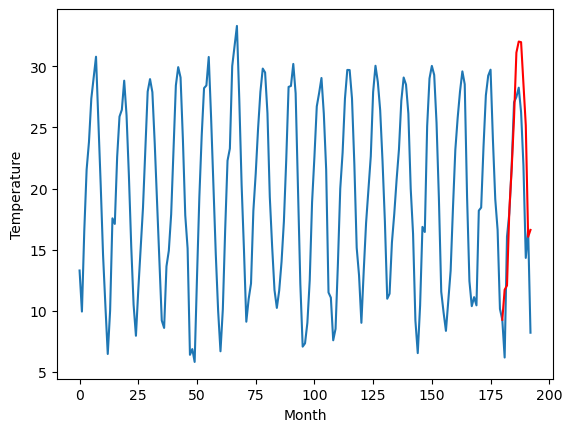

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.74		14.71		1.97
13.39		16.30		2.91
18.29		20.23		1.94
21.66		23.60		1.94
25.17		27.56		2.39
29.74		32.20		2.46
31.73		33.55		1.82
32.21		33.24		1.03
29.20		30.07		0.87
25.60		26.25		0.65
17.43		18.63		1.20
18.48		18.53		0.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.77, 14.711146329045295, 16.300174806714057, 20.227079723477363, 23.602463577389717, 27.556054208874702, 32.20268449604511, 33.554908607602115, 33.23578188240528, 30.070645068287845, 26.252026293873783, 18.634686205983158, 18.532389741837974]


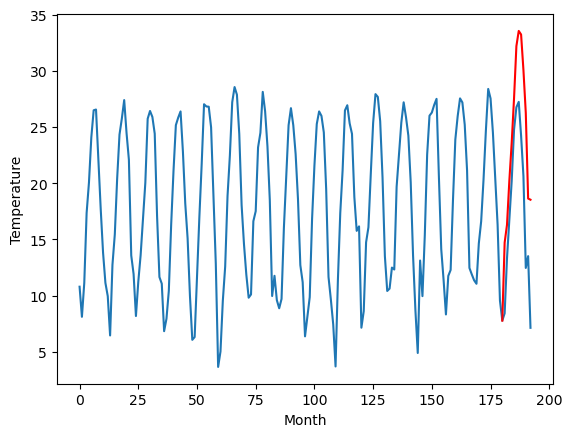

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.33		8.94		0.61
8.97		10.28		1.31
15.95		14.65		-1.30
16.98		18.02		1.04
20.69		22.03		1.34
25.02		26.74		1.72
26.64		28.05		1.41
26.58		27.75		1.17
22.53		24.56		2.03
19.30		20.83		1.53
10.65		12.93		2.28
12.59		12.97		0.38
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 8.936242347434163, 10.283578639701009, 14.648947482779622, 18.024407869055867, 22.027115827277303, 26.737797742560506, 28.04659486360848, 27.75361228533089, 24.561340575888753, 20.829172616675496, 12.931870942786336, 12.96797523073852]


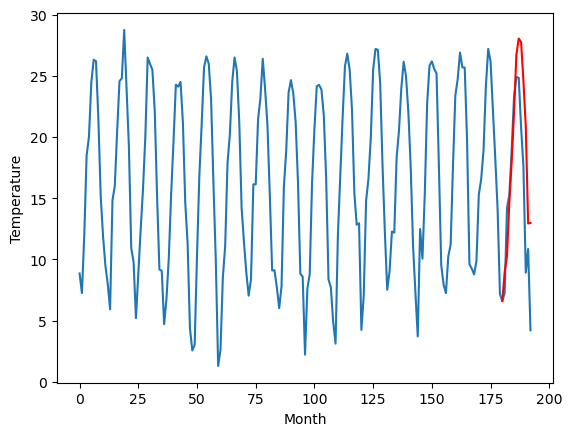

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.29		14.16		0.87
13.91		15.35		1.44
20.43		20.01		-0.42
24.06		23.39		-0.67
27.08		27.42		0.34
31.87		32.20		0.33
33.99		33.45		-0.54
33.94		33.17		-0.77
29.43		29.95		0.52
25.58		26.27		0.69
16.08		18.17		2.09
18.14		18.29		0.15
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.3, 14.164851624071598, 15.354830581247807, 20.0128181758523, 23.39305647045374, 27.42012699276209, 32.20261343151331, 33.44889338642359, 33.16959216028452, 29.94903351694346, 26.27425267130137, 18.173269051611427, 18.294904980361466]


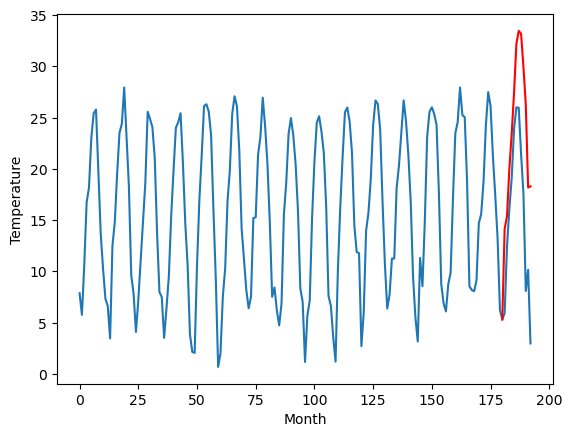

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.51		11.94		-0.57
8.24		9.97		1.73
20.71		19.26		-1.45
23.31		22.72		-0.59
28.00		27.00		-1.00
34.19		33.56		-0.63
34.76		34.08		-0.68
34.70		34.54		-0.16
30.96		30.67		-0.29
27.00		27.02		0.02
16.96		16.66		-0.30
18.76		16.81		-1.95
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.1, 11.935885238647462, 9.97180109024048, 19.260570812225343, 22.719459342956544, 26.995776462554932, 33.56126098632812, 34.082829403877255, 34.53685553669929, 30.667739945650098, 27.019111949205396, 16.664404231309888, 16.81164078712463]


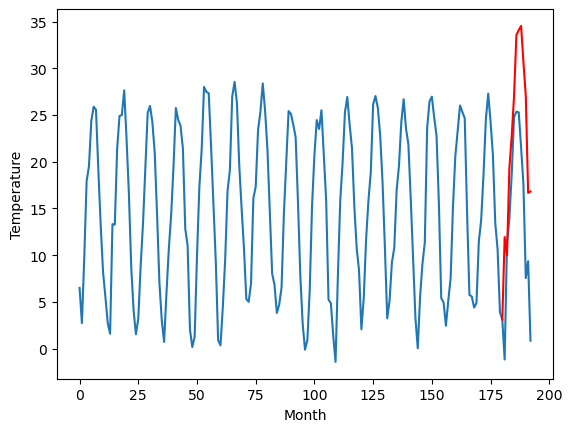

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.20		9.63		0.43
7.03		8.27		1.24
17.78		16.69		-1.09
20.84		20.10		-0.74
25.31		24.30		-1.01
31.79		30.53		-1.26
32.80		31.08		-1.72
33.40		31.40		-2.00
29.54		27.65		-1.89
25.07		24.12		-0.95
14.41		14.07		-0.34
15.64		14.42		-1.22
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.6, 9.632331647872924, 8.274625339508056, 16.693454303741454, 20.100717821121215, 24.29930905342102, 30.529277601242065, 31.081469871997832, 31.395260610580443, 27.646384754180907, 24.123133697509765, 14.074631729125976, 14.422566452026366]


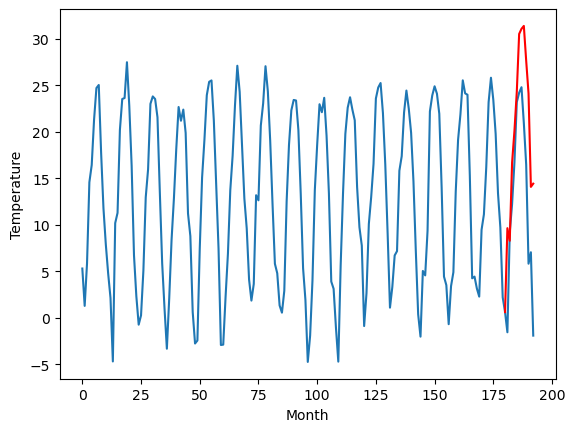

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.24		7.41		0.17
2.93		5.18		2.25
14.66		14.94		0.28
18.63		18.48		-0.15
23.78		22.87		-0.91
31.09		29.71		-1.38
31.68		30.24		-1.44
32.39		30.71		-1.68
28.34		26.83		-1.51
23.99		23.08		-0.91
13.13		12.58		-0.55
12.23		12.58		0.35
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.75, 7.409452295303344, 5.182501888275146, 14.94359884262085, 18.481728172302248, 22.871600723266603, 29.707617378234865, 30.240313386917116, 30.70629314184189, 26.831337010860445, 23.081450498104097, 12.582745587825777, 12.57837981209159]


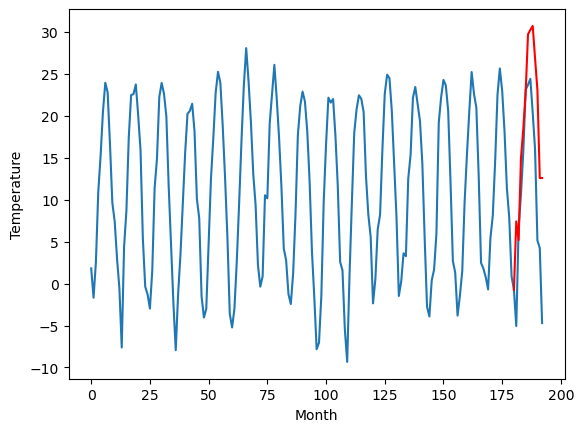

RangeIndex(start=1, stop=12, step=1)
[7.989999999999999, 8.53, 7.310000000000001, 5.3800000000000034, 11.33, 12.739999999999998, 8.33, 13.29, 12.51, 9.2, 7.24]
[8.324957644939422, 8.21274670481682, 6.557836739122868, 5.2265567564964295, 11.726626626253129, 14.711146329045295, 8.936242347434163, 14.164851624071598, 11.935885238647462, 9.632331647872924, 7.409452295303344]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.99   8.324958
1                 1    8.53   8.212747
2                 2    7.31   6.557837
3                 3    5.38   5.226557
4                 4   11.33  11.726627
5                 5   12.74  14.711146
6                 6    8.33   8.936242
7                 7   13.29  14.164852
8                 8   12.51  11.935885
9                 9    9.20   9.632332
10               10    7.24   7.409452


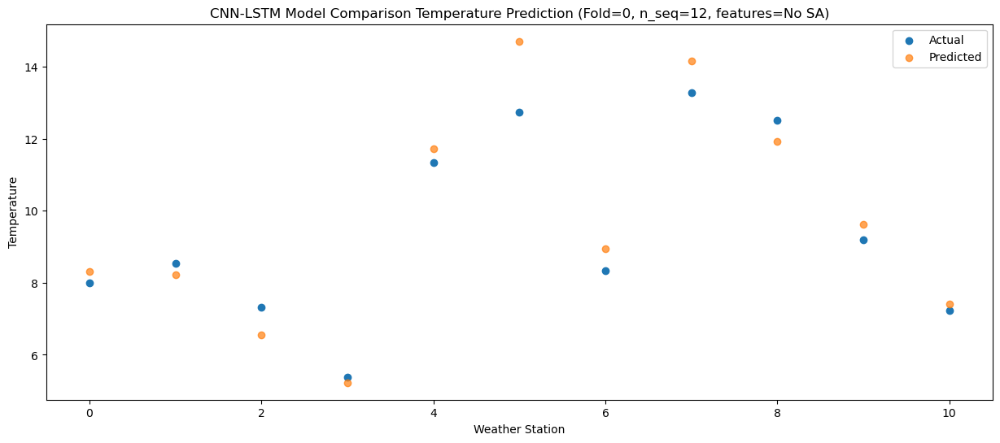

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.64   8.576455
1                 1    8.44   9.960561
2                 2    8.17   7.966523
3                 3    3.81   6.431291
4                 4    8.24  12.067747
5                 5   13.39  16.300175
6                 6    8.97  10.283579
7                 7   13.91  15.354831
8                 8    8.24   9.971801
9                 9    7.03   8.274625
10               10    2.93   5.182502


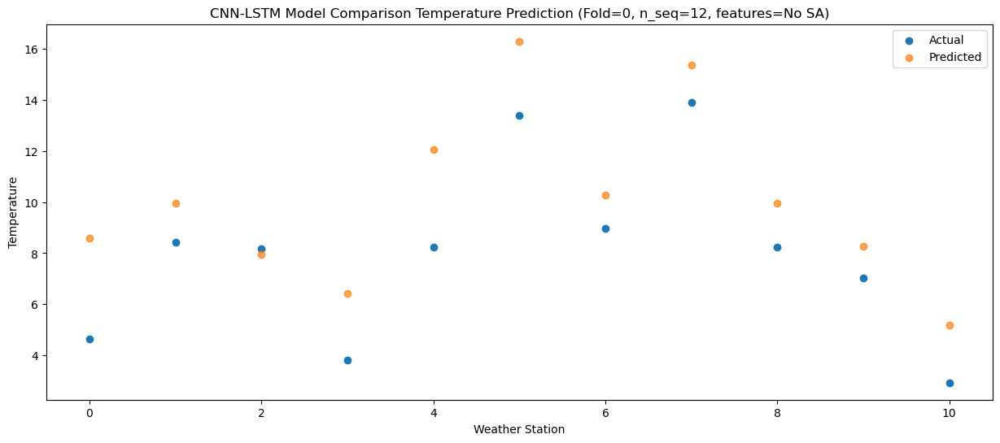

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.71  14.886463
1                 1   13.50  13.492706
2                 2   14.15  12.219447
3                 3   11.72  11.071272
4                 4   18.14  18.241530
5                 5   18.29  20.227080
6                 6   15.95  14.648947
7                 7   20.43  20.012818
8                 8   20.71  19.260571
9                 9   17.78  16.693454
10               10   14.66  14.943599


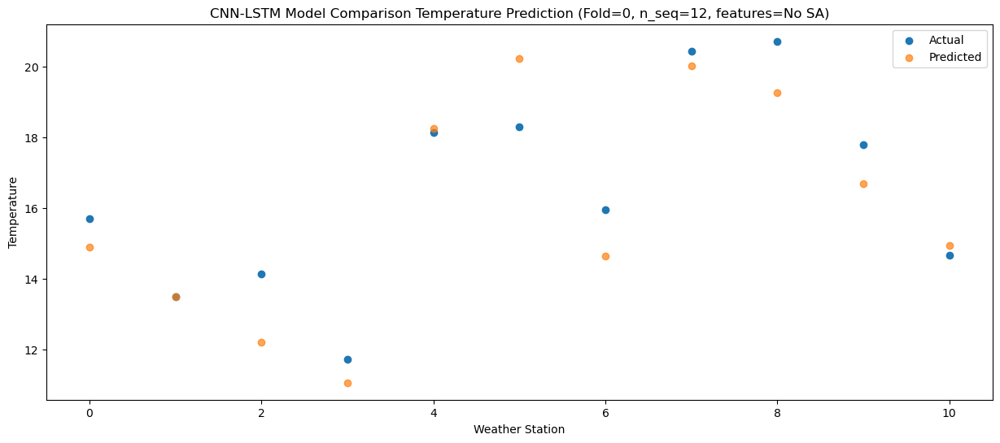

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   17.24  18.313786
1                 1   14.90  16.869830
2                 2   15.79  15.594717
3                 3   13.51  14.438517
4                 4   20.07  21.654156
5                 5   21.66  23.602464
6                 6   16.98  18.024408
7                 7   24.06  23.393056
8                 8   23.31  22.719459
9                 9   20.84  20.100718
10               10   18.63  18.481728


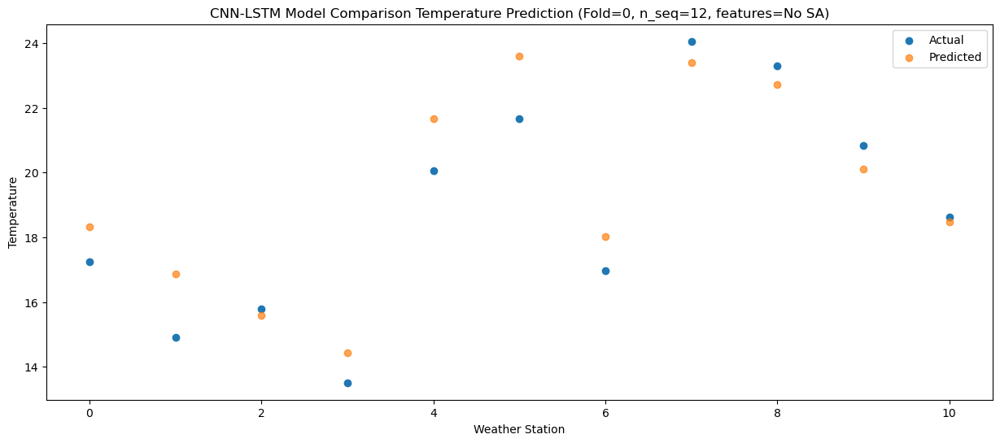

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   21.74  22.476233
1                 1   18.92  20.774044
2                 2   19.77  19.583862
3                 3   17.48  18.458492
4                 4   23.93  25.805662
5                 5   25.17  27.556054
6                 6   20.69  22.027116
7                 7   27.08  27.420127
8                 8   28.00  26.995776
9                 9   25.31  24.299309
10               10   23.78  22.871601


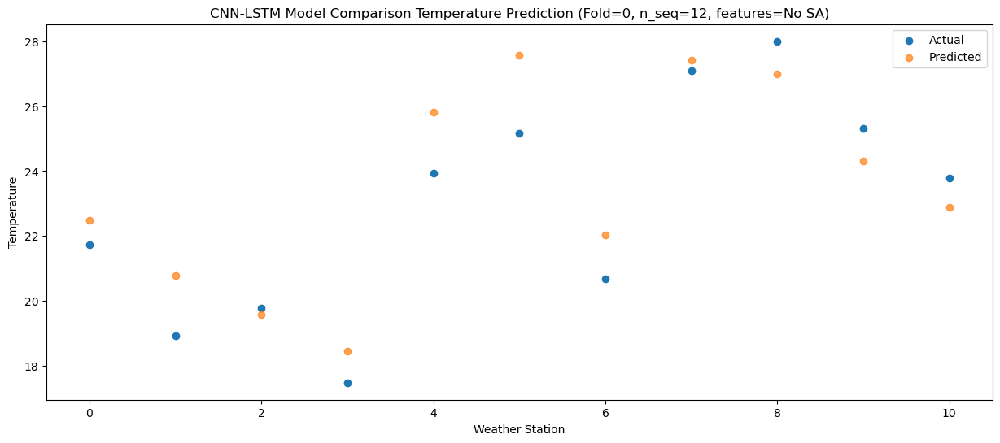

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   26.41  27.839772
1                 1   22.40  25.323643
2                 2   23.91  24.276261
3                 3   20.76  23.231648
4                 4   29.13  31.123633
5                 5   29.74  32.202684
6                 6   25.02  26.737798
7                 7   31.87  32.202613
8                 8   34.19  33.561261
9                 9   31.79  30.529278
10               10   31.09  29.707617


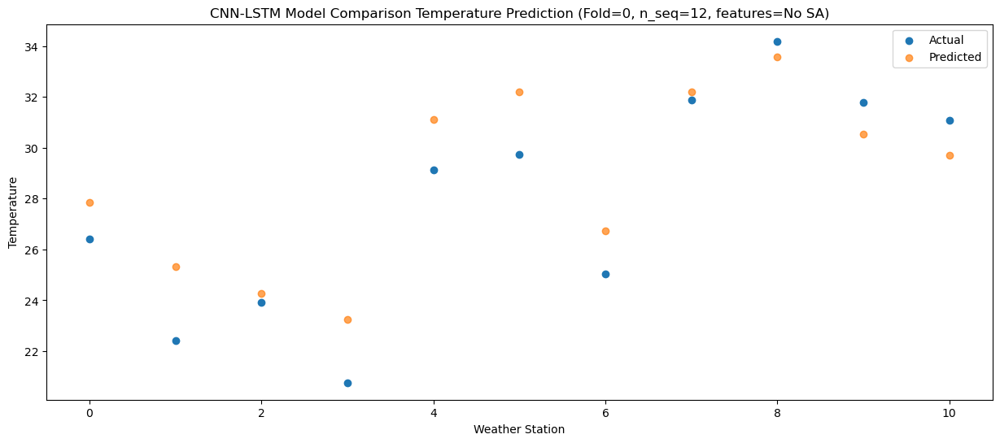

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   28.00  28.716690
1                 1   23.62  26.711571
2                 2   25.67  25.597439
3                 3   21.39  24.479855
4                 4   29.56  32.032246
5                 5   31.73  33.554909
6                 6   26.64  28.046595
7                 7   33.99  33.448893
8                 8   34.76  34.082829
9                 9   32.80  31.081470
10               10   31.68  30.240313


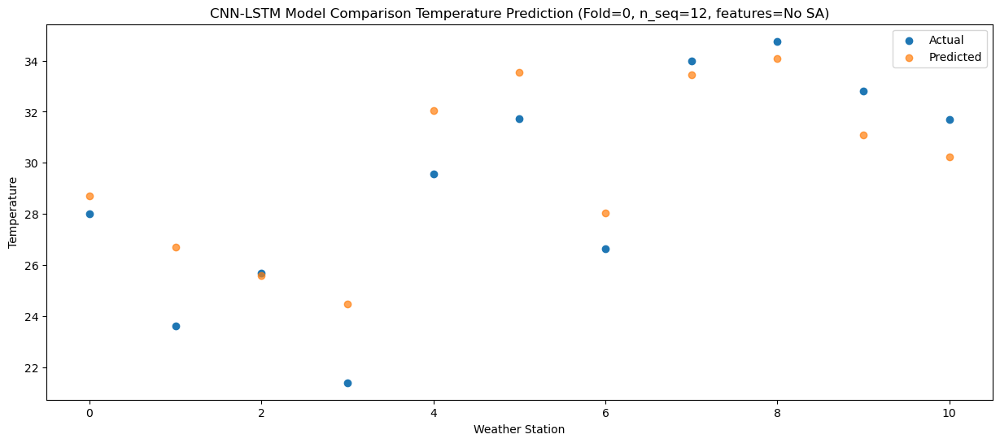

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   28.11  28.687836
1                 1   23.96  26.353492
2                 2   25.95  25.298050
3                 3   21.44  24.194710
4                 4   30.32  31.981045
5                 5   32.21  33.235782
6                 6   26.58  27.753612
7                 7   33.94  33.169592
8                 8   34.70  34.536856
9                 9   33.40  31.395261
10               10   32.39  30.706293


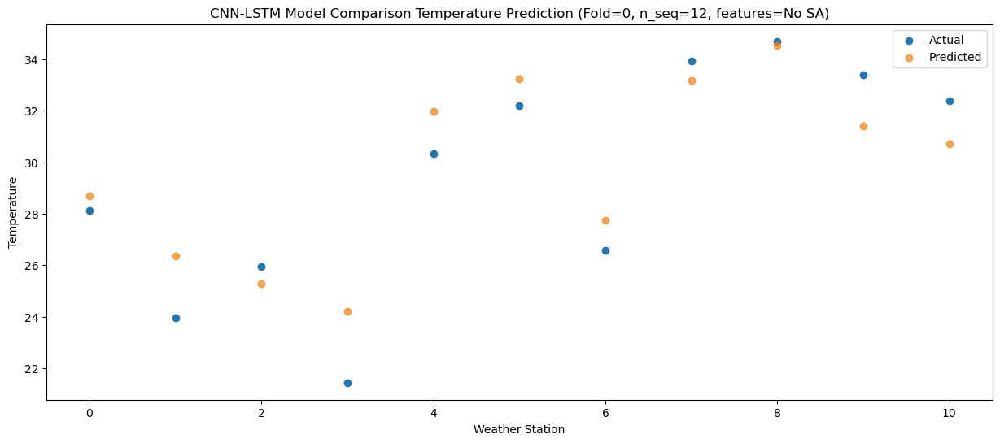

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   24.53  25.265185
1                 1   21.83  23.234310
2                 2   22.38  22.112745
3                 3   18.93  20.980339
4                 4   28.31  28.580800
5                 5   29.20  30.070645
6                 6   22.53  24.561341
7                 7   29.43  29.949034
8                 8   30.96  30.667740
9                 9   29.54  27.646385
10               10   28.34  26.831337


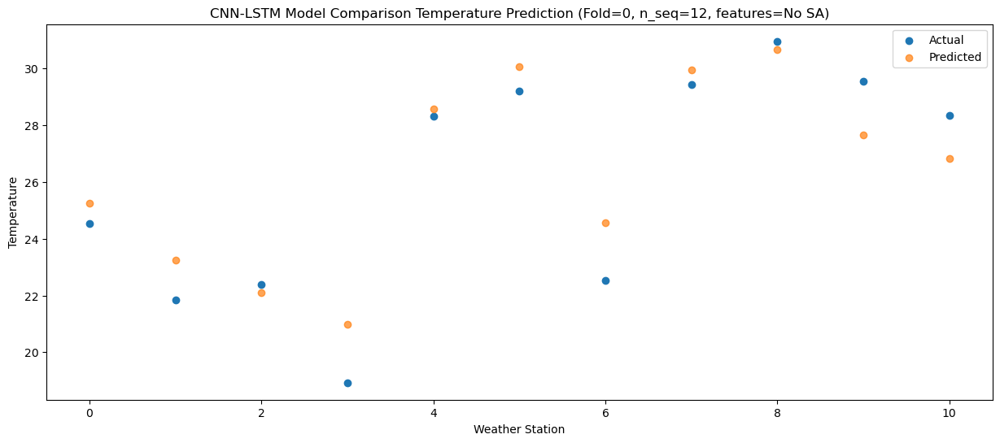

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   20.51  21.894063
1                 1   19.20  19.389546
2                 2   18.50  18.358734
3                 3   16.62  17.294680
4                 4   23.96  25.174153
5                 5   25.60  26.252026
6                 6   19.30  20.829173
7                 7   25.58  26.274253
8                 8   27.00  27.019112
9                 9   25.07  24.123134
10               10   23.99  23.081450


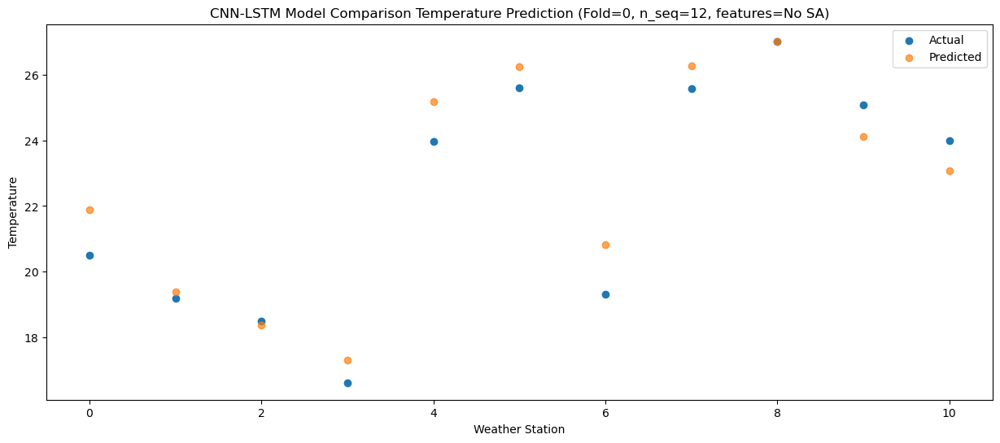

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   11.75  12.691561
1                 1   13.69  12.050055
2                 2   10.14  10.534339
3                 3    8.53   9.204024
4                 4   16.39  16.056258
5                 5   17.43  18.634686
6                 6   10.65  12.931871
7                 7   16.08  18.173269
8                 8   16.96  16.664404
9                 9   14.41  14.074632
10               10   13.13  12.582746


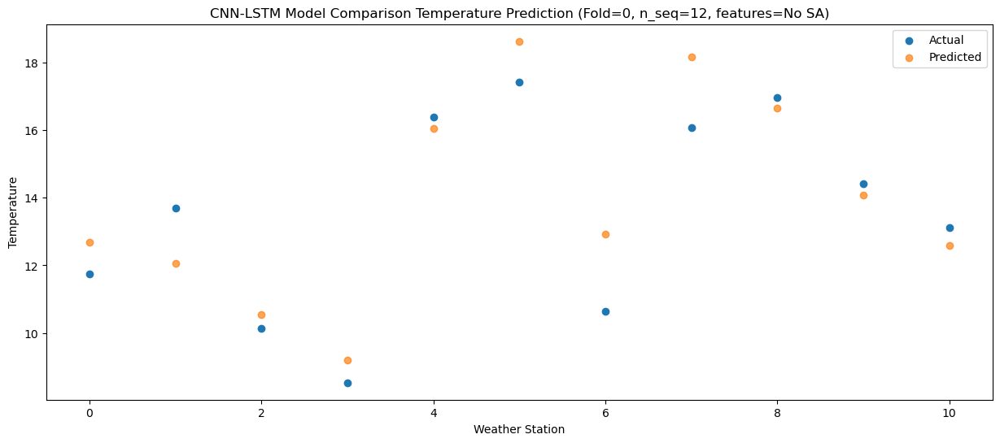

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   15.13  13.300474
1                 1   13.45  11.798494
2                 2   12.32  10.534154
3                 3   11.30   9.310784
4                 4   18.72  16.620315
5                 5   18.48  18.532390
6                 6   12.59  12.967975
7                 7   18.14  18.294905
8                 8   18.76  16.811641
9                 9   15.64  14.422566
10               10   12.23  12.578380


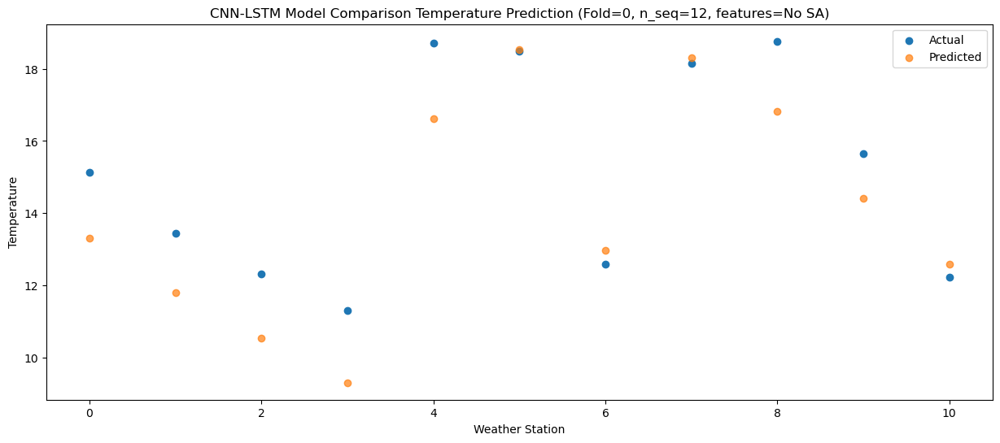

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 1, 512)            1008640   
                                                                 
 max_pooling1d (MaxPooling1D  (None, 1, 512)           0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 1, 512)            0         
                                                                 
 lstm (LSTM)                 (None, 1, 512)            2099200   
                                                                 
 dropout_1 (Dropout)         (None, 1, 512)            0         
                                                                 
 lstm_1 (LSTM)               (None, 512)               2099200   
                                                        

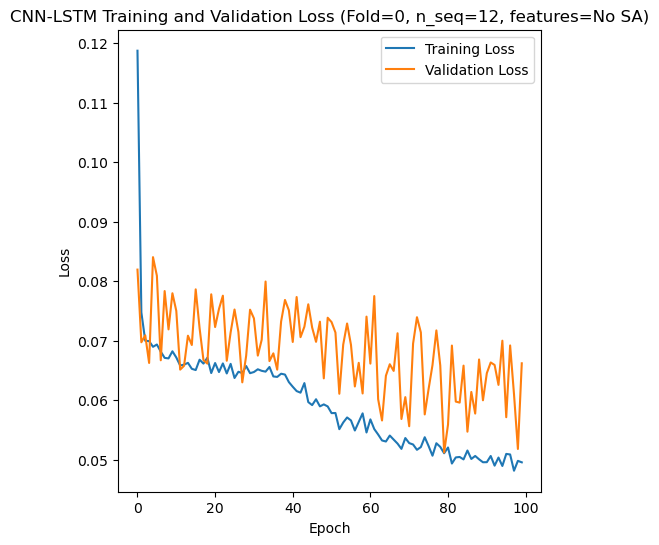

Epoch 1/100
84/84 [==============================] - 28s 183ms/step - loss: 0.1165 - accuracy: 0.5714 - mae: 0.0984 - rmse: 0.1165 - mape: 20.4620 - pearson: 0.7302 - val_loss: 0.0785 - val_accuracy: 0.8000 - val_mae: 0.0617 - val_rmse: 0.0785 - val_mape: 13.5403 - val_pearson: 0.7917
Epoch 2/100
84/84 [==============================] - 12s 139ms/step - loss: 0.0773 - accuracy: 0.6429 - mae: 0.0603 - rmse: 0.0773 - mape: 13.4723 - pearson: 0.7882 - val_loss: 0.0701 - val_accuracy: 0.1000 - val_mae: 0.0509 - val_rmse: 0.0701 - val_mape: 11.7419 - val_pearson: 0.8253
Epoch 3/100
84/84 [==============================] - 11s 135ms/step - loss: 0.0746 - accuracy: 0.6786 - mae: 0.0587 - rmse: 0.0746 - mape: 13.2142 - pearson: 0.7955 - val_loss: 0.0724 - val_accuracy: 0.8000 - val_mae: 0.0567 - val_rmse: 0.0724 - val_mape: 12.7223 - val_pearson: 0.8074
Epoch 4/100
84/84 [==============================] - 12s 140ms/step - loss: 0.0715 - accuracy: 0.7262 - mae: 0.0562 - rmse: 0.0715 - mape: 12.

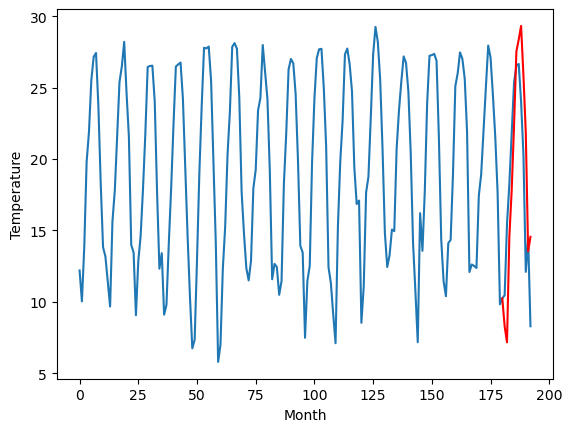

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.49		6.58		-0.91
8.15		4.96		-3.19
14.92		12.84		-2.08
17.06		16.05		-1.01
20.79		20.55		-0.24
24.93		25.85		0.92
26.31		26.50		0.19
26.58		27.32		0.74
22.84		23.73		0.89
19.06		19.80		0.74
11.40		11.24		-0.16
13.03		12.43		-0.60
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.41, 6.578717532157898, 4.9565033340454105, 12.839389743804933, 16.048424425125123, 20.55053776741028, 25.852337064743043, 26.501727285385133, 27.319987180233003, 23.73294914007187, 19.799456956386567, 11.23998391866684, 12.42848992586136]


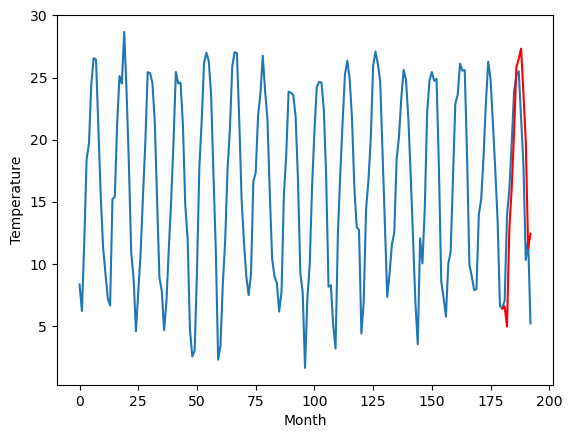

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.35		7.81		-1.54
9.84		6.17		-3.67
16.90		14.06		-2.84
18.30		17.27		-1.03
22.42		21.76		-0.66
26.30		27.07		0.77
27.07		27.71		0.64
27.73		28.52		0.79
24.71		24.94		0.23
20.93		21.00		0.07
13.19		12.43		-0.76
15.79		13.63		-2.16
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.6, 7.8070020008087155, 6.170002989768982, 14.06159167766571, 17.267775349617004, 21.764348797798156, 27.06966429233551, 27.710150949954986, 28.52274584054947, 24.93583678483963, 21.000726215839386, 12.433832638263702, 13.626561396121978]


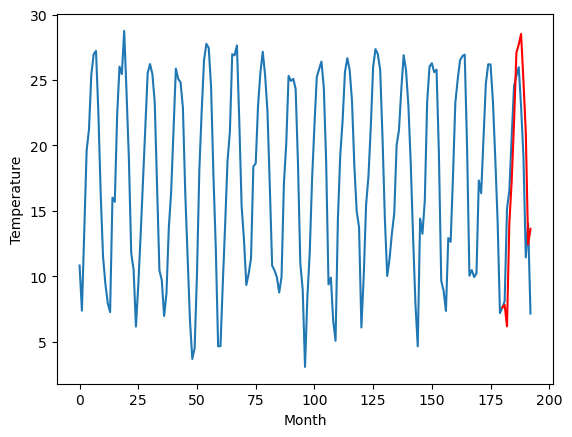

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.86		6.69		-1.17
6.27		4.90		-1.37
13.64		12.98		-0.66
15.98		16.14		0.16
19.87		20.63		0.76
23.76		26.01		2.25
23.64		26.58		2.94
24.61		27.35		2.74
21.60		23.77		2.17
18.91		19.75		0.84
11.75		11.12		-0.63
15.12		12.24		-2.88
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.89, 6.694654068946838, 4.89562650680542, 12.976891956329347, 16.138571462631226, 20.63112183570862, 26.0133344745636, 26.582690737247468, 27.35259171485901, 23.768244228363038, 19.75490375518799, 11.11758514404297, 12.236772737503053]


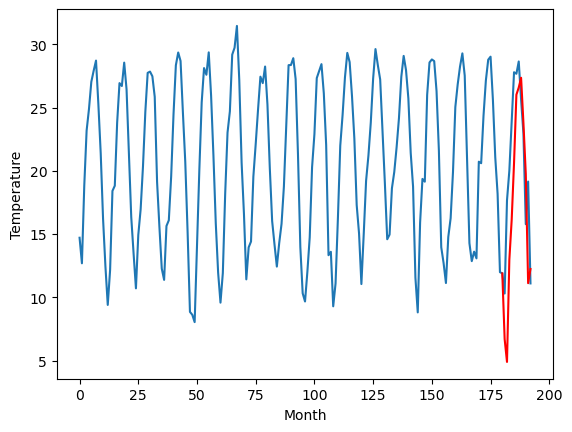

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.19		10.85		-1.34
10.49		8.94		-1.55
18.10		17.17		-0.93
20.40		20.30		-0.10
24.52		24.80		0.28
27.99		30.25		2.26
28.08		30.78		2.70
29.05		31.55		2.50
25.47		27.97		2.50
22.43		23.93		1.50
14.88		15.24		0.36
18.76		16.32		-2.44
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.96, 10.846010160446166, 8.944059681892394, 17.16581470966339, 20.29826910495758, 24.80426676273346, 30.24804480075836, 30.784923684597015, 31.54613835811615, 27.973456454277038, 23.928379607200622, 15.239000868797302, 16.32359583377838]


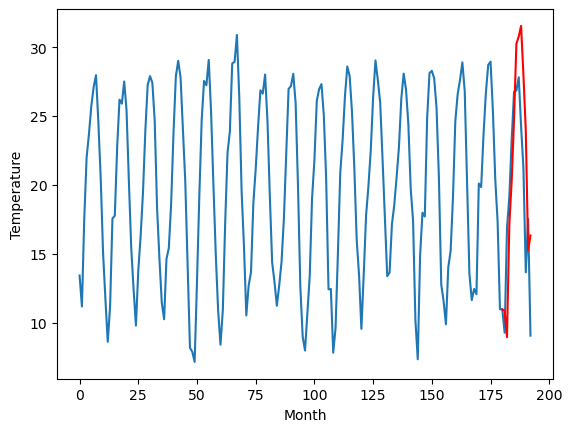

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.84		7.37		0.53
7.22		6.05		-1.17
14.56		13.47		-1.09
16.83		16.70		-0.13
22.42		21.15		-1.27
26.69		26.32		-0.37
26.03		27.04		1.01
25.44		27.87		2.43
25.08		24.31		-0.77
20.76		20.21		-0.55
14.29		11.86		-2.43
14.55		12.84		-1.71
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 7.371982848644256, 6.053137457370758, 13.470600283145904, 16.7044357419014, 21.14518109560013, 26.316601192951204, 27.035268700122835, 27.869394516944887, 24.31186125278473, 20.213861203193666, 11.864522671699525, 12.843517756462099]


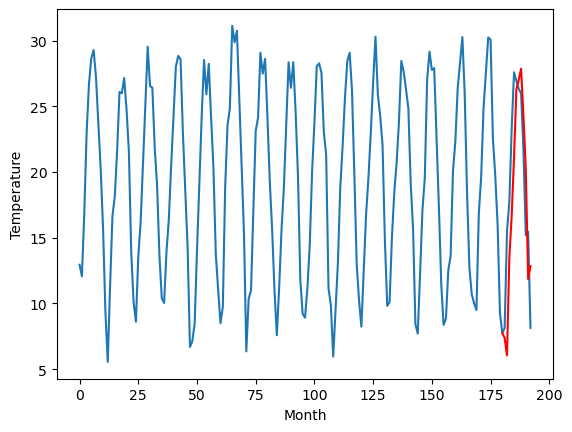

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.62		9.74		-0.88
11.40		8.17		-3.23
17.68		16.02		-1.66
20.25		19.23		-1.02
24.02		23.75		-0.27
28.03		29.03		1.00
29.39		29.70		0.31
29.65		30.54		0.89
26.32		26.96		0.64
22.37		23.02		0.65
14.77		14.49		-0.28
16.29		15.66		-0.63
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.17, 9.744994945526123, 8.167252368927002, 16.020563430786133, 19.23437268257141, 23.74635226249695, 29.03019148826599, 29.70360559940338, 30.543406195640564, 26.955612845420838, 23.024227089881897, 14.48526472568512, 15.660100407600403]


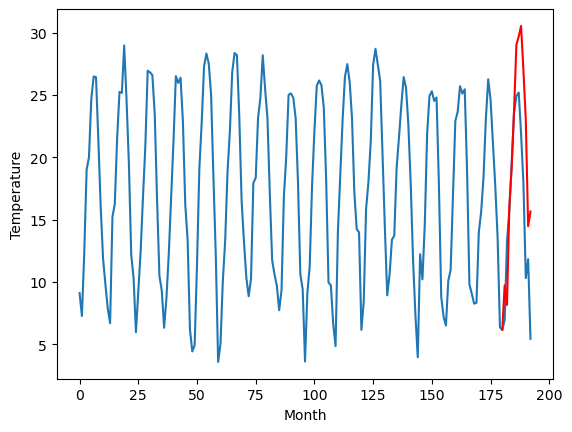

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.40		12.89		-1.51
11.40		9.65		-1.75
22.72		19.95		-2.77
24.43		23.08		-1.35
29.09		27.66		-1.43
35.17		33.93		-1.24
36.16		34.11		-2.05
37.38		34.90		-2.48
33.67		31.39		-2.28
28.47		26.97		-1.50
19.17		17.75		-1.42
21.58		18.12		-3.46
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.57, 12.89034851551056, 9.648728451728822, 19.952097020149232, 23.084813675880433, 27.661951146125794, 33.931996903419495, 34.10853905141354, 34.89703769147396, 31.38628525197506, 26.97326607167721, 17.747798389792443, 18.11993256866932]


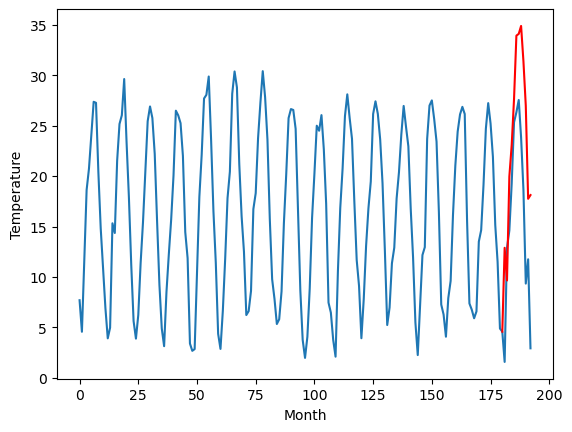

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.07		11.59		-1.48
8.29		8.33		0.04
20.85		18.66		-2.19
22.65		21.79		-0.86
27.46		26.36		-1.10
33.49		32.63		-0.86
35.00		32.80		-2.20
35.39		33.57		-1.82
32.88		30.06		-2.82
26.63		25.63		-1.00
18.88		16.40		-2.48
18.07		16.73		-1.34
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.46, 11.587648673057556, 8.332258267402649, 18.663550419807436, 21.788925213813783, 26.35950378894806, 32.629715962409975, 32.79599067389965, 33.570989159941675, 30.059852151274683, 25.626637486815454, 16.395285634398462, 16.728481052517893]


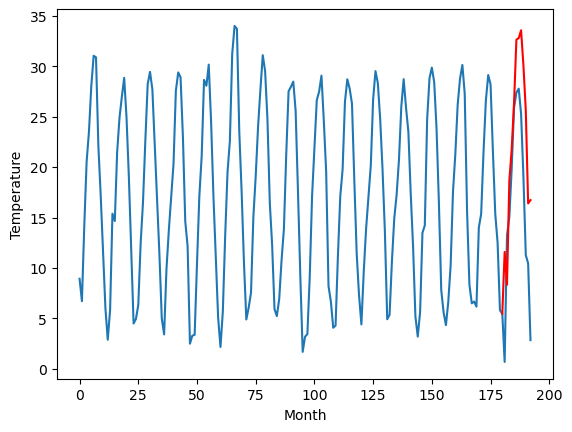

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.06		11.31		-1.75
8.69		8.82		0.13
19.40		18.03		-1.37
23.16		21.13		-2.03
27.71		25.66		-2.05
34.82		31.44		-3.38
35.49		31.89		-3.60
35.34		32.72		-2.62
33.39		29.14		-4.25
25.95		24.92		-1.03
19.70		16.01		-3.69
18.09		16.74		-1.35
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.42, 11.306979846954345, 8.818376493453979, 18.030584287643432, 21.13051838874817, 25.660782289505004, 31.444338750839233, 31.886405777931213, 32.7211792588234, 29.136608612537387, 24.923113834857944, 16.007126820087436, 16.74225313663483]


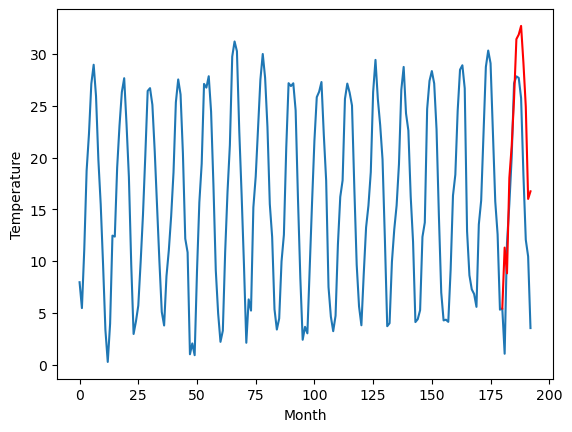

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.28		7.92		0.64
6.32		6.19		-0.13
13.54		14.17		0.63
18.19		17.35		-0.84
22.73		21.84		-0.89
28.82		27.18		-1.64
31.05		27.78		-3.27
30.83		28.56		-2.27
27.13		24.96		-2.17
22.71		20.97		-1.74
13.39		12.37		-1.02
12.62		13.50		0.88
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.17, 7.915116901397704, 6.186805839538573, 14.174178714752196, 17.351908082962034, 21.837851877212522, 27.18188893318176, 27.77777963399887, 28.56253486394882, 24.964102084636686, 20.96742611646652, 12.368800933361051, 13.499794061183927]


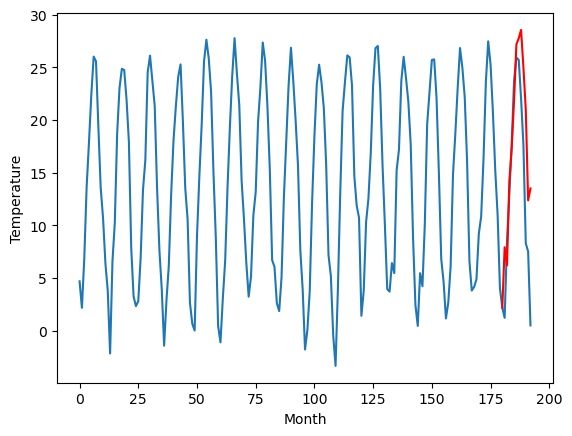

RangeIndex(start=1, stop=12, step=1)
[9.54, 7.489999999999999, 9.35, 7.859999999999999, 12.189999999999998, 6.84, 10.62, 14.4, 13.07, 13.06, 7.279999999999999]
[8.288235599994659, 6.578717532157898, 7.8070020008087155, 6.694654068946838, 10.846010160446166, 7.371982848644256, 9.744994945526123, 12.89034851551056, 11.587648673057556, 11.306979846954345, 7.915116901397704]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    9.54   8.288236
1                 1    7.49   6.578718
2                 2    9.35   7.807002
3                 3    7.86   6.694654
4                 4   12.19  10.846010
5                 5    6.84   7.371983
6                 6   10.62   9.744995
7                 7   14.40  12.890349
8                 8   13.07  11.587649
9                 9   13.06  11.306980
10               10    7.28   7.915117


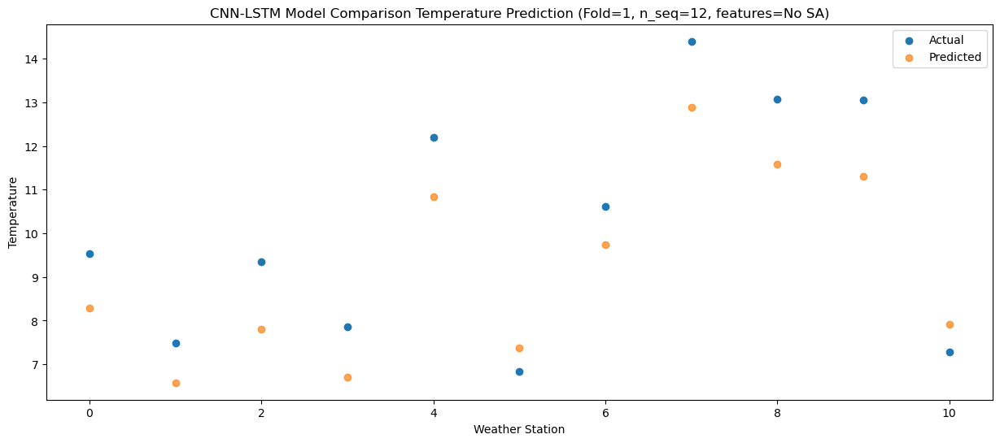

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    9.76   7.160547
1                 1    8.15   4.956503
2                 2    9.84   6.170003
3                 3    6.27   4.895627
4                 4   10.49   8.944060
5                 5    7.22   6.053137
6                 6   11.40   8.167252
7                 7   11.40   9.648728
8                 8    8.29   8.332258
9                 9    8.69   8.818376
10               10    6.32   6.186806


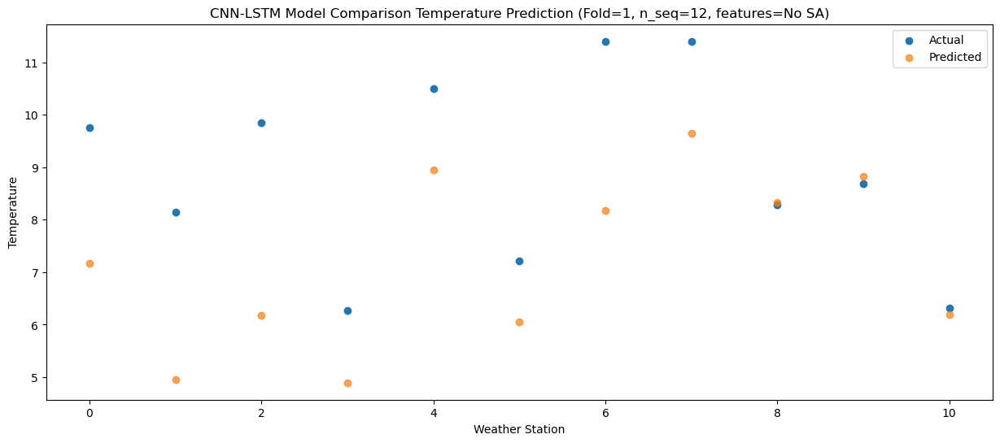

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   14.74  14.547198
1                 1   14.92  12.839390
2                 2   16.90  14.061592
3                 3   13.64  12.976892
4                 4   18.10  17.165815
5                 5   14.56  13.470600
6                 6   17.68  16.020563
7                 7   22.72  19.952097
8                 8   20.85  18.663550
9                 9   19.40  18.030584
10               10   13.54  14.174179


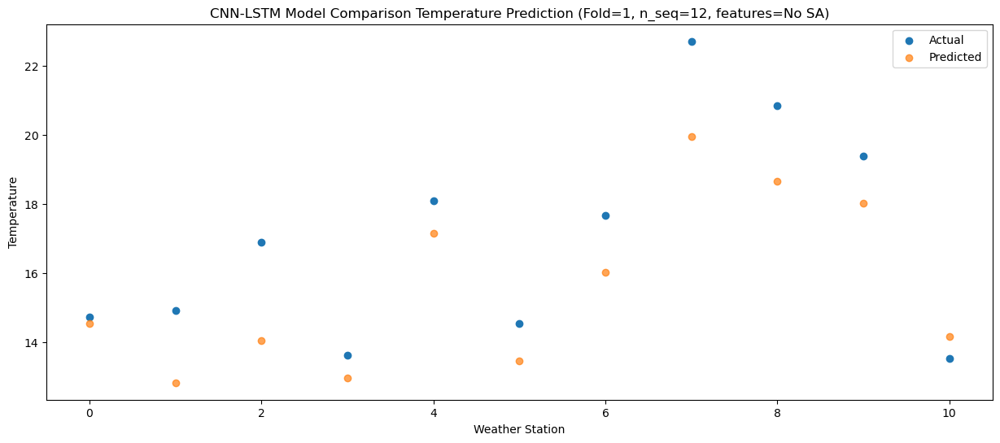

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   17.55  17.828310
1                 1   17.06  16.048424
2                 2   18.30  17.267775
3                 3   15.98  16.138571
4                 4   20.40  20.298269
5                 5   16.83  16.704436
6                 6   20.25  19.234373
7                 7   24.43  23.084814
8                 8   22.65  21.788925
9                 9   23.16  21.130518
10               10   18.19  17.351908


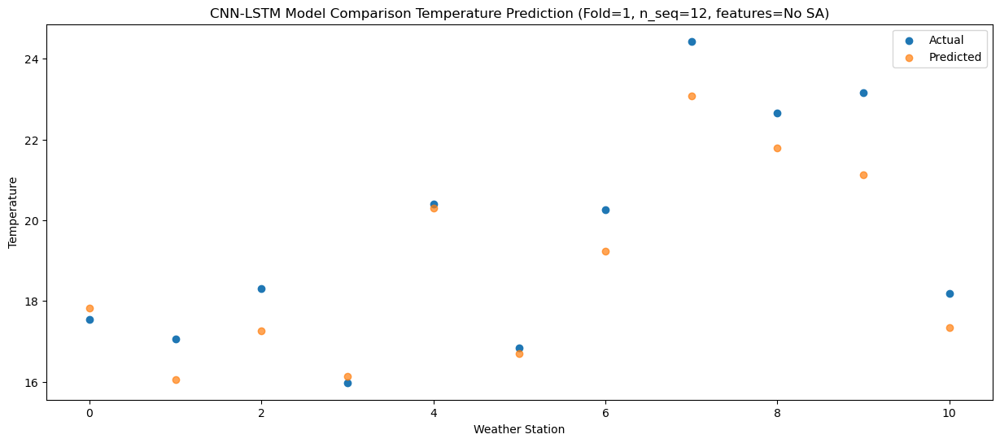

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   21.16  22.369379
1                 1   20.79  20.550538
2                 2   22.42  21.764349
3                 3   19.87  20.631122
4                 4   24.52  24.804267
5                 5   22.42  21.145181
6                 6   24.02  23.746352
7                 7   29.09  27.661951
8                 8   27.46  26.359504
9                 9   27.71  25.660782
10               10   22.73  21.837852


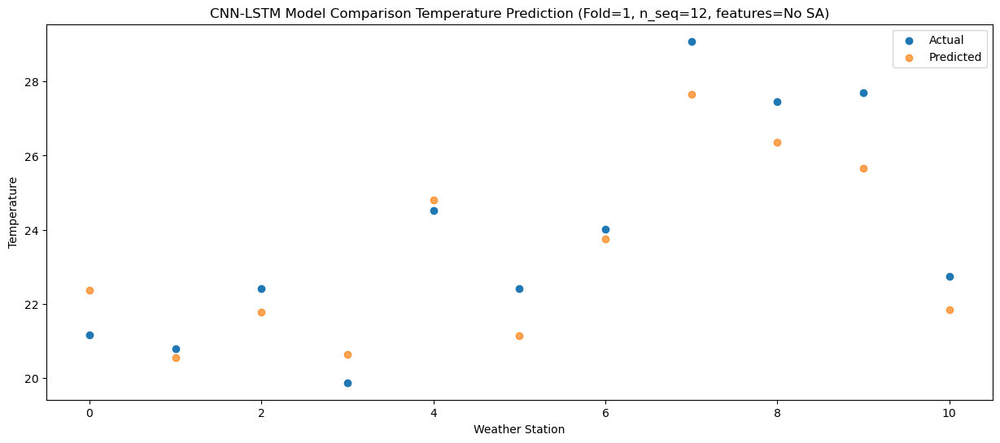

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   24.65  27.540168
1                 1   24.93  25.852337
2                 2   26.30  27.069664
3                 3   23.76  26.013334
4                 4   27.99  30.248045
5                 5   26.69  26.316601
6                 6   28.03  29.030191
7                 7   35.17  33.931997
8                 8   33.49  32.629716
9                 9   34.82  31.444339
10               10   28.82  27.181889


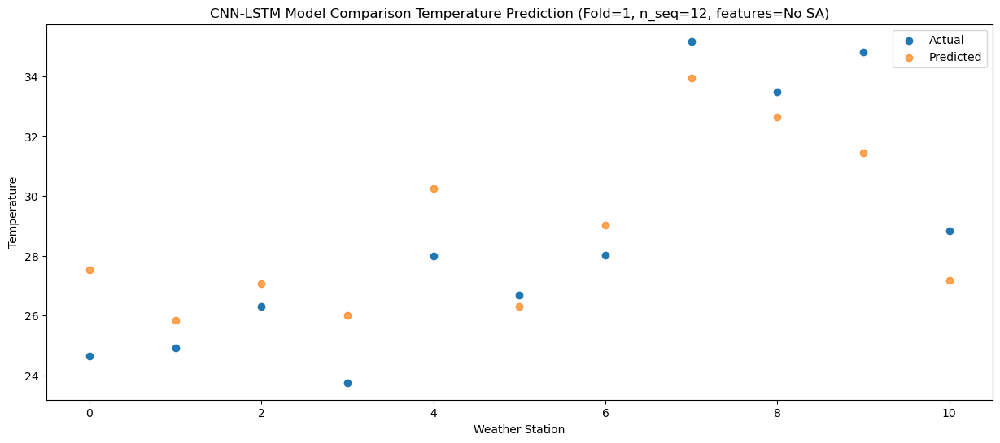

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   25.85  28.378728
1                 1   26.31  26.501727
2                 2   27.07  27.710151
3                 3   23.64  26.582691
4                 4   28.08  30.784924
5                 5   26.03  27.035269
6                 6   29.39  29.703606
7                 7   36.16  34.108539
8                 8   35.00  32.795991
9                 9   35.49  31.886406
10               10   31.05  27.777780


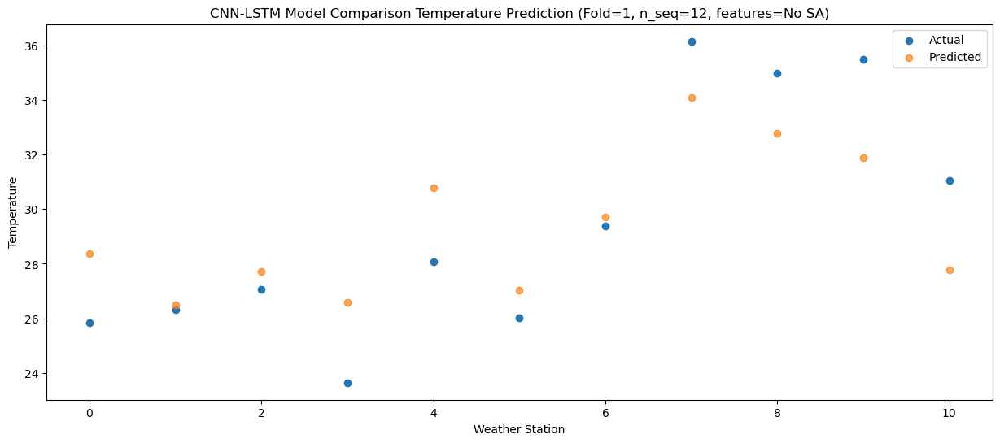

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   25.96  29.325398
1                 1   26.58  27.319987
2                 2   27.73  28.522746
3                 3   24.61  27.352592
4                 4   29.05  31.546138
5                 5   25.44  27.869395
6                 6   29.65  30.543406
7                 7   37.38  34.897038
8                 8   35.39  33.570989
9                 9   35.34  32.721179
10               10   30.83  28.562535


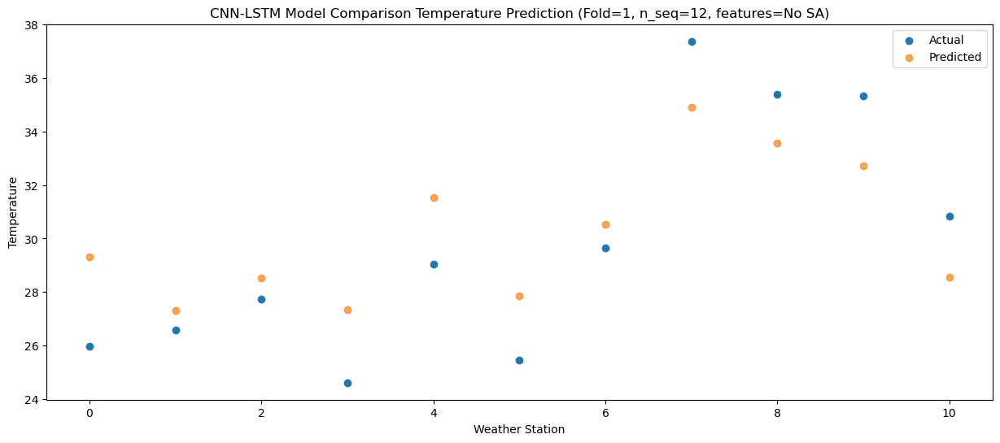

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   23.31  25.859108
1                 1   22.84  23.732949
2                 2   24.71  24.935837
3                 3   21.60  23.768244
4                 4   25.47  27.973456
5                 5   25.08  24.311861
6                 6   26.32  26.955613
7                 7   33.67  31.386285
8                 8   32.88  30.059852
9                 9   33.39  29.136609
10               10   27.13  24.964102


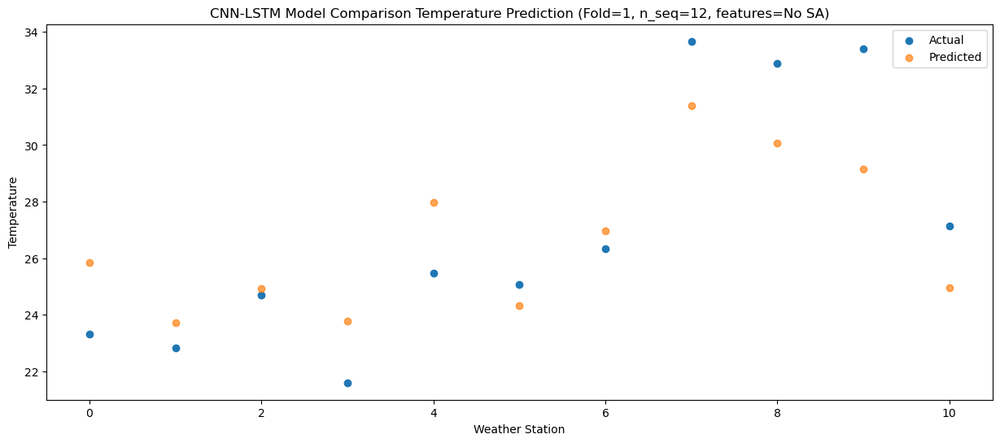

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   19.61  21.850698
1                 1   19.06  19.799457
2                 2   20.93  21.000726
3                 3   18.91  19.754904
4                 4   22.43  23.928380
5                 5   20.76  20.213861
6                 6   22.37  23.024227
7                 7   28.47  26.973266
8                 8   26.63  25.626637
9                 9   25.95  24.923114
10               10   22.71  20.967426


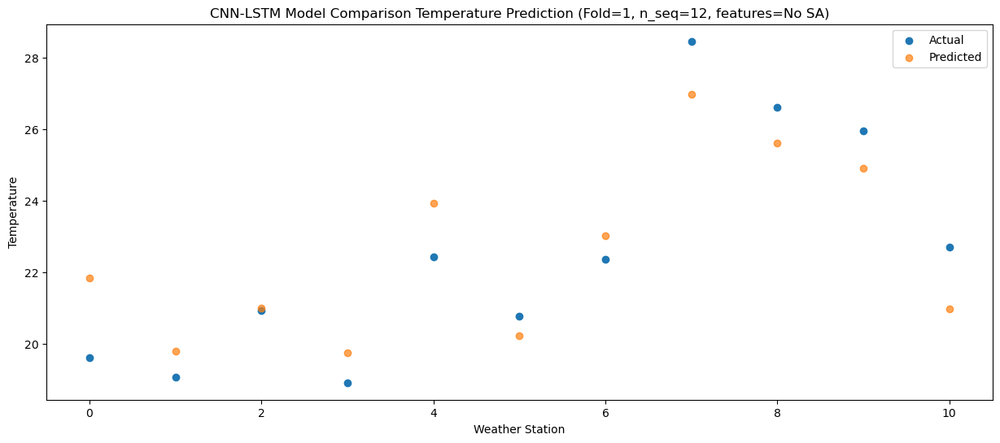

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   11.40  13.532994
1                 1   11.40  11.239984
2                 2   13.19  12.433833
3                 3   11.75  11.117585
4                 4   14.88  15.239001
5                 5   14.29  11.864523
6                 6   14.77  14.485265
7                 7   19.17  17.747798
8                 8   18.88  16.395286
9                 9   19.70  16.007127
10               10   13.39  12.368801


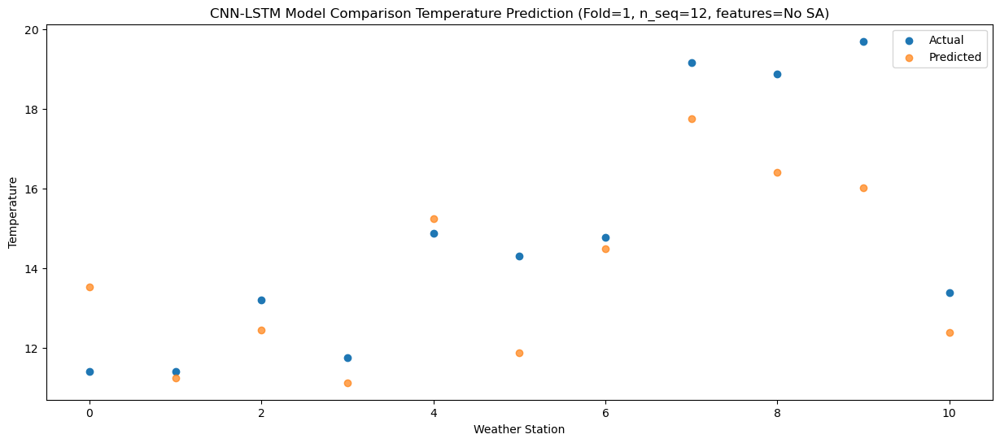

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   13.75  14.555656
1                 1   13.03  12.428490
2                 2   15.79  13.626561
3                 3   15.12  12.236773
4                 4   18.76  16.323596
5                 5   14.55  12.843518
6                 6   16.29  15.660100
7                 7   21.58  18.119933
8                 8   18.07  16.728481
9                 9   18.09  16.742253
10               10   12.62  13.499794


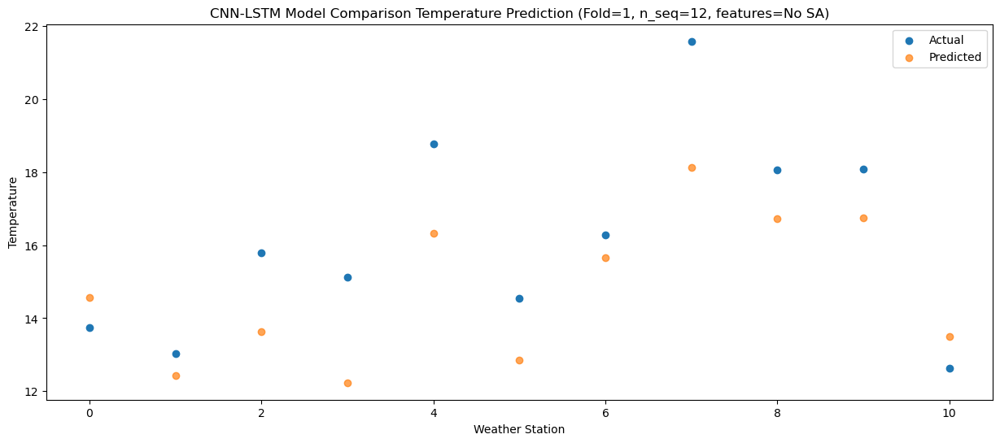

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_3 (Dropout)         (None, 1, 512)            0         
                                                                 
 lstm_2 (LSTM)               (None, 1, 512)            2099200   
                                                                 
 dropout_4 (Dropout)         (None, 1, 512)            0         
                                                                 
 lstm_3 (LSTM)               (None, 512)               2099200   
                                                      

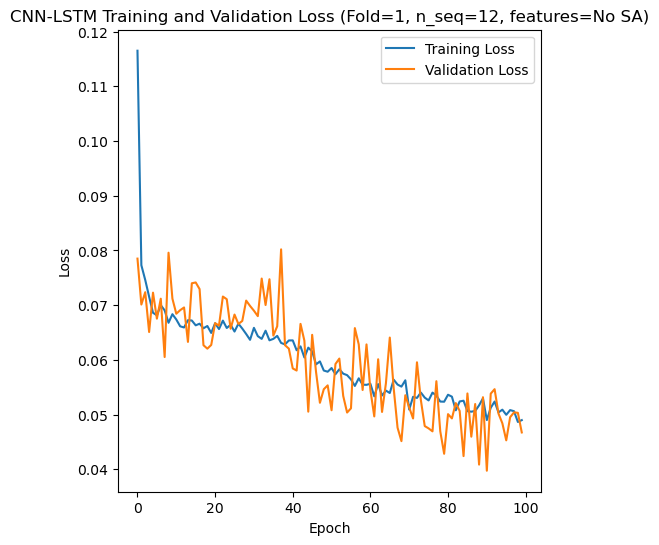

Epoch 1/100
84/84 [==============================] - 36s 196ms/step - loss: 0.1236 - accuracy: 0.6429 - mae: 0.1058 - rmse: 0.1236 - mape: 21.8672 - pearson: 0.7362 - val_loss: 0.0767 - val_accuracy: 0.9000 - val_mae: 0.0620 - val_rmse: 0.0767 - val_mape: 14.5347 - val_pearson: 0.8370
Epoch 2/100
84/84 [==============================] - 11s 128ms/step - loss: 0.0751 - accuracy: 0.7262 - mae: 0.0592 - rmse: 0.0751 - mape: 13.4063 - pearson: 0.7947 - val_loss: 0.0576 - val_accuracy: 0.9000 - val_mae: 0.0457 - val_rmse: 0.0576 - val_mape: 11.0324 - val_pearson: 0.9086
Epoch 3/100
84/84 [==============================] - 11s 134ms/step - loss: 0.0725 - accuracy: 0.7857 - mae: 0.0570 - rmse: 0.0725 - mape: 12.6251 - pearson: 0.8067 - val_loss: 0.0455 - val_accuracy: 0.9000 - val_mae: 0.0342 - val_rmse: 0.0455 - val_mape: 7.1788 - val_pearson: 0.9461
Epoch 4/100
84/84 [==============================] - 11s 131ms/step - loss: 0.0726 - accuracy: 0.7381 - mae: 0.0573 - rmse: 0.0726 - mape: 12.9

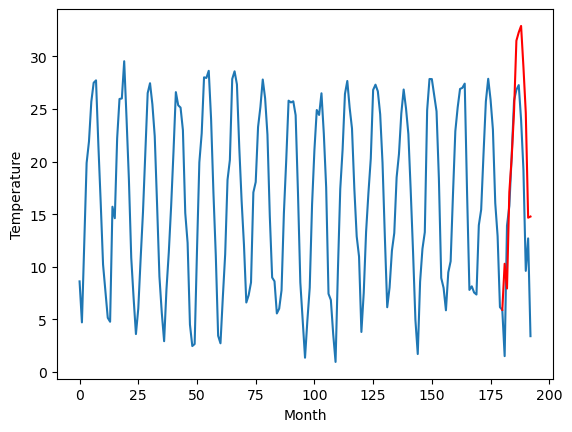

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.69		4.92		-1.77
2.65		2.41		-0.24
12.84		11.77		-1.07
16.60		15.06		-1.54
21.78		19.46		-2.32
29.03		26.26		-2.77
29.72		26.97		-2.75
30.48		27.52		-2.96
28.24		23.63		-4.61
19.98		19.19		-0.79
13.27		9.23		-4.04
10.88		9.18		-1.70
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.63, 4.917014737129211, 2.410612959861755, 11.766365904808044, 15.055521626472473, 19.46498074054718, 26.25691713809967, 26.97308130979538, 27.521519918441772, 23.63067795753479, 19.186024923324585, 9.228280324935913, 9.183295358419418]


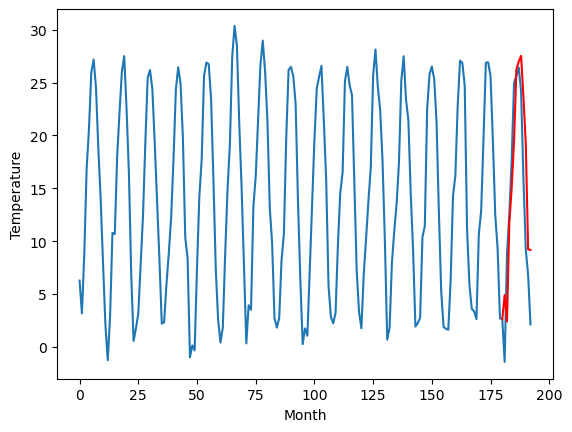

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.70		12.27		-0.43
15.43		13.71		-1.72
17.24		14.56		-2.68
19.05		17.87		-1.18
22.63		21.86		-0.77
23.85		26.34		2.49
24.64		27.94		3.30
24.69		27.83		3.14
23.41		25.07		1.66
22.27		20.38		-1.89
15.42		15.08		-0.34
16.32		13.52		-2.80
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[16.55, 12.273076259493827, 13.711444222331046, 14.558994376063346, 17.87066014945507, 21.86103209197521, 26.336240374445914, 27.94365843474865, 27.830300153195857, 25.074849904477595, 20.37827283233404, 15.08130771011114, 13.524674118459224]


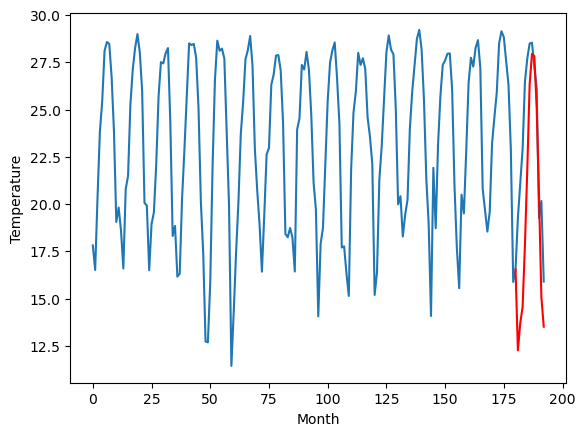

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.49		7.38		1.89
5.51		7.35		1.84
9.62		13.25		3.63
14.12		16.30		2.18
19.38		20.41		1.03
24.95		25.78		0.83
26.95		27.06		0.11
28.01		27.59		-0.42
24.84		23.98		-0.86
21.01		20.22		-0.79
12.93		11.32		-1.61
11.01		12.46		1.45
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.83, 7.381841249465943, 7.347175411581993, 13.250448040366173, 16.303507618308068, 20.412638954520226, 25.778518013358116, 27.063574604392052, 27.591590754389763, 23.981868140101433, 20.22397410094738, 11.31654345214367, 12.455067984461785]


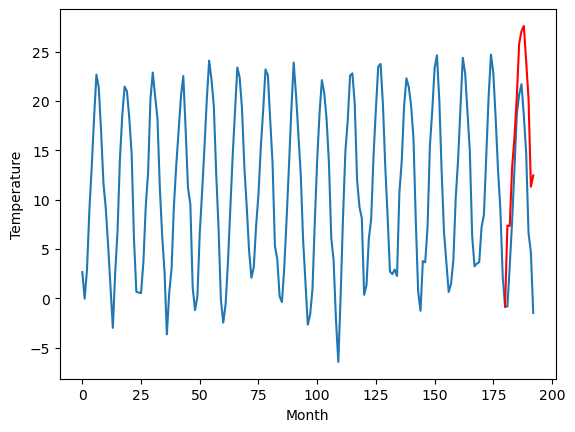

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.96		7.91		-1.05
8.22		8.68		0.46
15.55		12.94		-2.61
16.42		16.09		-0.33
20.89		20.08		-0.81
24.37		25.06		0.69
24.96		26.55		1.59
25.13		26.69		1.56
22.59		23.31		0.72
19.85		19.57		-0.28
11.58		11.91		0.33
14.99		12.41		-2.58
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.52, 7.910402641296386, 8.680838928222656, 12.943803176879882, 16.091873750686645, 20.0840252494812, 25.06098352432251, 26.55369614124298, 26.686473355293273, 23.31053517818451, 19.5729830121994, 11.908622965812683, 12.411839113235473]


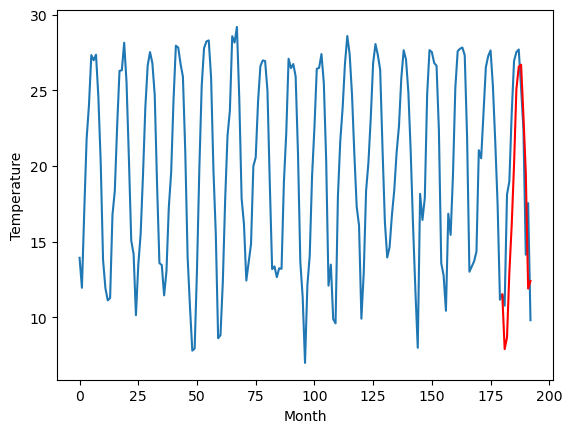

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.69		5.20		-0.49
3.34		5.44		2.10
11.72		11.02		-0.70
13.84		14.04		0.20
17.88		18.15		0.27
22.43		23.41		0.98
22.51		24.75		2.24
23.62		25.28		1.66
20.88		21.72		0.84
17.58		18.03		0.45
9.94		9.29		-0.65
13.18		10.46		-2.72
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.47, 5.200240163803101, 5.4372859287261965, 11.022117643356324, 14.041096000671388, 18.149012355804444, 23.41210439682007, 24.753558068275453, 25.277292757034303, 21.718499689102174, 18.027669219970704, 9.29395606994629, 10.457417993545533]


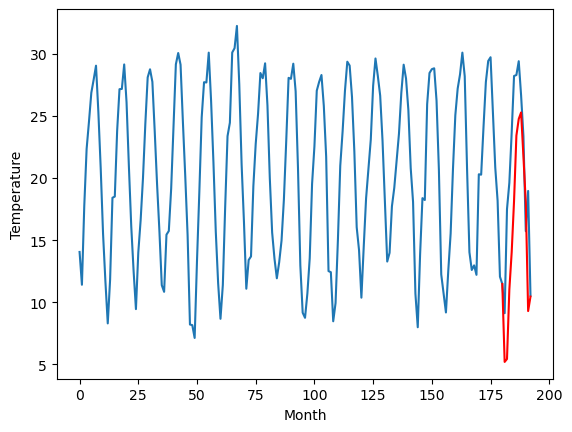

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
17.12		16.01		-1.11
14.01		13.99		-0.02
24.38		22.69		-1.69
26.08		25.91		-0.17
30.16		30.22		0.06
35.72		36.76		1.04
36.61		37.63		1.02
37.17		38.31		1.14
34.90		34.39		-0.51
30.39		30.13		-0.26
22.42		20.25		-2.17
24.71		20.65		-4.06
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 16.011084384918213, 13.98887640953064, 22.690623350143433, 25.907044715881348, 30.218610591888428, 36.763201541900635, 37.63167447566986, 38.3064581823349, 34.39206308841705, 30.133932538032532, 20.245329327583313, 20.652559317350388]


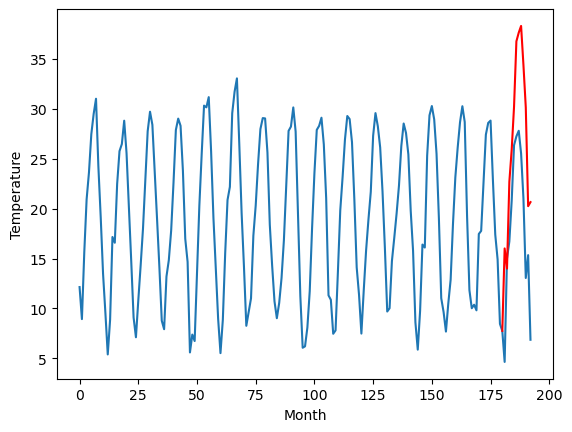

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.22		2.49		-0.73
6.14		3.58		-2.56
9.24		5.85		-3.39
15.90		9.02		-6.88
20.91		12.98		-7.93
25.90		17.71		-8.19
24.70		19.24		-5.46
24.18		19.17		-5.01
22.00		16.09		-5.91
15.44		11.72		-3.72
10.04		5.41		-4.63
6.69		4.63		-2.06
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.9, 2.488786153793335, 3.5833714532852174, 5.847356133460998, 9.015234999656677, 12.979201607704162, 17.708600811958313, 19.242121033668518, 19.17496141821146, 16.086033910810947, 11.721941560804844, 5.413275808393955, 4.632305652201175]


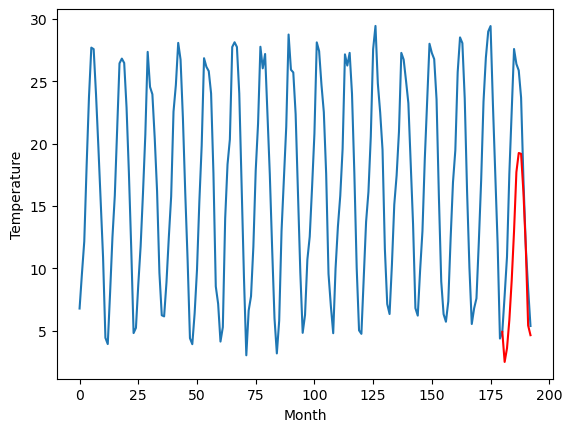

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.88		14.44		0.56
12.96		15.94		2.98
12.56		15.84		3.28
16.42		19.23		2.81
18.64		23.17		4.53
22.88		27.56		4.68
25.86		29.09		3.23
25.46		28.87		3.41
23.68		26.24		2.56
18.70		21.19		2.49
17.44		16.53		-0.91
10.93		14.31		3.38
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.14, 14.435718628168106, 15.938860269784927, 15.837523313760757, 19.229065748453138, 23.169541212320325, 27.558507295846937, 29.08653733372688, 28.870499881505964, 26.24082282423973, 21.193386586904523, 16.531559976339338, 14.307327302694318]


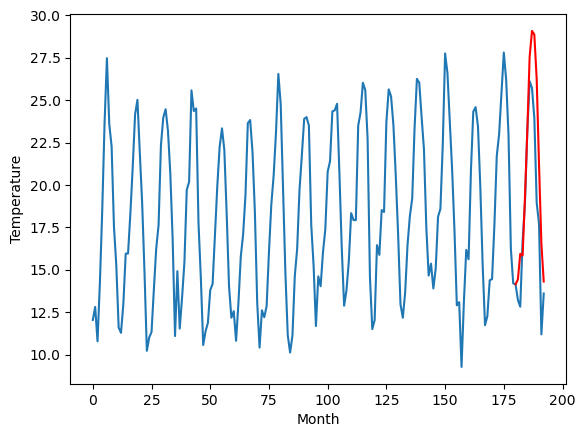

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.64		13.14		-0.50
14.14		13.77		-0.37
21.02		18.75		-2.27
23.81		21.84		-1.97
27.83		25.80		-2.03
32.12		30.86		-1.26
33.69		32.28		-1.41
33.78		32.60		-1.18
29.67		29.13		-0.54
26.39		25.46		-0.93
17.48		17.23		-0.25
19.40		18.14		-1.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.55, 13.138471949100495, 13.766390788555146, 18.745432841777802, 21.83509110212326, 25.795900571346284, 30.859697568416596, 32.283667075634, 32.596288341283795, 29.131145375967023, 25.462018626928327, 17.233611720800397, 18.13570078015327]


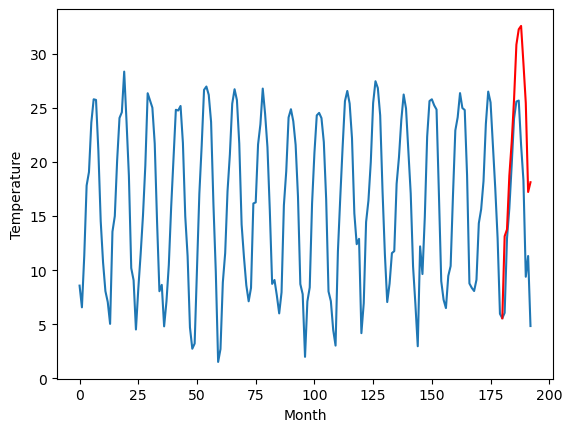

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.47		10.94		-1.53
13.82		10.88		-2.94
20.03		16.89		-3.14
22.00		19.97		-2.03
26.91		24.13		-2.78
32.32		29.55		-2.77
33.63		30.87		-2.76
33.71		31.45		-2.26
29.22		27.85		-1.37
25.46		24.14		-1.32
15.24		15.18		-0.06
17.34		16.37		-0.97
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.19, 10.938230528831483, 10.879168848842383, 16.892800669521094, 19.972183089107276, 24.13031373485923, 29.546836714595557, 30.87311885818839, 31.451890866607428, 27.845541159957648, 24.135271231979132, 15.175975959151984, 16.369677107185126]


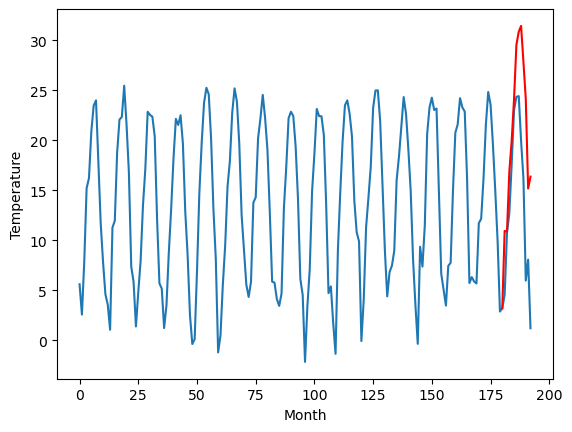

RangeIndex(start=1, stop=12, step=1)
[11.88, 6.69, 12.7, 5.490000000000001, 8.96, 5.69, 17.12, 3.2200000000000015, 13.880000000000003, 13.64, 12.47]
[10.287169709205628, 4.917014737129211, 12.273076259493827, 7.381841249465943, 7.910402641296386, 5.200240163803101, 16.011084384918213, 2.488786153793335, 14.435718628168106, 13.138471949100495, 10.938230528831483]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0   11.88  10.287170
1                 1    6.69   4.917015
2                 2   12.70  12.273076
3                 3    5.49   7.381841
4                 4    8.96   7.910403
5                 5    5.69   5.200240
6                 6   17.12  16.011084
7                 7    3.22   2.488786
8                 8   13.88  14.435719
9                 9   13.64  13.138472
10               10   12.47  10.938231


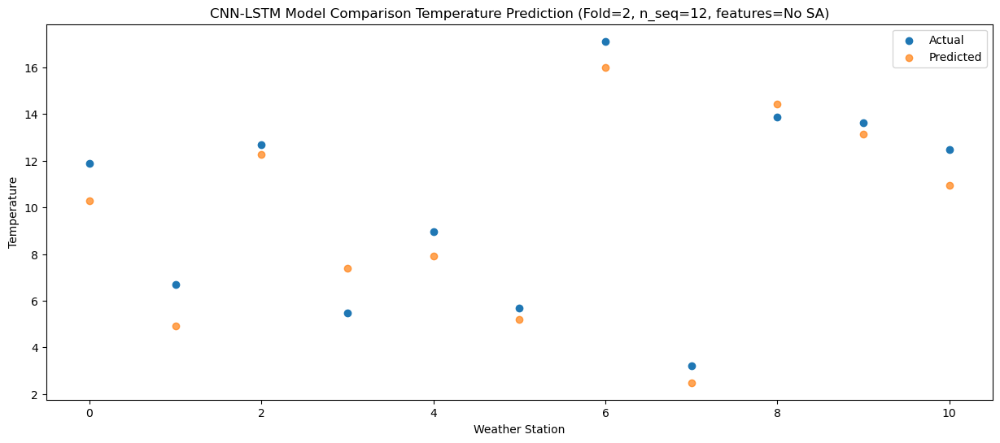

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    7.48   7.930823
1                 1    2.65   2.410613
2                 2   15.43  13.711444
3                 3    5.51   7.347175
4                 4    8.22   8.680839
5                 5    3.34   5.437286
6                 6   14.01  13.988876
7                 7    6.14   3.583371
8                 8   12.96  15.938860
9                 9   14.14  13.766391
10               10   13.82  10.879169


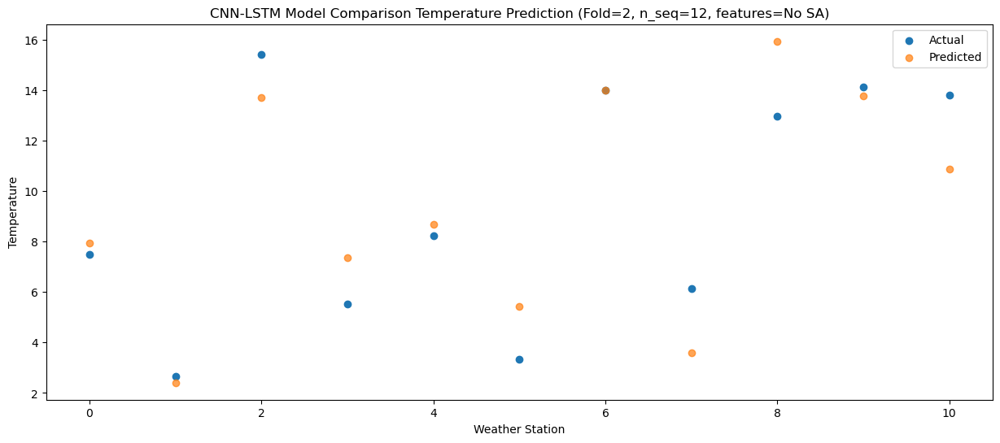

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   19.90  17.122005
1                 1   12.84  11.766366
2                 2   17.24  14.558994
3                 3    9.62  13.250448
4                 4   15.55  12.943803
5                 5   11.72  11.022118
6                 6   24.38  22.690623
7                 7    9.24   5.847356
8                 8   12.56  15.837523
9                 9   21.02  18.745433
10               10   20.03  16.892801


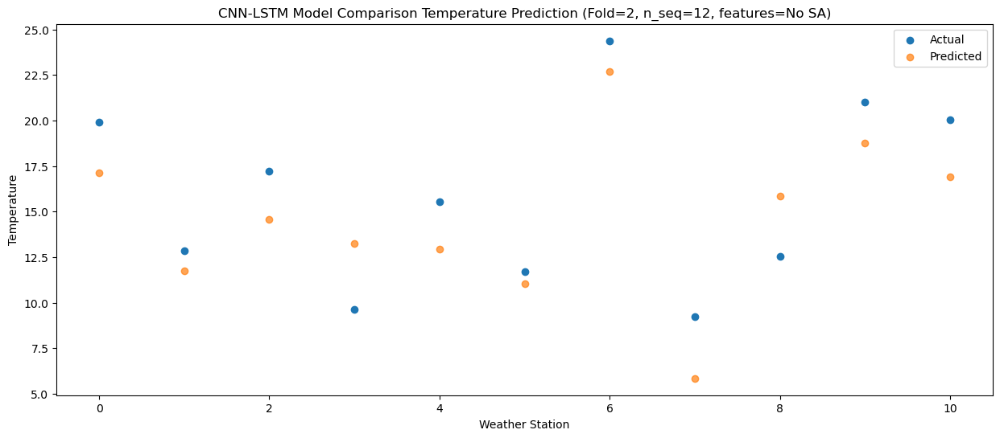

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   21.77  20.390999
1                 1   16.60  15.055522
2                 2   19.05  17.870660
3                 3   14.12  16.303508
4                 4   16.42  16.091874
5                 5   13.84  14.041096
6                 6   26.08  25.907045
7                 7   15.90   9.015235
8                 8   16.42  19.229066
9                 9   23.81  21.835091
10               10   22.00  19.972183


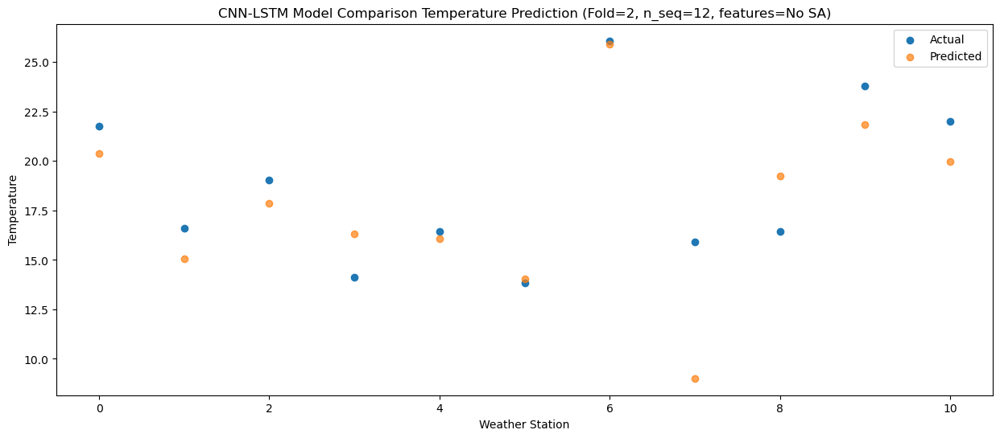

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   26.55  24.786709
1                 1   21.78  19.464981
2                 2   22.63  21.861032
3                 3   19.38  20.412639
4                 4   20.89  20.084025
5                 5   17.88  18.149012
6                 6   30.16  30.218611
7                 7   20.91  12.979202
8                 8   18.64  23.169541
9                 9   27.83  25.795901
10               10   26.91  24.130314


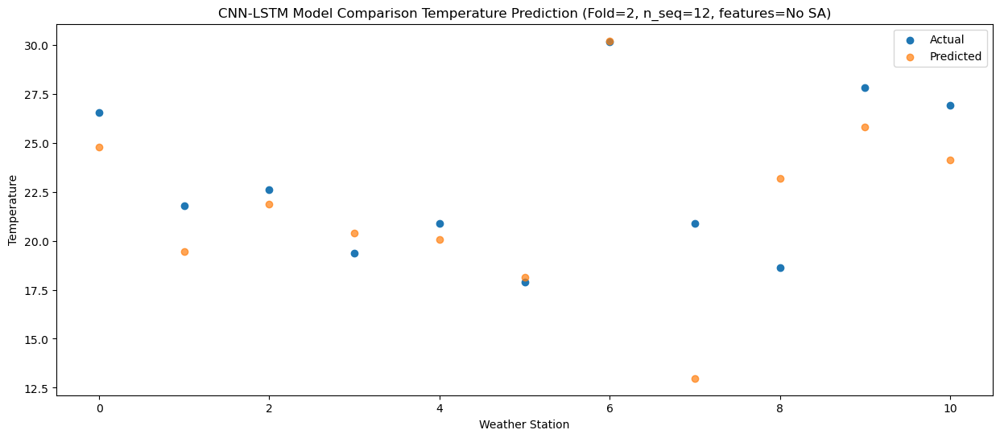

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   31.80  31.503896
1                 1   29.03  26.256917
2                 2   23.85  26.336240
3                 3   24.95  25.778518
4                 4   24.37  25.060984
5                 5   22.43  23.412104
6                 6   35.72  36.763202
7                 7   25.90  17.708601
8                 8   22.88  27.558507
9                 9   32.12  30.859698
10               10   32.32  29.546837


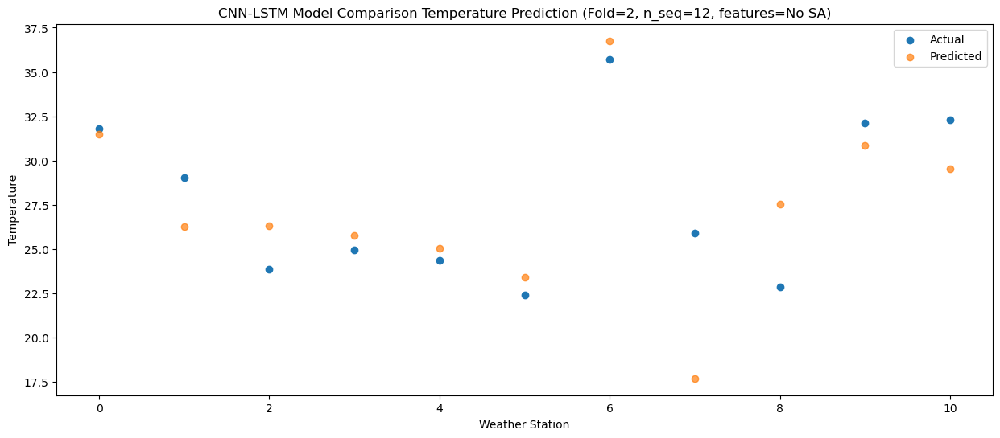

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   32.81  32.295597
1                 1   29.72  26.973081
2                 2   24.64  27.943658
3                 3   26.95  27.063575
4                 4   24.96  26.553696
5                 5   22.51  24.753558
6                 6   36.61  37.631674
7                 7   24.70  19.242121
8                 8   25.86  29.086537
9                 9   33.69  32.283667
10               10   33.63  30.873119


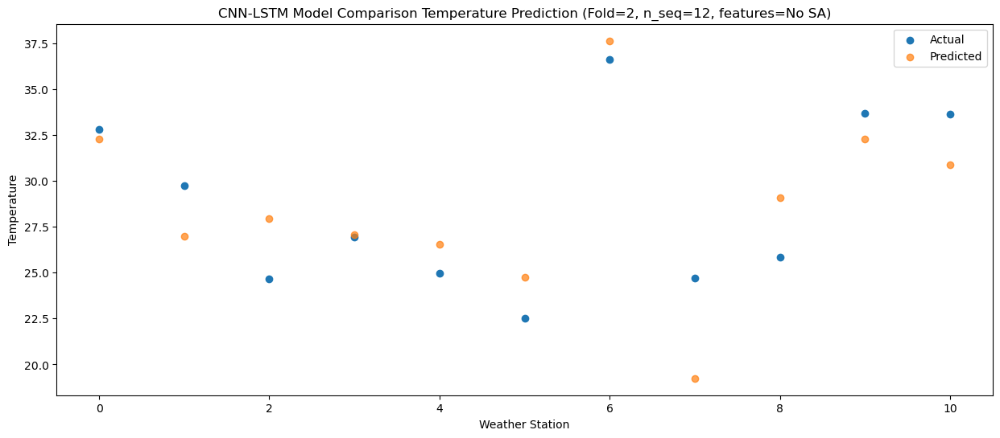

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   33.26  32.907667
1                 1   30.48  27.521520
2                 2   24.69  27.830300
3                 3   28.01  27.591591
4                 4   25.13  26.686473
5                 5   23.62  25.277293
6                 6   37.17  38.306458
7                 7   24.18  19.174961
8                 8   25.46  28.870500
9                 9   33.78  32.596288
10               10   33.71  31.451891


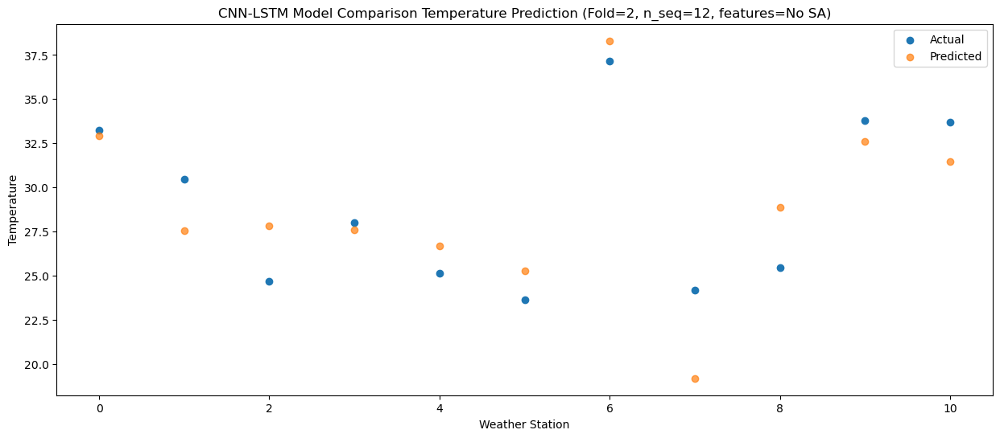

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   29.96  28.994828
1                 1   28.24  23.630678
2                 2   23.41  25.074850
3                 3   24.84  23.981868
4                 4   22.59  23.310535
5                 5   20.88  21.718500
6                 6   34.90  34.392063
7                 7   22.00  16.086034
8                 8   23.68  26.240823
9                 9   29.67  29.131145
10               10   29.22  27.845541


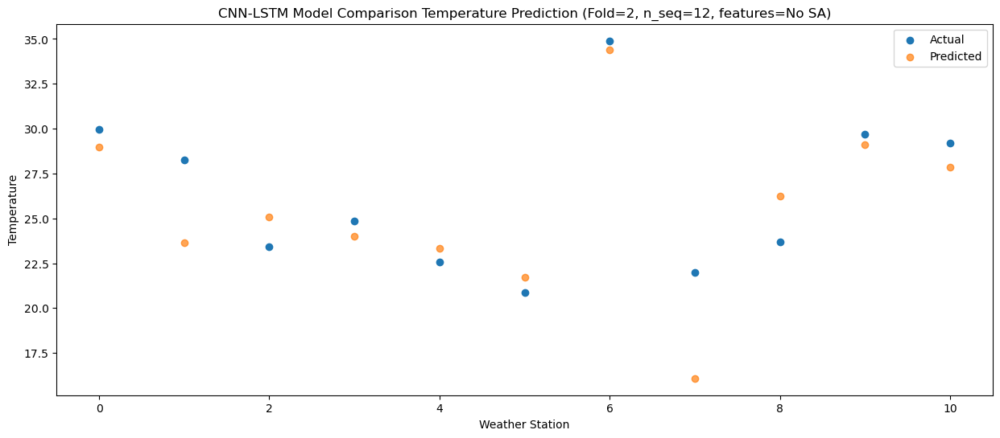

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   25.21  24.627646
1                 1   19.98  19.186025
2                 2   22.27  20.378273
3                 3   21.01  20.223974
4                 4   19.85  19.572983
5                 5   17.58  18.027669
6                 6   30.39  30.133933
7                 7   15.44  11.721942
8                 8   18.70  21.193387
9                 9   26.39  25.462019
10               10   25.46  24.135271


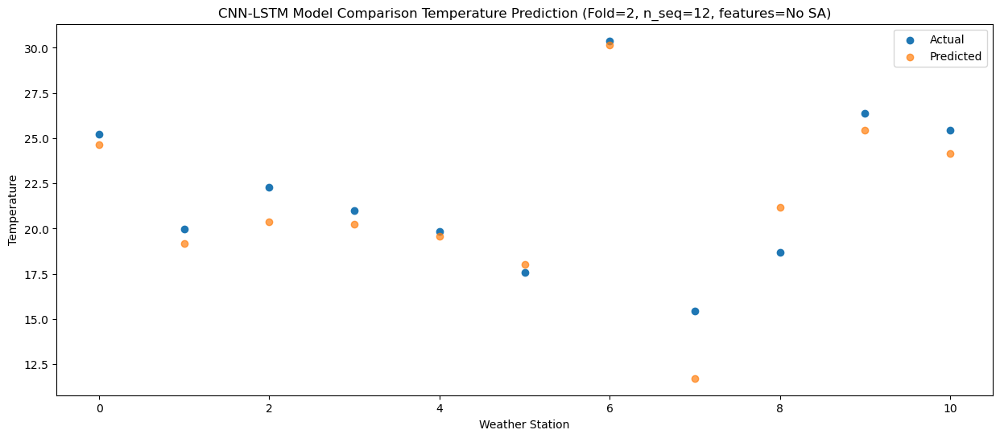

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   15.59  14.668901
1                 1   13.27   9.228280
2                 2   15.42  15.081308
3                 3   12.93  11.316543
4                 4   11.58  11.908623
5                 5    9.94   9.293956
6                 6   22.42  20.245329
7                 7   10.04   5.413276
8                 8   17.44  16.531560
9                 9   17.48  17.233612
10               10   15.24  15.175976


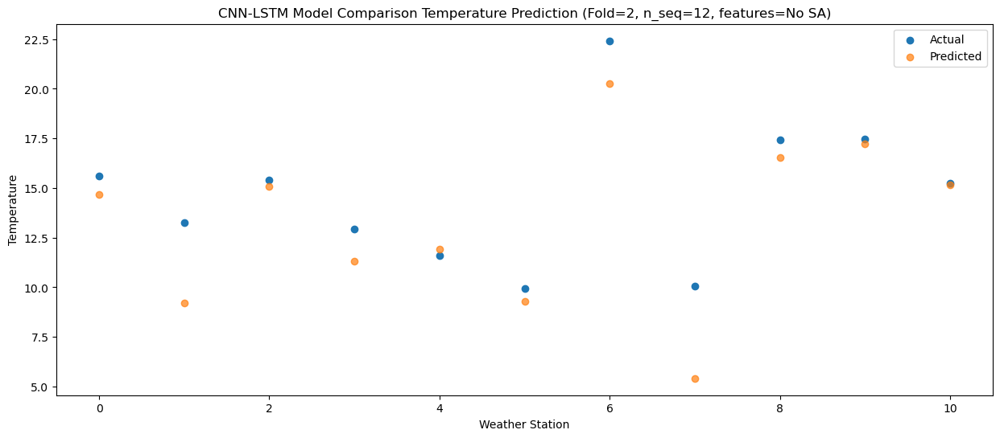

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   18.68  14.777628
1                 1   10.88   9.183295
2                 2   16.32  13.524674
3                 3   11.01  12.455068
4                 4   14.99  12.411839
5                 5   13.18  10.457418
6                 6   24.71  20.652559
7                 7    6.69   4.632306
8                 8   10.93  14.307327
9                 9   19.40  18.135701
10               10   17.34  16.369677


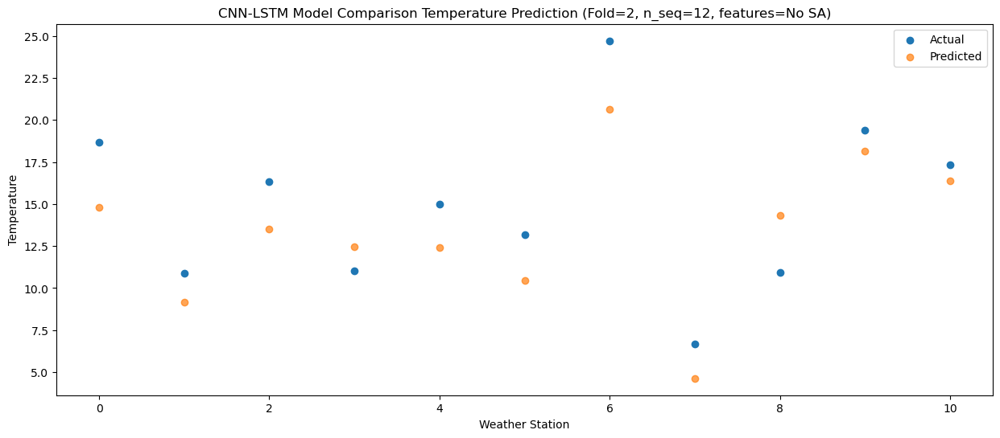

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_6 (Dropout)         (None, 1, 512)            0         
                                                                 
 lstm_4 (LSTM)               (None, 1, 512)            2099200   
                                                                 
 dropout_7 (Dropout)         (None, 1, 512)            0         
                                                                 
 lstm_5 (LSTM)               (None, 512)               2099200   
                                                      

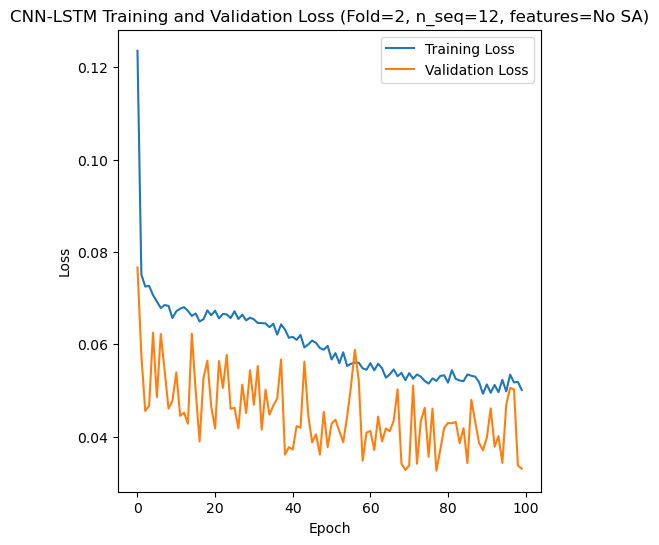

Epoch 1/100
84/84 [==============================] - 38s 223ms/step - loss: 0.1190 - accuracy: 0.7619 - mae: 0.1016 - rmse: 0.1190 - mape: 22.2260 - pearson: 0.7645 - val_loss: 0.1004 - val_accuracy: 0.2000 - val_mae: 0.0804 - val_rmse: 0.1004 - val_mape: 20.3149 - val_pearson: 0.7142
Epoch 2/100
84/84 [==============================] - 12s 143ms/step - loss: 0.0733 - accuracy: 0.7857 - mae: 0.0576 - rmse: 0.0733 - mape: 13.4345 - pearson: 0.8279 - val_loss: 0.0833 - val_accuracy: 0.7000 - val_mae: 0.0680 - val_rmse: 0.0833 - val_mape: 18.3489 - val_pearson: 0.7820
Epoch 3/100
84/84 [==============================] - 11s 133ms/step - loss: 0.0705 - accuracy: 0.7976 - mae: 0.0557 - rmse: 0.0705 - mape: 13.0320 - pearson: 0.8330 - val_loss: 0.0821 - val_accuracy: 0.7000 - val_mae: 0.0659 - val_rmse: 0.0821 - val_mape: 17.3896 - val_pearson: 0.7822
Epoch 4/100
84/84 [==============================] - 11s 136ms/step - loss: 0.0677 - accuracy: 0.8095 - mae: 0.0527 - rmse: 0.0677 - mape: 12.

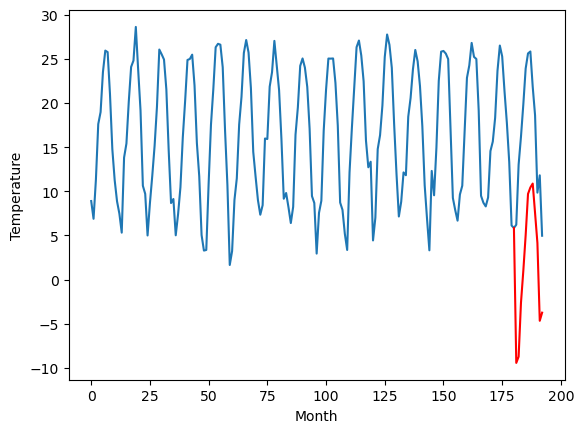

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.42		7.18		-1.24
4.70		4.14		-0.56
16.67		15.16		-1.51
18.53		19.62		1.09
22.75		24.45		1.70
29.46		31.79		2.33
30.77		32.10		1.33
31.34		32.75		1.41
28.61		28.97		0.36
22.01		24.20		2.19
14.30		14.08		-0.22
15.61		12.83		-2.78
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.2, 7.176960773468018, 4.137736148834229, 15.162976093292237, 19.61730463027954, 24.449287242889405, 31.785463161468506, 32.101030744314194, 32.74613300681114, 28.969114459753037, 24.200095332860947, 14.077981151342392, 12.83004382967949]


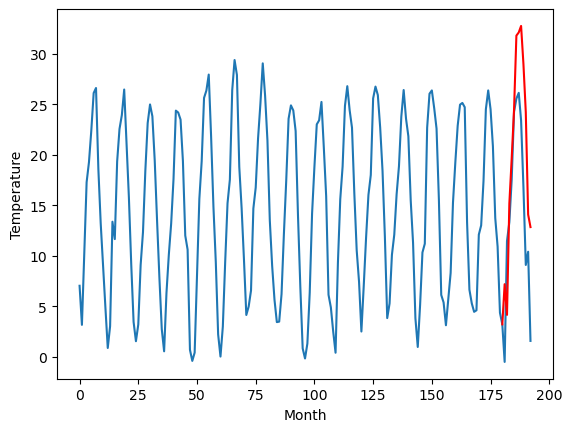

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.30		7.74		-2.56
12.60		8.26		-4.34
13.75		14.59		0.84
19.48		18.31		-1.17
24.28		22.40		-1.88
29.13		27.25		-1.88
32.26		27.96		-4.30
30.06		28.40		-1.66
26.75		24.99		-1.76
18.09		21.49		3.40
13.75		12.61		-1.14
9.83		13.42		3.59
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[8.48, 7.744981803894042, 8.25505856513977, 14.594614782333373, 18.310627498626708, 22.402762451171874, 27.246445217132568, 27.961580910682677, 28.39687920451164, 24.99495817065239, 21.48983074069023, 12.607781180143355, 13.419135459661483]


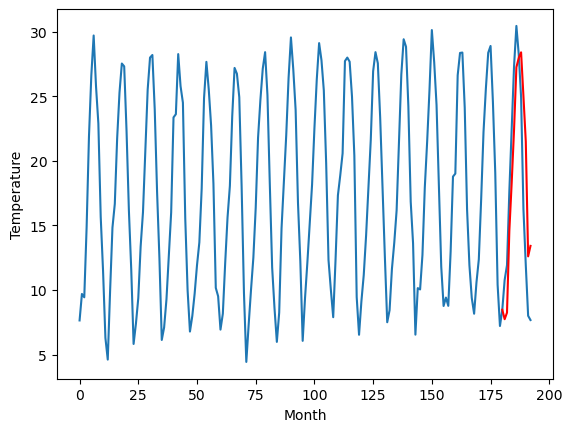

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.74		1.14		-0.60
0.42		-0.11		-0.53
10.63		8.53		-2.10
12.98		12.86		-0.12
17.05		17.34		0.29
22.97		23.66		0.69
23.96		24.17		0.21
24.48		24.80		0.32
20.35		21.06		0.71
16.77		16.71		-0.06
7.11		7.05		-0.06
8.60		6.90		-1.70
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.55, 1.137893867492676, -0.11230700016021711, 8.534432959556579, 12.860756945610046, 17.338813376426696, 23.664784502983093, 24.170123767852782, 24.795032393932342, 21.060549867153167, 16.711124551296233, 7.053247582912444, 6.8962914615869515]


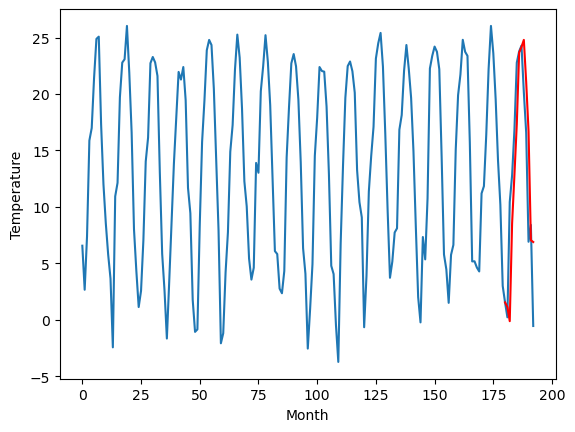

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.43		6.35		-1.08
3.56		2.56		-1.00
16.64		14.79		-1.85
19.93		19.42		-0.51
24.50		24.47		-0.03
31.98		32.21		0.23
31.98		32.46		0.48
32.10		32.86		0.76
28.74		29.02		0.28
23.32		24.06		0.74
13.58		14.15		0.57
13.22		12.05		-1.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.08, 6.348118448257447, 2.5587169170379642, 14.793037557601929, 19.41825451850891, 24.471669340133666, 32.205946111679076, 32.45666407942772, 32.85529446005821, 29.01508426070213, 24.059078687429427, 14.15012120604515, 12.050483697652815]


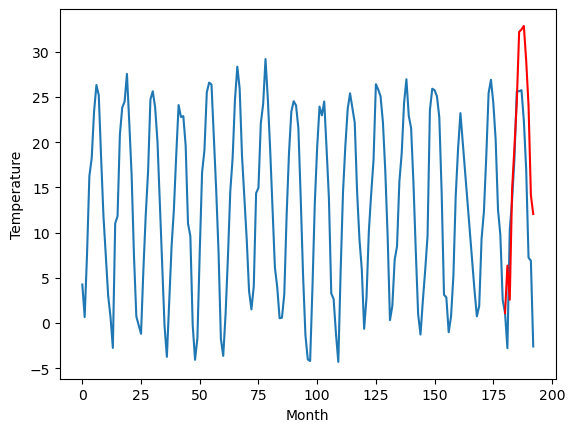

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.57		4.63		-0.94
2.85		1.59		-1.26
14.18		12.62		-1.56
17.63		17.08		-0.55
21.91		21.92		0.01
28.62		29.25		0.63
29.00		29.57		0.57
29.32		30.21		0.89
26.06		26.44		0.38
21.48		21.68		0.20
10.63		11.56		0.93
11.68		10.30		-1.38
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.21, 4.633508939743042, 1.5947418403625484, 12.62297155380249, 17.081813831329345, 21.91717435836792, 29.251503009796142, 29.566336501836776, 30.212480474710464, 26.439547468423843, 21.677803922891616, 11.558356214761734, 10.304667998552322]


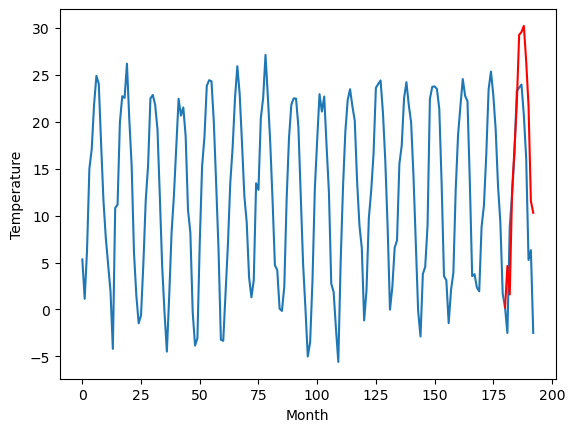

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.92		5.82		-2.10
8.02		5.36		-2.66
10.99		12.96		1.97
15.77		17.11		1.34
20.82		21.42		0.60
28.21		27.20		-1.01
30.05		27.81		-2.24
28.13		28.34		0.21
26.26		24.64		-1.62
18.29		20.57		2.28
15.55		11.27		-4.28
10.79		11.54		0.75
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-8.22, 5.824686908721924, 5.357740604877472, 12.96199723482132, 17.110403263568877, 21.422819340229033, 27.201478207111357, 27.81196948289871, 28.34181817770004, 24.64314111471176, 20.572227323055266, 11.272168958187102, 11.543412739038466]


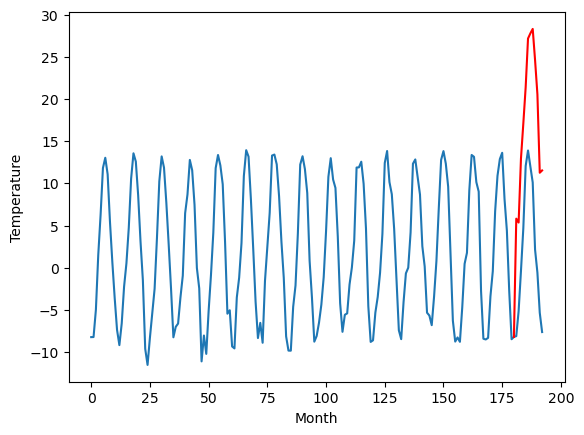

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.12		5.05		-2.07
9.97		5.15		-4.82
11.57		12.01		0.44
19.54		15.94		-3.60
23.97		20.16		-3.81
31.61		25.39		-6.22
32.69		26.11		-6.58
31.46		26.54		-4.92
27.49		23.01		-4.48
17.14		19.29		2.15
14.62		10.26		-4.36
7.35		10.86		3.51
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.04, 5.049828238487244, 5.149654097557068, 12.008852667808533, 15.94371814250946, 20.163336939811707, 25.392901606559754, 26.11291355609894, 26.539824701547623, 23.011381365060807, 19.292042471170426, 10.26175472855568, 10.856760598421097]


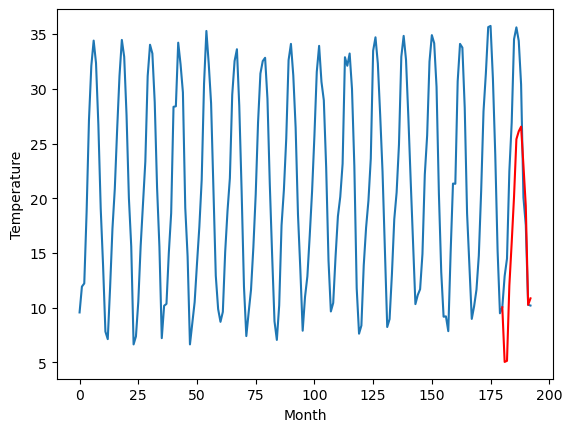

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.47		3.18		-2.29
6.40		4.06		-2.34
6.18		9.93		3.75
8.37		13.46		5.09
12.66		17.44		4.78
14.36		21.94		7.58
13.54		22.66		9.12
14.09		23.12		9.03
13.54		19.85		6.31
10.78		16.57		5.79
7.96		7.83		-0.13
4.26		8.84		4.58
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.17, 3.176375389099121, 4.064145267009735, 9.929764449596405, 13.455302655696869, 17.440639913082123, 21.935929238796234, 22.66312527656555, 23.121966809034348, 19.85455223917961, 16.567635744810104, 7.828362673521042, 8.836224645376205]


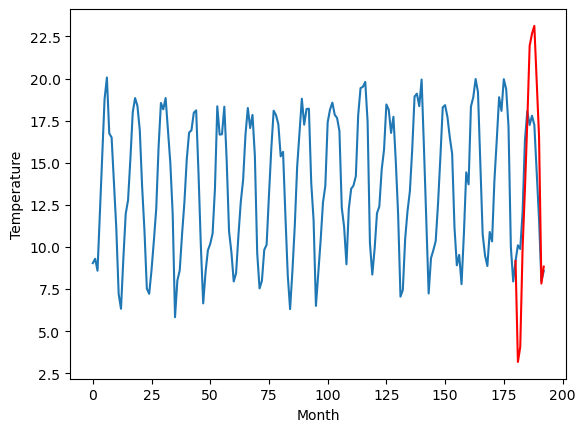

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.31		3.48		1.17
2.19		2.97		0.78
7.19		10.62		3.43
11.81		14.79		2.98
16.64		19.10		2.46
22.51		24.92		2.41
24.65		25.51		0.86
25.27		26.05		0.78
21.95		22.33		0.38
17.51		18.23		0.72
8.59		8.92		0.33
6.99		9.17		2.18
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.94, 3.4756079483032227, 2.9708709287643433, 10.617949442863464, 14.78883595943451, 19.099795298576353, 24.918258147239683, 25.512945132255552, 26.051782028675078, 22.33007206201553, 18.234708445072172, 8.916337625980375, 9.174046294689177]


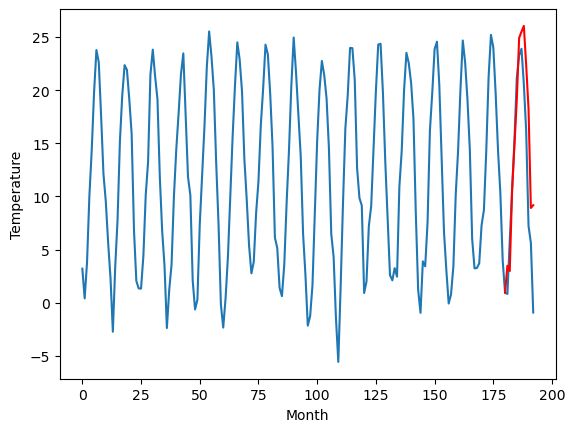

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-9.80		-10.16		-0.36
-10.60		-10.91		-0.31
-3.41		-2.95		0.46
1.46		1.26		-0.20
5.72		5.62		-0.10
11.89		11.64		-0.25
13.53		12.18		-1.35
13.26		12.76		-0.50
9.00		9.03		0.03
4.88		4.82		-0.06
-5.34		-4.63		0.71
-5.75		-4.51		1.24
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.13, -10.163152685165405, -10.909653356075287, -2.954331090450287, 1.2634795403480528, 5.615603754520416, 11.644635031223297, 12.175993392467499, 12.760722229480743, 9.034904072284698, 4.819049427509308, -4.634869029521942, -4.507201140522957]


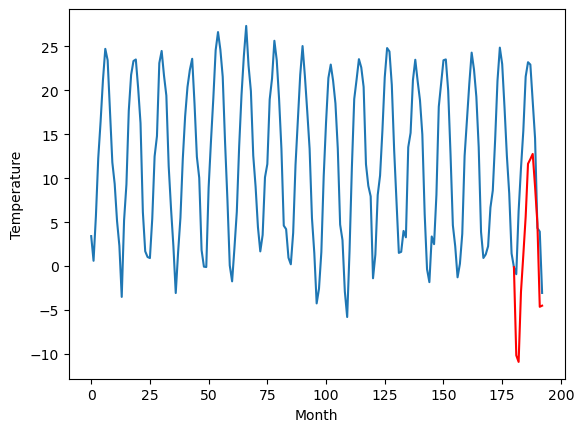

RangeIndex(start=1, stop=12, step=1)
[-8.520000000000001, 8.420000000000002, 10.299999999999999, 1.7399999999999998, 7.430000000000001, 5.5699999999999985, 7.92, 7.119999999999999, 5.4700000000000015, 2.3099999999999996, -9.8]
[-9.4269695186615, 7.176960773468018, 7.744981803894042, 1.137893867492676, 6.348118448257447, 4.633508939743042, 5.824686908721924, 5.049828238487244, 3.176375389099121, 3.4756079483032227, -10.163152685165405]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0   -8.52  -9.426970
1                 1    8.42   7.176961
2                 2   10.30   7.744982
3                 3    1.74   1.137894
4                 4    7.43   6.348118
5                 5    5.57   4.633509
6                 6    7.92   5.824687
7                 7    7.12   5.049828
8                 8    5.47   3.176375
9                 9    2.31   3.475608
10               10   -9.80 -10.163153


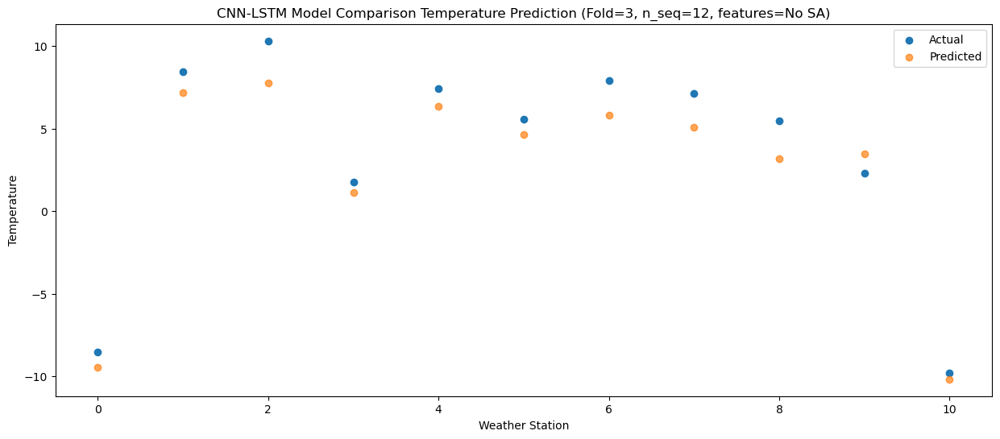

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -8.15  -8.717989
1                 1    4.70   4.137736
2                 2   12.60   8.255059
3                 3    0.42  -0.112307
4                 4    3.56   2.558717
5                 5    2.85   1.594742
6                 6    8.02   5.357741
7                 7    9.97   5.149654
8                 8    6.40   4.064145
9                 9    2.19   2.970871
10               10  -10.60 -10.909653


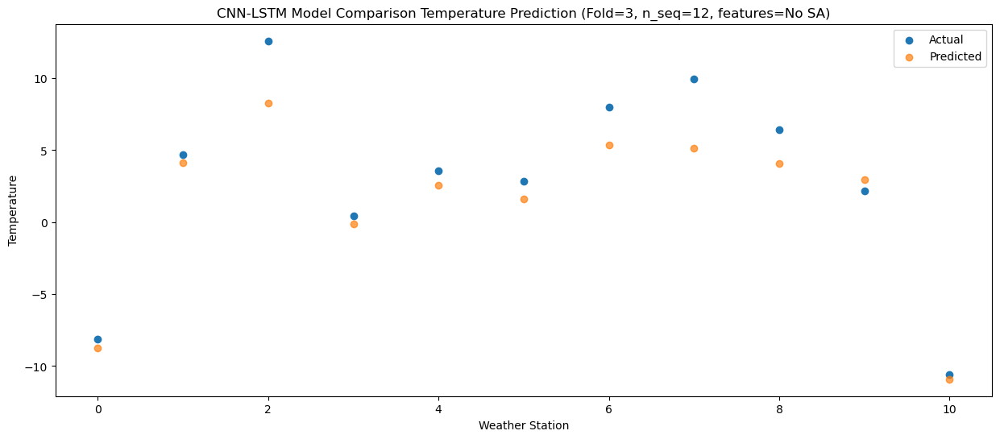

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   -1.35  -2.621538
1                 1   16.67  15.162976
2                 2   13.75  14.594615
3                 3   10.63   8.534433
4                 4   16.64  14.793038
5                 5   14.18  12.622972
6                 6   10.99  12.961997
7                 7   11.57  12.008853
8                 8    6.18   9.929764
9                 9    7.19  10.617949
10               10   -3.41  -2.954331


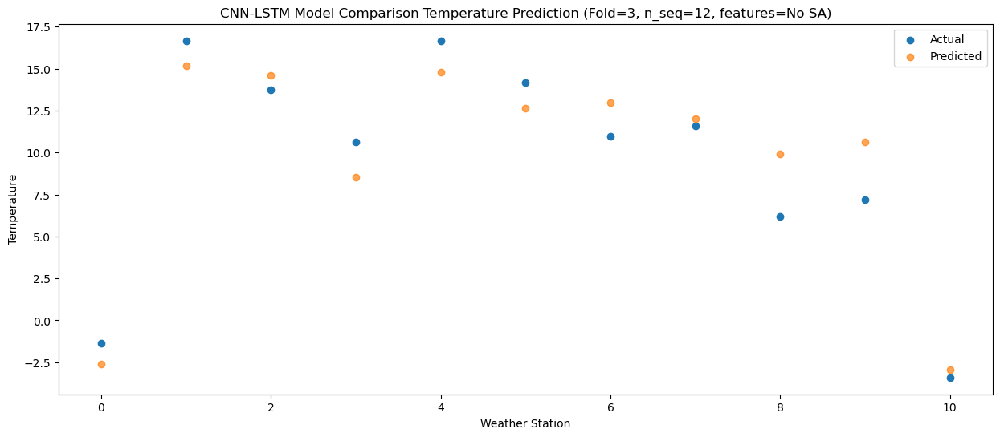

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    1.81   1.003140
1                 1   18.53  19.617305
2                 2   19.48  18.310627
3                 3   12.98  12.860757
4                 4   19.93  19.418255
5                 5   17.63  17.081814
6                 6   15.77  17.110403
7                 7   19.54  15.943718
8                 8    8.37  13.455303
9                 9   11.81  14.788836
10               10    1.46   1.263480


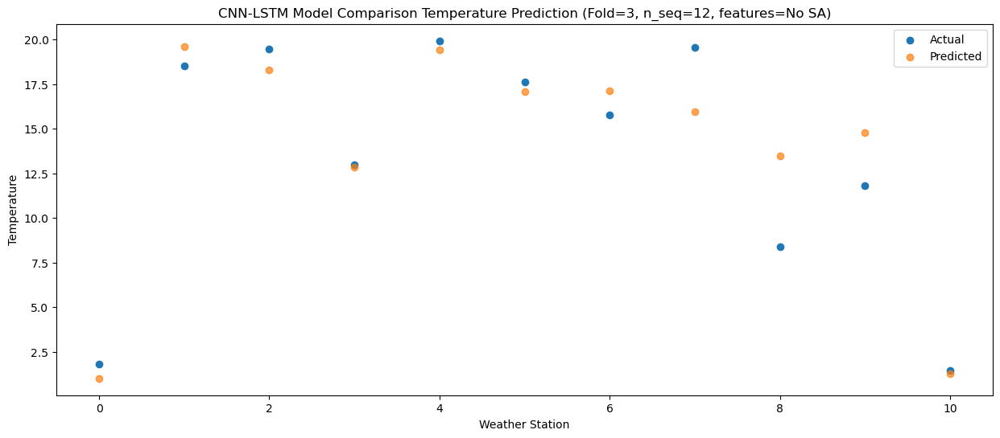

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    5.47   5.045429
1                 1   22.75  24.449287
2                 2   24.28  22.402762
3                 3   17.05  17.338813
4                 4   24.50  24.471669
5                 5   21.91  21.917174
6                 6   20.82  21.422819
7                 7   23.97  20.163337
8                 8   12.66  17.440640
9                 9   16.64  19.099795
10               10    5.72   5.615604


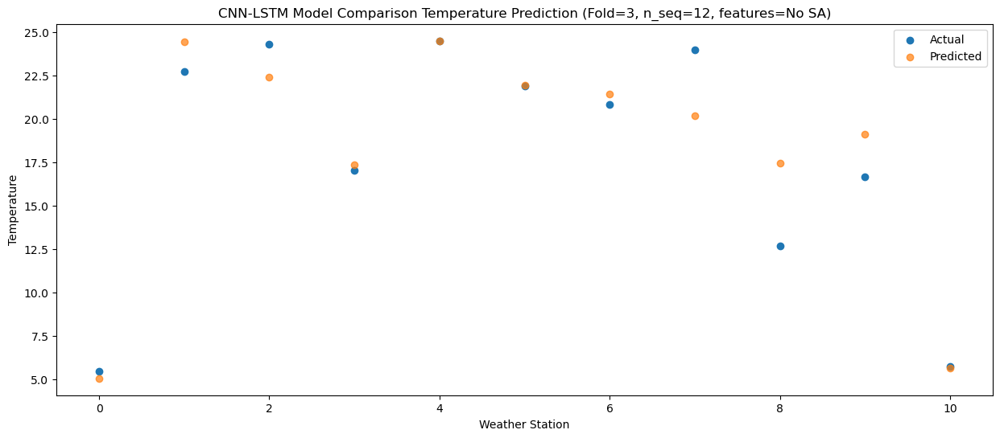

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0    9.53   9.707578
1                 1   29.46  31.785463
2                 2   29.13  27.246445
3                 3   22.97  23.664785
4                 4   31.98  32.205946
5                 5   28.62  29.251503
6                 6   28.21  27.201478
7                 7   31.61  25.392902
8                 8   14.36  21.935929
9                 9   22.51  24.918258
10               10   11.89  11.644635


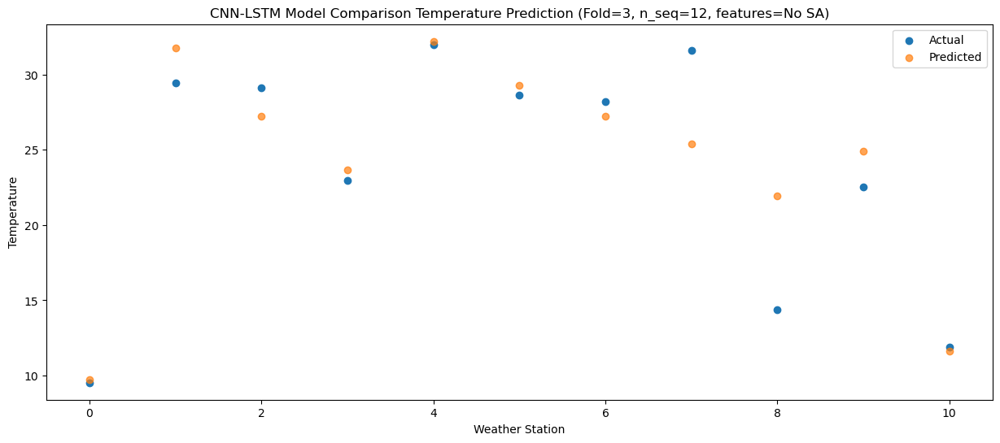

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   11.24  10.434997
1                 1   30.77  32.101031
2                 2   32.26  27.961581
3                 3   23.96  24.170124
4                 4   31.98  32.456664
5                 5   29.00  29.566337
6                 6   30.05  27.811969
7                 7   32.69  26.112914
8                 8   13.54  22.663125
9                 9   24.65  25.512945
10               10   13.53  12.175993


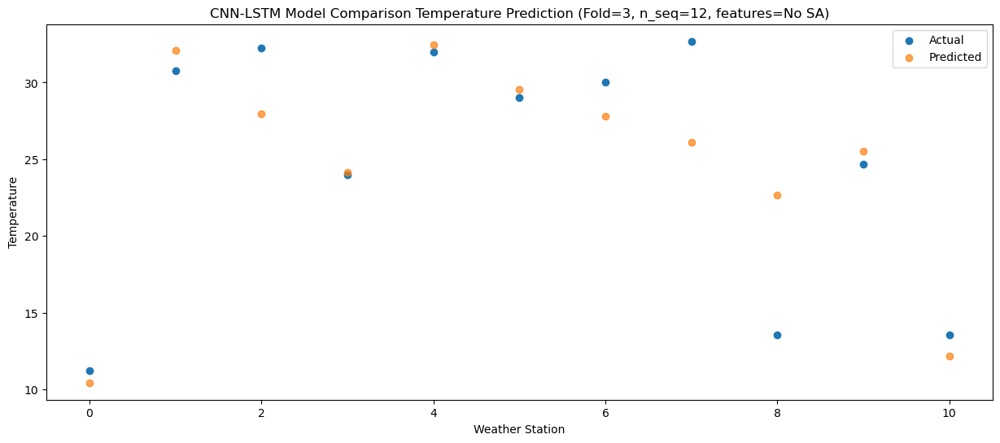

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   11.46  10.877531
1                 1   31.34  32.746133
2                 2   30.06  28.396879
3                 3   24.48  24.795032
4                 4   32.10  32.855294
5                 5   29.32  30.212480
6                 6   28.13  28.341818
7                 7   31.46  26.539825
8                 8   14.09  23.121967
9                 9   25.27  26.051782
10               10   13.26  12.760722


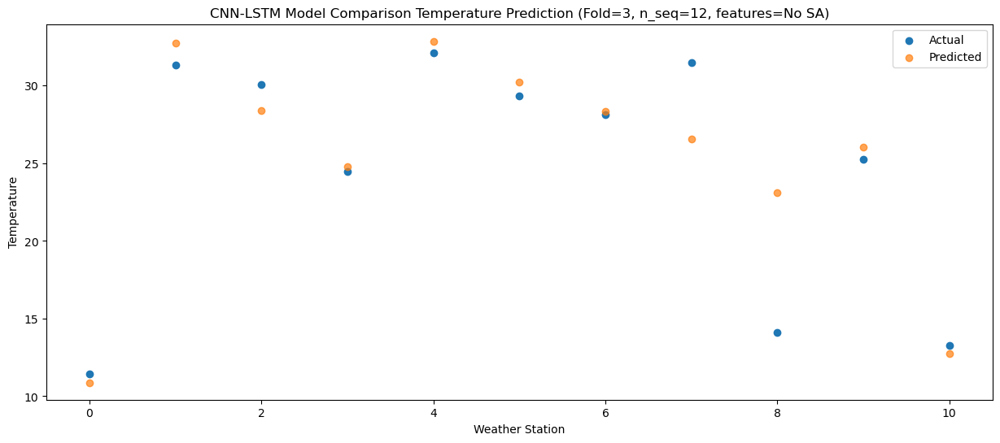

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0    7.47   7.539712
1                 1   28.61  28.969114
2                 2   26.75  24.994958
3                 3   20.35  21.060550
4                 4   28.74  29.015084
5                 5   26.06  26.439547
6                 6   26.26  24.643141
7                 7   27.49  23.011381
8                 8   13.54  19.854552
9                 9   21.95  22.330072
10               10    9.00   9.034904


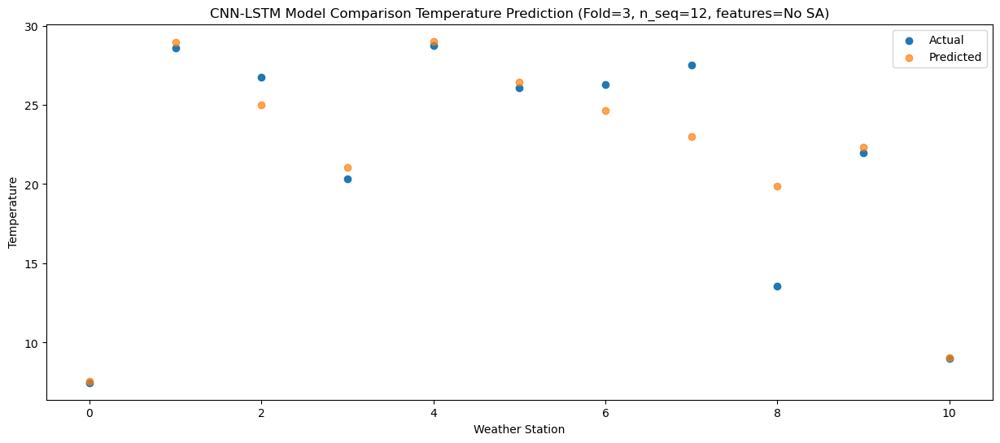

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    4.24   4.148759
1                 1   22.01  24.200095
2                 2   18.09  21.489831
3                 3   16.77  16.711125
4                 4   23.32  24.059079
5                 5   21.48  21.677804
6                 6   18.29  20.572227
7                 7   17.14  19.292042
8                 8   10.78  16.567636
9                 9   17.51  18.234708
10               10    4.88   4.819049


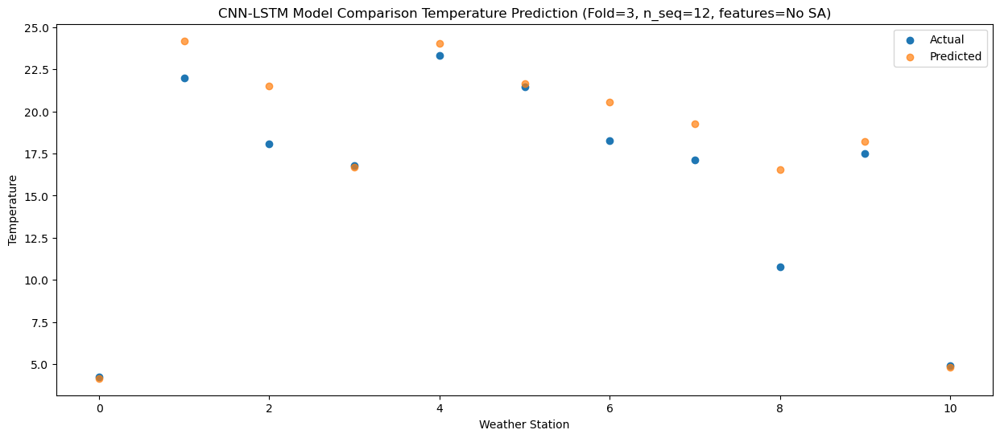

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   -4.52  -4.655232
1                 1   14.30  14.077981
2                 2   13.75  12.607781
3                 3    7.11   7.053248
4                 4   13.58  14.150121
5                 5   10.63  11.558356
6                 6   15.55  11.272169
7                 7   14.62  10.261755
8                 8    7.96   7.828363
9                 9    8.59   8.916338
10               10   -5.34  -4.634869


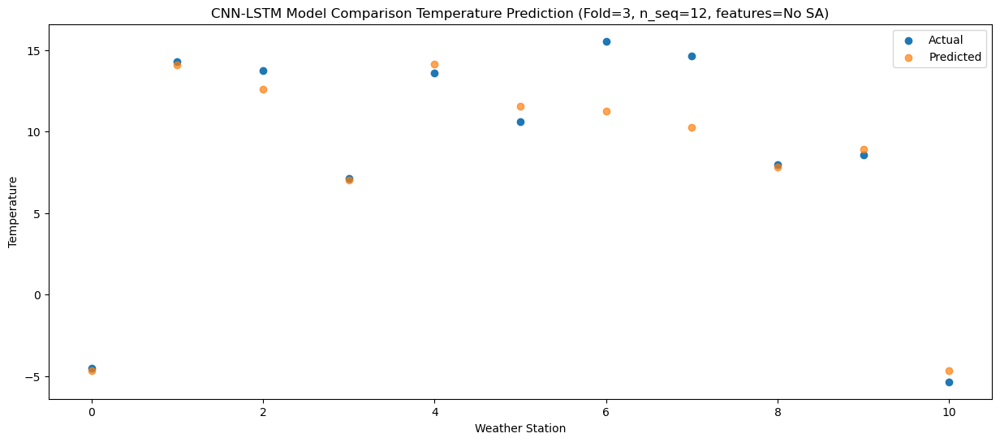

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   -2.56  -3.736884
1                 1   15.61  12.830044
2                 2    9.83  13.419135
3                 3    8.60   6.896291
4                 4   13.22  12.050484
5                 5   11.68  10.304668
6                 6   10.79  11.543413
7                 7    7.35  10.856761
8                 8    4.26   8.836225
9                 9    6.99   9.174046
10               10   -5.75  -4.507201


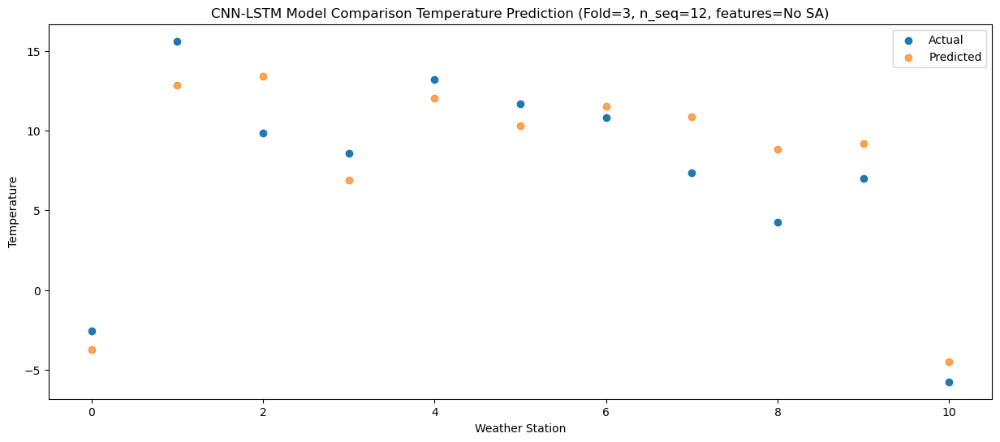

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_3 (Conv1D)           (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_9 (Dropout)         (None, 1, 512)            0         
                                                                 
 lstm_6 (LSTM)               (None, 1, 512)            2099200   
                                                                 
 dropout_10 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_7 (LSTM)               (None, 512)               2099200   
                                                      

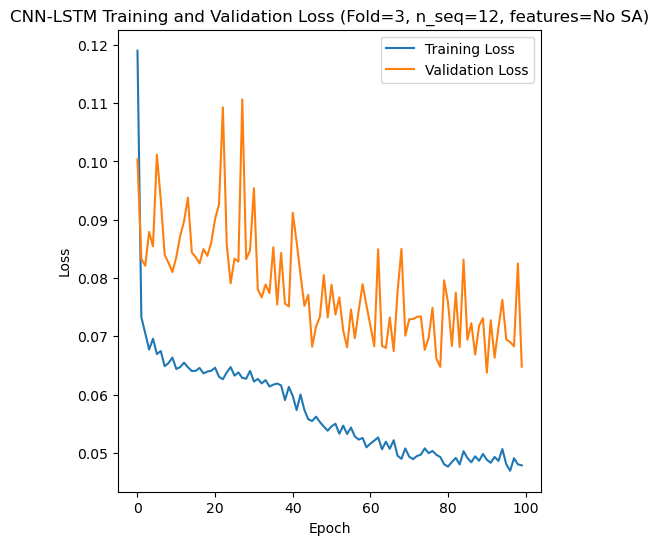

Epoch 1/100
84/84 [==============================] - 36s 201ms/step - loss: 0.1122 - accuracy: 0.6071 - mae: 0.0955 - rmse: 0.1122 - mape: 19.6728 - pearson: 0.7293 - val_loss: 0.0831 - val_accuracy: 0.7000 - val_mae: 0.0651 - val_rmse: 0.0831 - val_mape: 15.7560 - val_pearson: 0.8323
Epoch 2/100
84/84 [==============================] - 11s 134ms/step - loss: 0.0749 - accuracy: 0.6786 - mae: 0.0594 - rmse: 0.0749 - mape: 13.3576 - pearson: 0.7904 - val_loss: 0.0759 - val_accuracy: 0.7000 - val_mae: 0.0624 - val_rmse: 0.0759 - val_mape: 14.1495 - val_pearson: 0.8163
Epoch 3/100
84/84 [==============================] - 11s 132ms/step - loss: 0.0694 - accuracy: 0.7262 - mae: 0.0550 - rmse: 0.0694 - mape: 12.3442 - pearson: 0.8141 - val_loss: 0.0908 - val_accuracy: 0.7000 - val_mae: 0.0724 - val_rmse: 0.0908 - val_mape: 17.1234 - val_pearson: 0.7499
Epoch 4/100
84/84 [==============================] - 11s 134ms/step - loss: 0.0700 - accuracy: 0.7500 - mae: 0.0551 - rmse: 0.0700 - mape: 12.

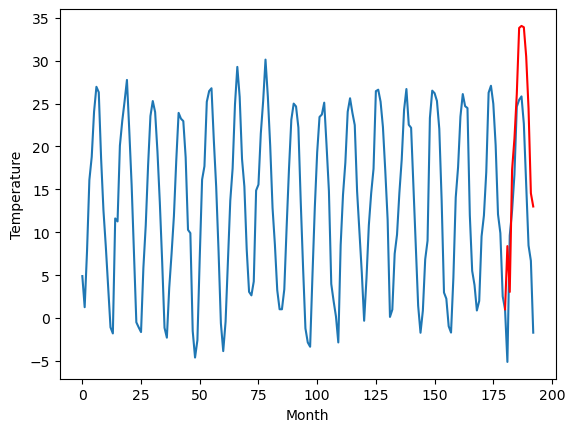

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.34		7.38		-0.96
11.77		7.39		-4.38
13.37		11.29		-2.08
14.81		14.92		0.11
18.85		18.33		-0.52
20.48		23.00		2.52
20.85		23.57		2.72
21.13		23.78		2.65
19.84		21.07		1.23
18.00		16.94		-1.06
10.84		9.97		-0.87
12.64		8.80		-3.84
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.25, 7.380769952535629, 7.385597013272345, 11.28953459147364, 14.915049814023078, 18.33440043810755, 23.000234864987434, 23.569262646473945, 23.78386493805796, 21.070689164437354, 16.93952079895884, 9.97483869675547, 8.799689255990089]


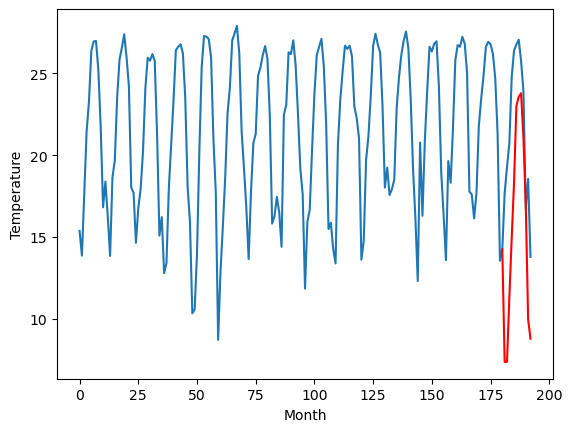

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.29		3.06		-1.23
2.37		1.13		-1.24
11.70		9.34		-2.36
12.77		12.95		0.18
17.24		17.57		0.33
21.50		23.40		1.90
22.16		23.75		1.59
22.81		23.91		1.10
19.69		20.59		0.90
16.30		16.34		0.04
7.63		6.81		-0.82
11.14		7.26		-3.88
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.06, 3.055491337776184, 1.130687127113342, 9.336236367225647, 12.954697737693786, 17.56591857433319, 23.402066836357115, 23.753307828903196, 23.91260201692581, 20.590670177936552, 16.340327332019804, 6.806335518360136, 7.264115313291548]


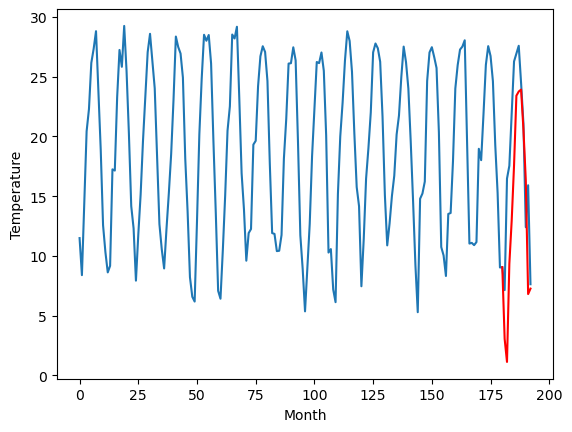

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.70		2.67		-0.03
-0.76		-1.31		-0.55
10.20		10.14		-0.06
11.89		13.74		1.85
16.05		18.63		2.58
21.73		25.52		3.79
23.32		25.93		2.61
23.69		25.67		1.98
20.90		22.23		1.33
16.25		16.75		0.50
8.25		7.13		-1.12
10.25		6.44		-3.81
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.48, 2.669956262111664, -1.307660286426544, 10.143090064525605, 13.741282041072846, 18.633318955898286, 25.516710813045503, 25.928483242988587, 25.66564279317856, 22.23341065168381, 16.749038989543916, 7.126270587444306, 6.442695434093476]


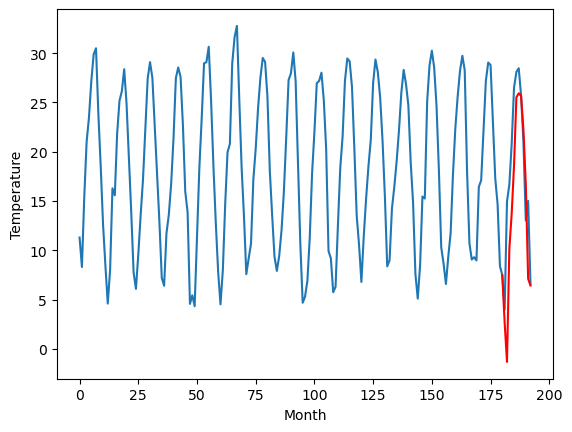

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.29		3.97		-0.32
0.40		-0.08		-0.48
11.32		11.50		0.18
13.50		15.08		1.58
17.03		19.98		2.95
23.88		26.91		3.03
25.37		27.33		1.96
25.74		27.05		1.31
22.31		23.63		1.32
17.44		18.07		0.63
9.60		8.52		-1.08
11.34		7.73		-3.61
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.33, 3.970922484397888, -0.0808453416824344, 11.499004855155945, 15.078010573387147, 19.98144389629364, 26.91064073085785, 27.325635089874268, 27.04832743048668, 23.63165925383568, 18.071850522756577, 8.5165889108181, 7.734895690679551]


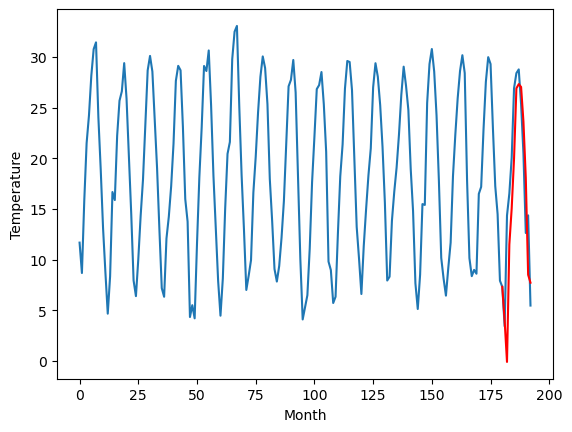

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.28		14.85		0.57
12.71		12.61		-0.10
21.96		20.32		-1.64
24.19		23.94		-0.25
29.68		28.61		-1.07
34.64		34.52		-0.12
34.38		35.16		0.78
34.70		34.74		0.04
34.01		31.70		-2.31
28.31		26.33		-1.98
21.37		18.80		-2.57
21.78		17.73		-4.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 14.852612857818604, 12.613860969543458, 20.321411495208743, 23.943539981842044, 28.609676723480227, 34.520847206115725, 35.15524715662003, 34.73976439714432, 31.695693438053134, 26.325487558841708, 18.796236937046054, 17.73165756940842]


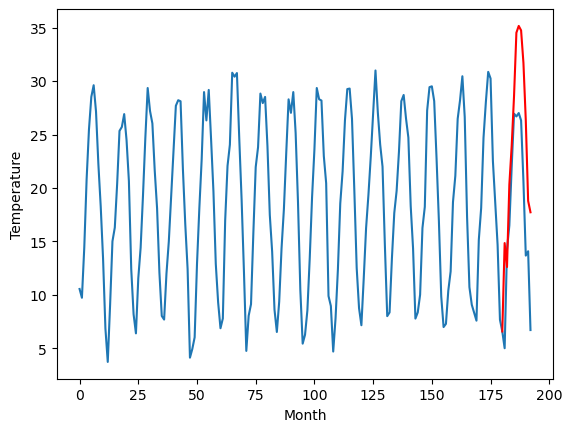

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.72		10.25		-1.47
12.39		9.06		-3.33
18.79		16.22		-2.57
21.52		19.71		-1.81
24.97		24.15		-0.82
28.99		29.51		0.52
30.73		29.80		-0.93
30.86		29.98		-0.88
26.89		26.93		0.04
23.09		22.86		-0.23
14.93		13.75		-1.18
16.84		14.53		-2.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.04, 10.24934886932373, 9.057288279533386, 16.217764010429384, 19.710625758171084, 24.150805106163027, 29.511615862846377, 29.798505058288576, 29.97918314278126, 26.93009204208851, 22.86148614227772, 13.74649304687977, 14.534188693165781]


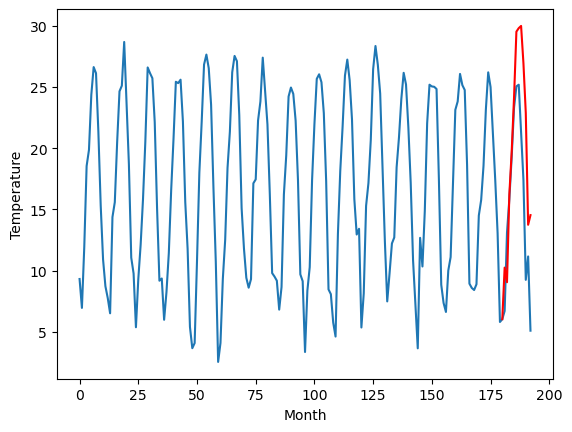

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.64		10.28		0.64
6.03		5.99		-0.04
18.30		18.25		-0.05
20.20		21.84		1.64
24.24		26.80		2.56
30.54		33.95		3.41
31.83		34.34		2.51
32.35		34.24		1.89
29.31		30.74		1.43
23.54		25.26		1.72
15.60		15.22		-0.38
17.06		14.45		-2.61
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.13, 10.27732771396637, 5.990715203285218, 18.2476837015152, 21.835487780570986, 26.797203955650332, 33.946683821678164, 34.34181692957878, 34.24125503510237, 30.738416423499586, 25.255509605109694, 15.217927207648756, 14.451877524554732]


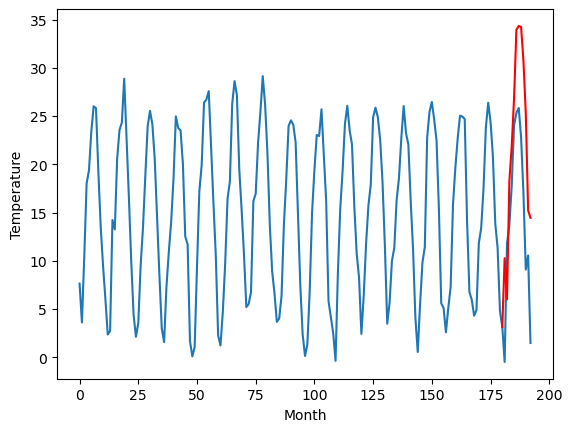

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.11		10.55		0.44
6.75		6.22		-0.53
18.72		18.74		0.02
22.37		22.37		0.00
26.78		27.37		0.59
34.02		34.66		0.64
34.59		35.02		0.43
35.45		35.13		-0.32
31.96		31.62		-0.34
26.61		26.28		-0.33
15.75		15.90		0.15
16.07		15.24		-0.83
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.29, 10.54716187953949, 6.218797030448913, 18.73584491252899, 22.373767199516294, 27.37245494365692, 34.65899306774139, 35.01625994086265, 35.134128476083276, 31.618238354623315, 26.27588310331106, 15.903304482400415, 15.238851810395715]


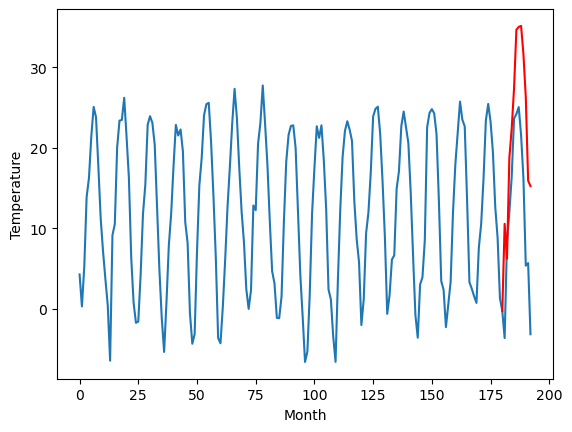

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		9.46		0.93
4.09		4.19		0.10
17.95		18.35		0.40
21.66		22.03		0.37
26.44		27.19		0.75
33.83		34.84		1.01
33.54		35.07		1.53
33.82		35.03		1.21
30.71		31.51		0.80
25.25		25.68		0.43
14.94		15.49		0.55
14.69		14.18		-0.51
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-1.03, 9.459747133255005, 4.1854999637603765, 18.35172730445862, 22.033135471343996, 27.18950420379639, 34.839541015625, 35.068624225854876, 35.034078081548216, 31.510643442571165, 25.67766137927771, 15.491078813970091, 14.177238186299803]


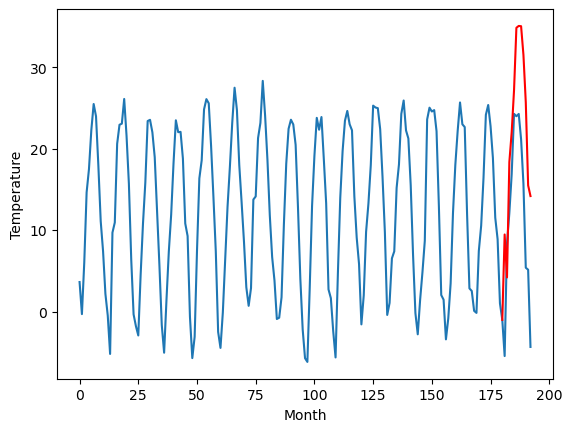

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.40		8.19		0.79
5.16		4.76		-0.40
15.05		15.81		0.76
18.85		19.54		0.69
23.38		24.34		0.96
30.27		31.25		0.98
30.43		31.69		1.26
31.63		31.88		0.25
27.34		28.37		1.03
23.81		23.56		-0.25
13.41		13.30		-0.11
12.55		13.21		0.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-2.29, 8.189432330131531, 4.7584008646011355, 15.806310601234436, 19.53860420703888, 24.339374012947083, 31.246488518714905, 31.693389959335327, 31.88231313943863, 28.367349274158478, 23.559908039569855, 13.299293644428253, 13.209498263597489]


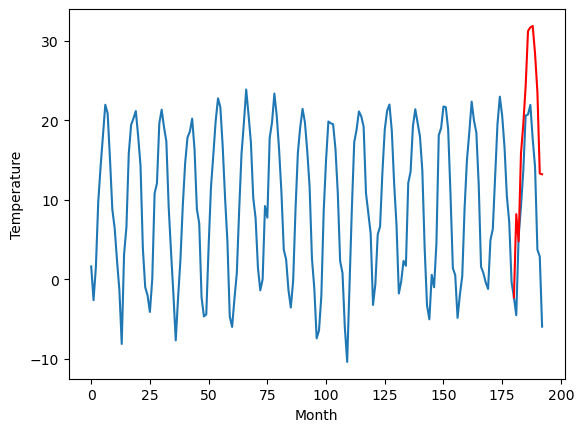

RangeIndex(start=1, stop=12, step=1)
[7.810000000000001, 8.339999999999998, 4.290000000000002, 2.7000000000000006, 4.289999999999999, 14.280000000000001, 11.719999999999999, 9.64, 10.11, 8.53, 7.4]
[8.384701080322266, 7.380769952535629, 3.055491337776184, 2.669956262111664, 3.970922484397888, 14.852612857818604, 10.24934886932373, 10.27732771396637, 10.54716187953949, 9.459747133255005, 8.189432330131531]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.81   8.384701
1                 1    8.34   7.380770
2                 2    4.29   3.055491
3                 3    2.70   2.669956
4                 4    4.29   3.970922
5                 5   14.28  14.852613
6                 6   11.72  10.249349
7                 7    9.64  10.277328
8                 8   10.11  10.547162
9                 9    8.53   9.459747
10               10    7.40   8.189432


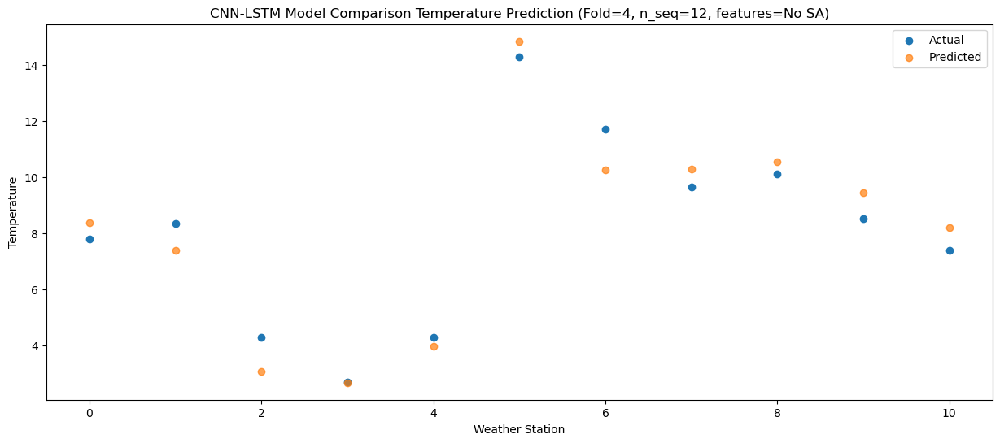

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.68   3.040151
1                 1   11.77   7.385597
2                 2    2.37   1.130687
3                 3   -0.76  -1.307660
4                 4    0.40  -0.080845
5                 5   12.71  12.613861
6                 6   12.39   9.057288
7                 7    6.03   5.990715
8                 8    6.75   6.218797
9                 9    4.09   4.185500
10               10    5.16   4.758401


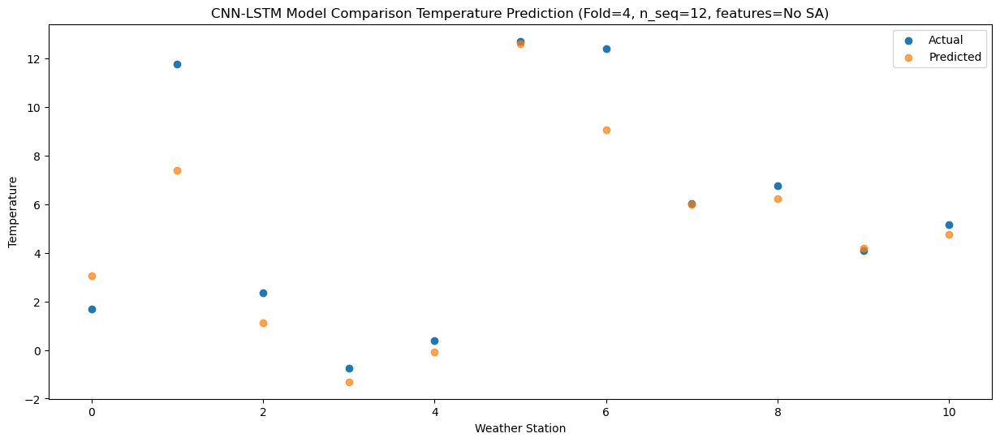

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.41  17.301831
1                 1   13.37  11.289535
2                 2   11.70   9.336236
3                 3   10.20  10.143090
4                 4   11.32  11.499005
5                 5   21.96  20.321411
6                 6   18.79  16.217764
7                 7   18.30  18.247684
8                 8   18.72  18.735845
9                 9   17.95  18.351727
10               10   15.05  15.806311


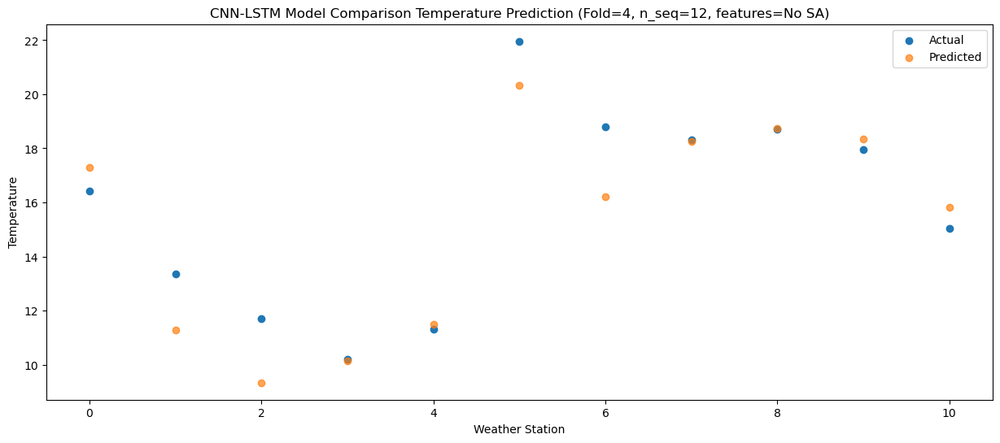

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   19.32  20.920406
1                 1   14.81  14.915050
2                 2   12.77  12.954698
3                 3   11.89  13.741282
4                 4   13.50  15.078011
5                 5   24.19  23.943540
6                 6   21.52  19.710626
7                 7   20.20  21.835488
8                 8   22.37  22.373767
9                 9   21.66  22.033135
10               10   18.85  19.538604


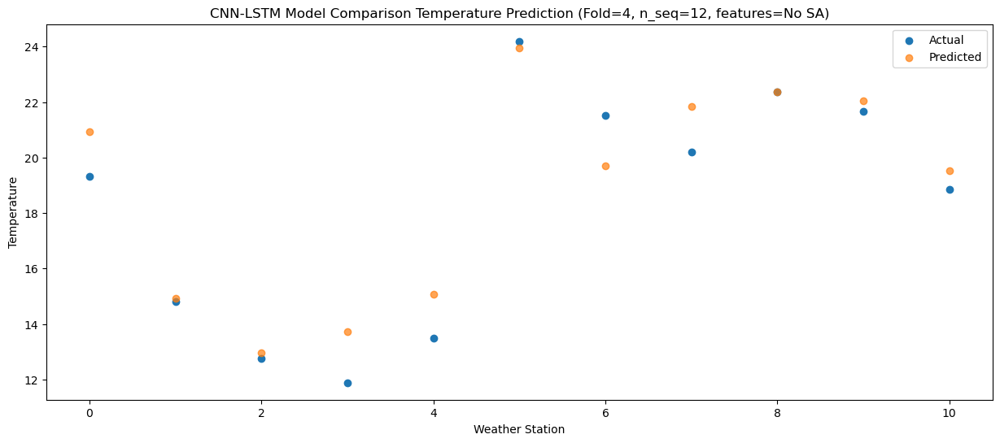

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   23.53  26.122005
1                 1   18.85  18.334400
2                 2   17.24  17.565919
3                 3   16.05  18.633319
4                 4   17.03  19.981444
5                 5   29.68  28.609677
6                 6   24.97  24.150805
7                 7   24.24  26.797204
8                 8   26.78  27.372455
9                 9   26.44  27.189504
10               10   23.38  24.339374


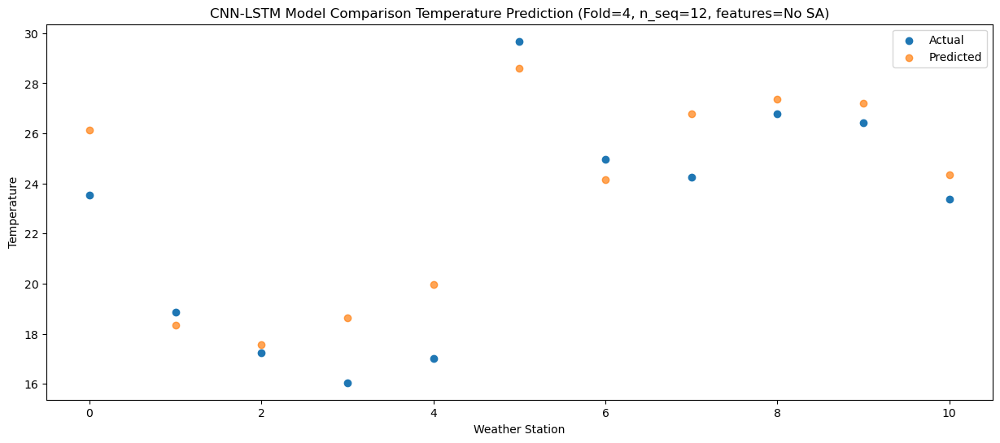

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   31.44  33.821513
1                 1   20.48  23.000235
2                 2   21.50  23.402067
3                 3   21.73  25.516711
4                 4   23.88  26.910641
5                 5   34.64  34.520847
6                 6   28.99  29.511616
7                 7   30.54  33.946684
8                 8   34.02  34.658993
9                 9   33.83  34.839541
10               10   30.27  31.246489


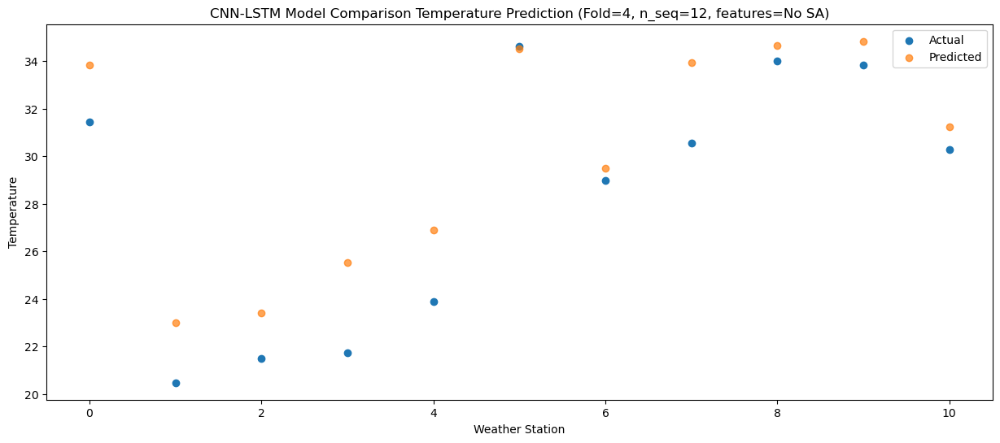

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   32.24  34.057265
1                 1   20.85  23.569263
2                 2   22.16  23.753308
3                 3   23.32  25.928483
4                 4   25.37  27.325635
5                 5   34.38  35.155247
6                 6   30.73  29.798505
7                 7   31.83  34.341817
8                 8   34.59  35.016260
9                 9   33.54  35.068624
10               10   30.43  31.693390


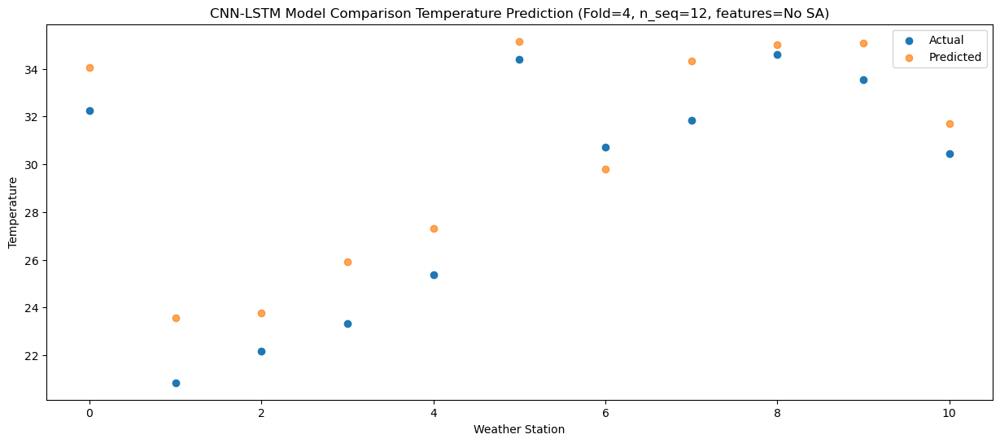

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   32.64  33.901802
1                 1   21.13  23.783865
2                 2   22.81  23.912602
3                 3   23.69  25.665643
4                 4   25.74  27.048327
5                 5   34.70  34.739764
6                 6   30.86  29.979183
7                 7   32.35  34.241255
8                 8   35.45  35.134128
9                 9   33.82  35.034078
10               10   31.63  31.882313


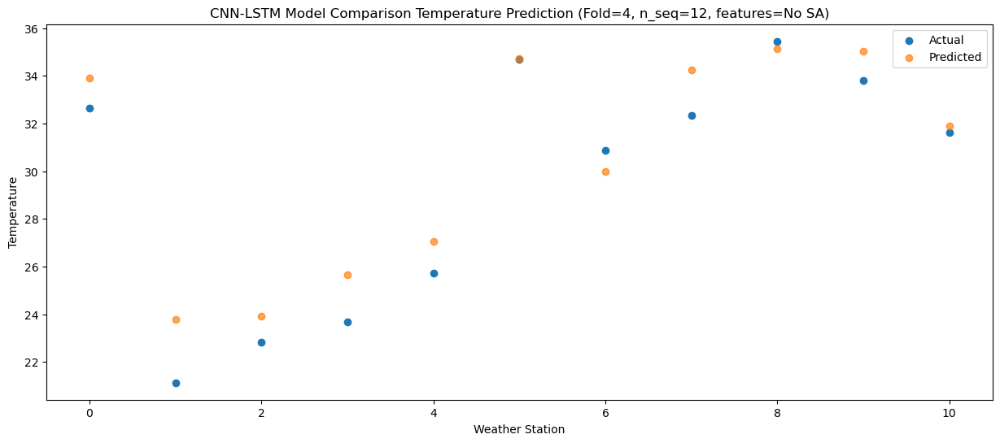

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   29.45  30.488916
1                 1   19.84  21.070689
2                 2   19.69  20.590670
3                 3   20.90  22.233411
4                 4   22.31  23.631659
5                 5   34.01  31.695693
6                 6   26.89  26.930092
7                 7   29.31  30.738416
8                 8   31.96  31.618238
9                 9   30.71  31.510643
10               10   27.34  28.367349


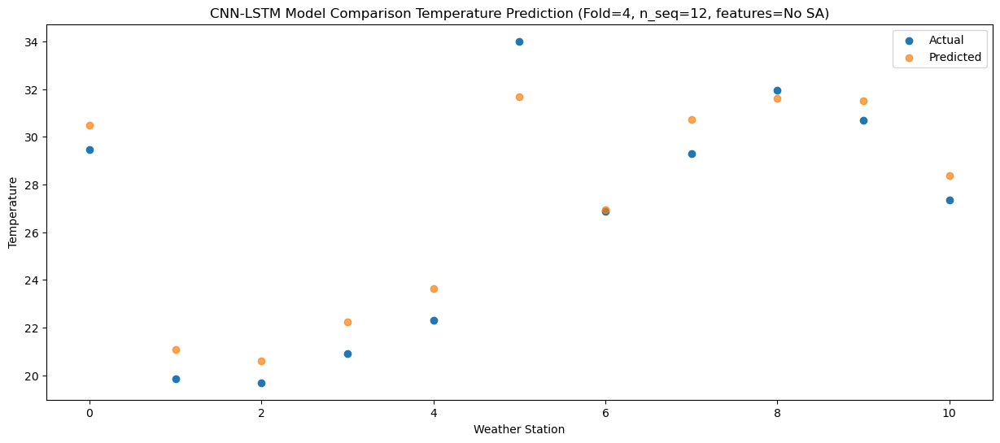

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   22.32  24.435190
1                 1   18.00  16.939521
2                 2   16.30  16.340327
3                 3   16.25  16.749039
4                 4   17.44  18.071851
5                 5   28.31  26.325488
6                 6   23.09  22.861486
7                 7   23.54  25.255510
8                 8   26.61  26.275883
9                 9   25.25  25.677661
10               10   23.81  23.559908


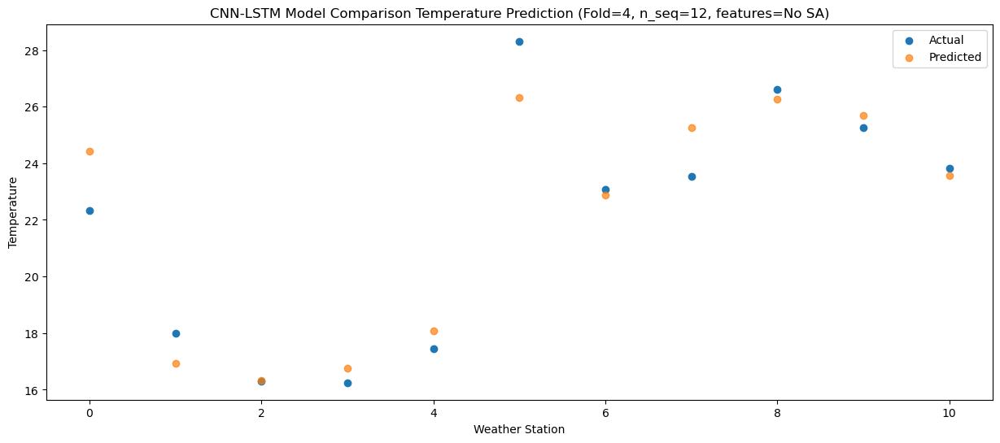

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   15.26  14.546743
1                 1   10.84   9.974839
2                 2    7.63   6.806336
3                 3    8.25   7.126271
4                 4    9.60   8.516589
5                 5   21.37  18.796237
6                 6   14.93  13.746493
7                 7   15.60  15.217927
8                 8   15.75  15.903304
9                 9   14.94  15.491079
10               10   13.41  13.299294


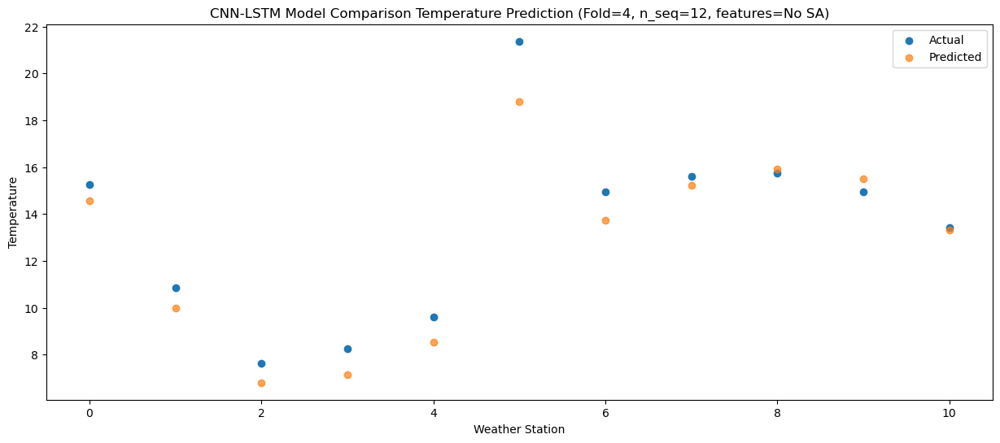

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   13.47  13.002305
1                 1   12.64   8.799689
2                 2   11.14   7.264115
3                 3   10.25   6.442695
4                 4   11.34   7.734896
5                 5   21.78  17.731658
6                 6   16.84  14.534189
7                 7   17.06  14.451878
8                 8   16.07  15.238852
9                 9   14.69  14.177238
10               10   12.55  13.209498


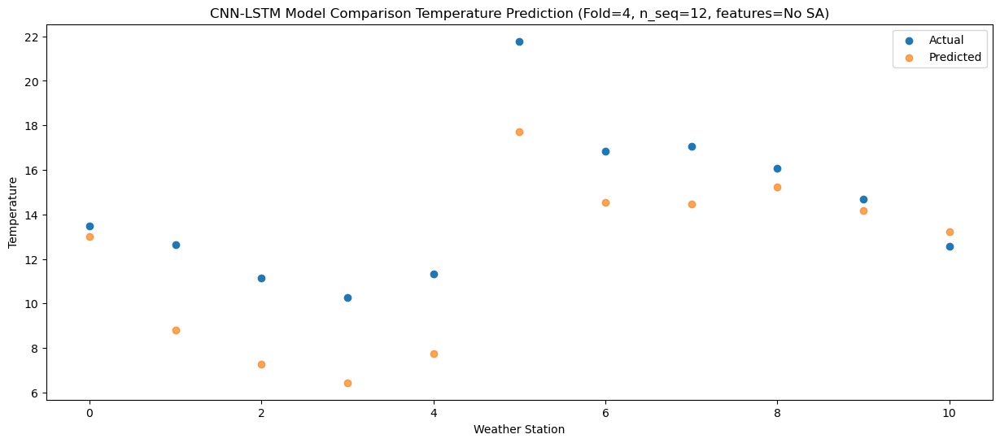

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_12 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_8 (LSTM)               (None, 1, 512)            2099200   
                                                                 
 dropout_13 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_9 (LSTM)               (None, 512)               2099200   
                                                      

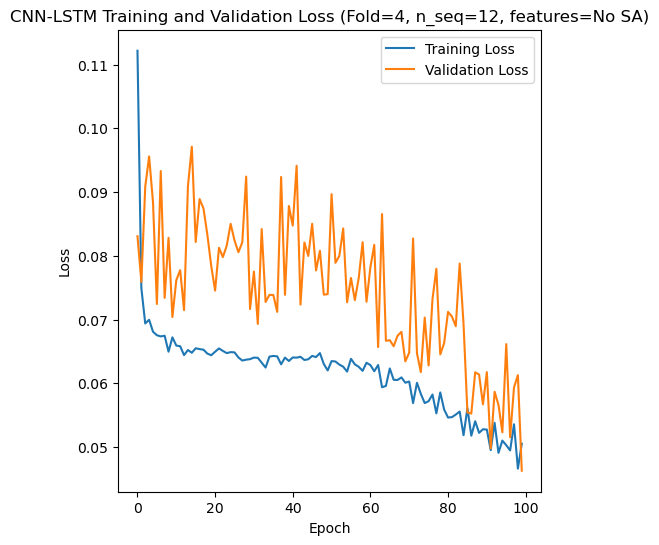

[[0.7700648644262514, 2.3602028604756553, 1.1207696031626209, 1.1547964618709243, 1.312239360144137, 1.7537411173779207, 1.8296080744410912, 1.5591029273345103, 1.2778623978699295, 0.897914376911854, 1.1998661106197048, 1.4522321297185867], [1.241115271762108, 2.1238574028016317, 1.7160986464291657, 0.982629045607863, 1.0683724385582714, 1.8454732571593455, 2.2700708185888043, 2.224412095821346, 2.241346410734286, 1.228295949377704, 1.7714022664021276, 1.8976416213078626], [1.1853066502409442, 1.7938949955109027, 2.639542852946355, 2.592414990764763, 3.1061534841283462, 3.239556704005821, 2.648011639766196, 2.496474074891898, 2.538397570529549, 1.6001621599694131, 2.0769969561655772, 2.640798746618354], [1.5589348604947213, 2.3132834206529567, 2.0210007287514555, 2.200818206659382, 2.1414992639587225, 3.202892278003632, 3.760614641840281, 3.2084910834700606, 2.461154646730241, 2.3513635259033507, 1.9182739130052797, 2.491412071802621], [0.8231181751342825, 1.776369451302035, 1.37457785

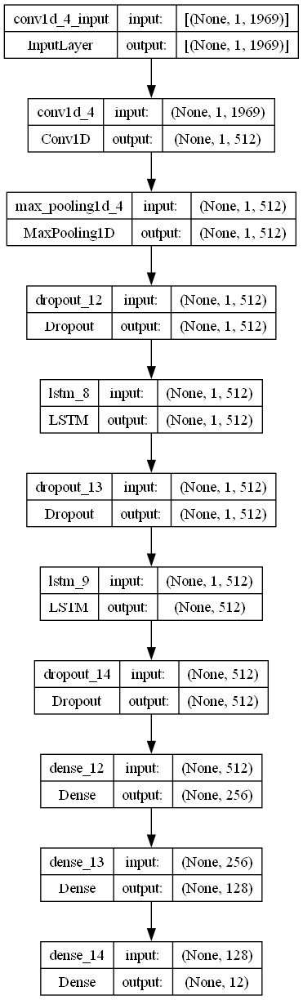

In [3]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 512
    lr = 0.18576917071132834
    optimizer = SGD(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 512
    dropout_rate = 0.4424784866955254

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# make one forecast with a CNN-LSTM model,
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_CV_S12_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)